In [84]:
import numpy as np
import numpy.linalg as la
from scipy import spatial
import matplotlib.pyplot as plt
from math import *
import time

%matplotlib inline

$$
T(x) =  \begin{pmatrix} a_0 + (1+a_2) x_0 + a_3 x_1 + a_5 a_6^2 (x_0+a_7) e^{-0.5 (a_6^2(x_0+a_7)^2 + a_8^2(x_1+a_9^2))} \\ a_1 + (1+a_4) x_1 + a_3 x_0 + a_5 a_8^2 (x_1+a_9) e^{-0.5 (a_6^2(x_0+a_7)^2 + a_8^2(x_1+a_9^2))} \end{pmatrix}\\
 = T_0(x) + T_1(x)
$$
and  
$$
g(z) =b_0 + b_1 z_0 + b_2 z_1 + 0.5 b_3 z_0^2 + b_4 z_0z_1 + 0.5 B_5 z_1^2 + \beta_6 \exp \left( -\frac{1}{2}\beta_7^2((z_0+b_8)^2 + (z_1+b_9)^2) \right) + \beta_{10} \exp \left( -\frac{1}{2}\beta_{11}^2((z_0+b_{12})^2 + (z_1+b_{13})^2) \right) \\
 = g_0(z) + g_1(z) + g_2(z)
$$

Penalization:
$a_6,b_7, b_{10}$ penalized as $e^{\epsilon^2 \sigma^2 } - 1/(D^2 \sigma^2)$

$a_7,a_8,b_8,b_9,b_{12},b_{13}$ penalized as $m^2/(10 D^2)$
where $D$ is an estimate of the size of the support of the data (e.g. std), $\epsilon = \max_i \min_j |x_i-y_j|$

# Data samples

In [87]:
d = 2
Nx = 200
Ny = 100

# #Guassians
# mx = np.array([0,0])
# sx = np.array([[1.0,0.0],[0.0,1.0]])
# my = np.array([5,5])
# sy = np.array([[9.0,0.0],[0.0,9.0]])
# x = np.random.multivariate_normal(mx,sx,Nx)
# y = np.random.multivariate_normal(my,sy,Ny)

#Gaussian to 2 mixed Gaussian
mx = np.array([0,0])
sx = np.array([[4.0,0.0],[0.0,4.0]])
my1 = np.array([4,0])
sy1 = np.array([[1.0,0.0],[0.0,1.0]])
my2 = np.array([-4,0])
sy2 = np.array([[1.0,0.0],[0.0,1.0]])
x = np.random.multivariate_normal(mx,sx,Nx)
y1 = np.random.multivariate_normal(my1,sy1,Ny)
y2 = np.random.multivariate_normal(my2,sy2,Ny)
y = np.concatenate([y1,y2],axis=0)

# #Gaussian to compressed gaussian
# mx = np.array([0,0])
# sx = np.array([[1.0,0.0],[0.0,1.0]])
# x = np.random.multivariate_normal(mx,sx,Nx)
# z = np.random.multivariate_normal(np.array([1,1]),sx,Ny)
# y = np.einsum('i,ij->ij',np.tanh(0.5*la.norm(z,axis=1)),z)

# #Gaussian to annulus
# mx = np.array([-2,0])
# sx = np.array([[1.0,0.0],[0.0,1.0]])
# x = np.random.multivariate_normal(mx,sx,Nx)
# r = 2*np.sqrt(np.random.uniform(0.8,1,Ny))
# theta = 2*pi*np.random.uniform(0,1,Ny)
# y = np.zeros((Ny,2))
# y[:,0]=r*np.cos(theta)
# y[:,1]=r*np.sin(theta)

# #mixed 2 Gaussian to mixed 4 Gaussian
# mx = np.array([0,0])
# sx = np.array([[1.0,0.0],[0.0,1.0]])
# my1 = np.array([4,0])
# sy1 = np.array([[1.0,0.0],[0.0,1.0]])
# my2 = np.array([-4,0])
# sy2 = np.array([[1.0,0.0],[0.0,1.0]])
# x1 = np.random.multivariate_normal(np.array([2,0]),sx,Nx)
# x2 = np.random.multivariate_normal(np.array([-2,0]),sx,Nx)
# x = np.concatenate([x1,x2],axis=0)
# y1 = np.random.multivariate_normal(my1,sy1,Ny)
# y2 = np.random.multivariate_normal(my2,sy2,Ny)
# y3 = np.random.multivariate_normal(np.array([0,-4]),sy2,Ny)
# y4 = np.random.multivariate_normal(np.array([0,4]),sy2,Ny)
# y = np.concatenate([y1,y2,y3,y4],axis=0)

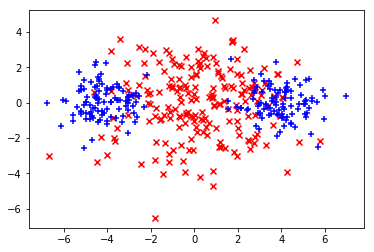

In [88]:
plt.scatter(x[:,0],x[:,1], color='red', marker = 'x');
plt.scatter(y[:,0],y[:,1], color='blue', marker = '+');

# Local Algorithm

## GH

In [91]:
d = 2
Nx = len(x)
Ny = len(y)
da = 10
db = 14

#Precomputed data, (twisted) gradient and Hessian
# xh = np.concatenate([x.reshape(Nx,d),np.ones((Nx,d))],axis=1)

gammaA = 1*1e-1 #alpha regularization parameter 
gammaB = 2*1e-1 #beta regularization parameter

def GH(a,b,eps,D):
    x0 = x[:,0]
    x1 = x[:,1]
    x0a7 = x0+a[7]
    x0a72 = x0a7**2
    x1a9 = x1+a[9]
    x1a92 = x1a9**2
    x0a7x1a9 = x0a7*x1a9
    argexpT = a[6]**2*x0a72+a[8]**2*x1a92
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = a[0] + (1+a[2])*x0+a[3]*x1+a[5]*a[6]**2*x0a7*expT
    T[:,1] = a[1] + a[3]*x0+(1+a[4])*x1+a[5]*a[8]**2*x1a9*expT
    T0 = T[:,0]
    T1 = T[:,1]
    y0 = y[:,0]
    y1 = y[:,1]
    g0y = b[0]+ b[1]*y0+b[2]*y1+0.5*b[3]*y0**2+b[4]*y0*y1+0.5*b[5]*y1**2
    y0b8 = y0+b[8]
    y1b9 = y1+b[9]
    y0b12 = y0+b[12]
    y1b13 = y1+b[13]
    argexpy1 =  b[7]**2*(y0b8**2+y1b9**2)
    expy1 = np.exp(-0.5*argexpy1)
    argexpy2 =  b[11]**2*(y0b12**2+y1b13**2)
    expy2 = np.exp(-0.5*argexpy2)
    g1y = b[6]*expy1
    g2y = b[10]*expy2
    gy = g0y + g1y + g2y
    g0T =b[0]+ b[1]*T0+b[2]*T1+0.5*b[3]*T0**2+b[4]*T0*T1+0.5*b[5]*T1**2
    T0b8 = T0+b[8]
    T1b9 = T1+b[9]
    T0b12 = T0+b[12]
    T1b13 = T1+b[13]
    argexpT1 =  b[7]**2*(T0b8**2+T1b9**2)
    expT1 = np.exp(-0.5*argexpT1)
    argexpT2 =  b[11]**2*(T0b12**2+T1b13**2)
    expT2 = np.exp(-0.5*argexpT2)
    g1T = b[6]*expT1
    g2T = b[10]*expT2
    gT = g0T + g1T + g2T   

    #first derivatives
    gzT = np.zeros((Nx,2))
    gzT[:,0] = b[1]+b[3]*T0+b[4]*T1
    gzT[:,0] += -b[6]*b[7]**2*T0b8*expT1
    gzT[:,0] += -b[10]*b[11]**2*T0b12*expT2
    gzT[:,1] = b[2]+b[4]*T0+b[5]*T1
    gzT[:,1] += -b[6]*b[7]**2*T1b9*expT1
    gzT[:,1] += -b[10]*b[11]**2*T1b13*expT2

    daT = np.zeros((Nx,da,d))
    daT[:,0,:] = np.array([1,0])
    daT[:,1,:] = np.array([0,1])
    daT[:,2,0] = x0
    daT[:,3,0] = x1
    daT[:,3,1] = x0
    daT[:,4,1] = x1
    daT[:,5,0] = expT*a[6]**2*x0a7
    daT[:,5,1] = expT*a[8]**2*x1a9
    daT[:,6,0] = a[5]*a[6]*expT*x0a7*(2-a[6]**2*x0a72)
    daT[:,6,1] = -a[5]*a[8]**2*a[6]*x0a72*x1a9*expT
    daT[:,7,0] = a[5]*a[6]**2*expT*(1-a[6]**2*x0a72)
    daT[:,7,1] = -a[5]*a[8]**2*a[6]**2*x0a7x1a9*expT
    daT[:,8,0] = -a[5]*a[6]**2*a[8]*x1a92*x0a7*expT
    daT[:,8,1] = a[5]*a[8]*x1a9*(2-a[8]**2*x1a92)*expT
    daT[:,9,0] = -a[5]*a[6]**2*a[8]**2*x0a7x1a9*expT
    daT[:,9,1] = a[5]*a[8]**2*(1-a[8]**2*x1a92)*expT

    #gradient w.r.t. a
    penalty_a = np.zeros(da)
    penalty_a[6] = a[6]*eps**2*np.exp((a[6]**2+a[8]**2)*eps**2) - 0*1.0/(D**2 * a[6]**3)
    penalty_a[8] = a[8]*eps**2*np.exp((a[6]**2+a[8]**2)*eps**2) - 0*1.0/(D**2 * a[8]**3)
    penalty_a[7] = a[7] * 1.0/(10*D**2)
    penalty_a[9] = a[9] * 1.0/(10*D**2)
    daL = (1.0/Nx) * np.einsum('ijk,ik->j',daT,gzT) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penalty_a

    expgy = np.exp(gy)
    dbgy = np.zeros((Ny,db))
    dbgT = np.zeros((Nx,db))
    dbgy[:,0] = np.ones(Ny)
    dbgT[:,0] = np.ones(Nx)
    dbgy[:,1] = y0
    dbgT[:,1] = T0
    dbgy[:,2] = y1
    dbgT[:,2] = T1
    dbgy[:,3] = 0.5*y0**2
    dbgT[:,3] = 0.5*T0**2
    dbgy[:,4] = y0*y1
    dbgT[:,4] = T0*T1
    dbgy[:,5] = 0.5*y1**2
    dbgT[:,5] = 0.5*T1**2
    dbgy[:,6] = expy1
    dbgT[:,6] = expT1
    dbgy[:,7] = -b[6]*b[7]*argexpy1*expy1
    dbgT[:,7] = -b[6]*b[7]*argexpT1*expT1
    dbgy[:,8] = -b[6]*b[7]**2*y0b8*expy1
    dbgT[:,8] = -b[6]*b[7]**2*T0b8*expT1
    dbgy[:,9] = -b[6]*b[7]**2*y1b9*expy1
    dbgT[:,9] = -b[6]*b[7]**2*T1b9*expT1
    dbgy[:,10] = expy2
    dbgT[:,10] = expT2
    dbgy[:,11] = -b[10]*b[11]*argexpy2*expy2
    dbgT[:,11] = -b[10]*b[11]*argexpT2*expT2
    dbgy[:,12] = -b[10]*b[11]**2*y0b12*expy2
    dbgT[:,12] = -b[10]*b[11]**2*T0b12*expT2
    dbgy[:,13] = -b[10]*b[11]**2*y1b13*expy2
    dbgT[:,13] = -b[10]*b[11]**2*T1b13*expT2
    #gradient w.r.t. b
    penalty_b = np.zeros(db)
    penalty_b[7] = b[7]*eps**2 * np.exp(eps**2 * b[7]**2) - 1.0/(D**2 * b[7]**3)
    penalty_b[11] = b[11]*eps**2 * np.exp(eps**2 * b[11]**2) - 1.0/(D**2 * b[11]**3)
    penalty_b[8] = b[8] * 1.0/(10*D**2)
    penalty_b[9] = b[9] * 1.0/(10*D**2)
    penalty_b[12] = b[12] * 1.0/(10*D**2)
    penalty_b[13] = b[13] * 1.0/(10*D**2)
    dbL = (1.0/Nx)*np.sum(dbgT,axis=0) - (1.0/Ny)*np.einsum('ik,i->k',dbgy,expgy) - gammaB*penalty_b

    #twisted gradient
    G = np.concatenate([daL,-dbL],axis=0)

    #Second derivatives
    gzzT = np.zeros((Nx,d,d))
    gzzT[:,0,0] = b[3] - b[6]*b[7]**2*(1-b[7]**2*T0b8**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12**2)*expT2
    gzzT[:,1,0] = b[4] - b[6]*b[7]**2*(1-b[7]**2*T0b8*T1b9)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12*T1b13)*expT2
    gzzT[:,0,1] = gzzT[:,1,0]
    gzzT[:,1,1] = b[5] - b[6]*b[7]**2*(1-b[7]**2*T1b9**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T1b13**2)*expT2

    daaT = np.zeros((Nx,da,da,d))
    daaT[:,5,6,0] = a[6]*x0a7*expT*(2-a[6]**2*x0a72)
    daaT[:,6,5,0] = daaT[:,5,6,0]
    daaT[:,5,6,1] = -a[8]**2*a[6]*x0a72*x1a9*expT
    daaT[:,6,5,1] = daaT[:,5,6,1]
    daaT[:,5,7,0] = a[6]**2*expT*(1-a[6]**2*x0a72)
    daaT[:,7,5,0] = daaT[:,5,7,0]
    daaT[:,5,7,1] = -a[8]**2*a[6]**2*x0a7x1a9*expT
    daaT[:,7,5,1] = daaT[:,5,7,1]
    daaT[:,5,8,0] = -a[6]**2*a[8]*x1a92*x0a7*expT
    daaT[:,8,5,0] = daaT[:,5,8,0]
    daaT[:,5,8,1] = a[8]*x1a9*(2-a[8]**2*x1a92)*expT
    daaT[:,8,5,1] = daaT[:,5,8,1]
    daaT[:,5,9,0] = -a[6]**2*a[8]**2*x0a7x1a9*expT
    daaT[:,9,5,0] = daaT[:,5,9,0]
    daaT[:,5,9,1] = a[8]**2*(1-a[8]**2*x1a92)*expT
    daaT[:,9,5,1] = daaT[:,5,9,1]
    daaT[:,6,6,0] = a[5]*x0a7*expT*(2-3*a[6]**2*x0a72-a[6]**2*(2-a[6]**2*x0a72)*x0a72)
    daaT[:,6,6,1] = -a[5]*a[8]**2*x0a72*(1-a[6]**2*x0a72)*x1a9*expT
    daaT[:,6,7,0] = a[5]*a[6]*expT*(2-5*a[6]**2*x0a72+a[6]**4*x0a7**4)
    daaT[:,6,7,1] = -a[5]*a[8]**2*x0a7x1a9*a[6]*(2-a[6]**2*x0a72)*expT
    daaT[:,7,6,0] = daaT[:,6,7,0]
    daaT[:,7,6,1] = daaT[:,6,7,1]
    daaT[:,6,8,0] = -a[5]*a[6]*x0a7*a[8]*x1a92*(2-a[6]**2*x0a72)*expT
    daaT[:,8,6,0] = daaT[:,6,8,0]
    daaT[:,6,8,1] = -a[5]*a[8]*expT*x1a9*x0a72*a[6]*(2-a[8]**2*x1a92)
    daaT[:,8,6,1] = daaT[:,6,8,1]
    daaT[:,6,9,0] = -a[5]*a[6]*expT*x0a7x1a9*a[8]**2*(2-a[6]**2*x0a72)
    daaT[:,9,6,0] = daaT[:,6,9,0]
    daaT[:,6,9,1] = -a[5]*a[8]**2*a[6]*x0a72*(1-a[8]**2*x1a92)*expT
    daaT[:,9,6,1] = daaT[:,6,9,1]
    daaT[:,7,7,0] = -a[5]*a[6]**2*(2*a[6]**2*x0a7+(1-a[6]**2*x0a72)*a[6]**2*x0a7)*expT
    daaT[:,7,7,1] = -a[5]*a[8]**2*x1a9*a[6]**2*(1-a[6]**2*x0a72)*expT
    daaT[:,7,8,0] = -a[5]*a[6]**2*a[8]*x1a92*(1-a[6]**2*x0a72)*expT
    daaT[:,8,7,0] = daaT[:,7,8,0]
    daaT[:,7,8,1] = -a[5]*a[8]*x0a7x1a9*a[6]**2*(2-a[8]**2*x1a92)*expT
    daaT[:,8,7,1] = daaT[:,7,8,1]
    daaT[:,7,9,0] = -a[5]*a[6]**2*a[8]**2*x1a9*(1-a[6]**2*x0a72)*expT
    daaT[:,9,7,0] = daaT[:,7,9,0]
    daaT[:,7,9,1] = -a[5]*a[8]**2*a[6]**2*x0a7*(1-a[8]**2*x1a92)*expT
    daaT[:,9,7,1] = daaT[:,7,9,1]
    daaT[:,8,8,0] = -a[5]*a[6]*x1a92*x0a7*(1-a[8]**2*x1a92)*expT
    daaT[:,8,8,1] = a[5]*x1a9*(2-3*a[8]**2*x1a92-a[8]**2*(2-a[8]**2*x1a92)*x1a92)*expT
    daaT[:,8,9,0] = -a[5]*a[6]**2*x0a7x1a9*a[8]*(2-a[8]**2*x1a92)*expT
    daaT[:,9,8,0] = daaT[:,8,9,0]
    daaT[:,8,9,1] = a[5]*a[8]*(2-5*a[8]**2*x1a92+a[8]**4*x1a9**4)*expT
    daaT[:,9,8,1] = daaT[:,8,9,1]
    daaT[:,9,9,0] = -a[5]*a[6]**2*x0a7*a[8]**2*(1-a[8]**2*x1a92)*expT
    daaT[:,9,9,1] = -a[5]*a[8]**2*(2*a[8]**2*x1a9+(1-a[8]**2*x1a92)*a[8]**2*x1a9)*expT
    #Hessian w.r.t. aa
    penaltyH_a = np.zeros((da,da))
    penaltyH_a[6,6] = eps**2 * np.exp((a[6]**2+a[8]**2)*eps**2)*(1.0+2.0*a[6]**2*eps**2) + 0*3/(D**2 * a[6]**4)
    penaltyH_a[8,8] = eps**2 * np.exp((a[6]**2+a[8]**2)*eps**2)*(1.0+2.0*a[8]**2*eps**2) + 0*3/(D**2 * a[8]**4)
    penaltyH_a[7,7] = 1*1.0/(10*D**2)
    penaltyH_a[9,9] = 1*1.0/(10*D**2)
    daaL = (1.0/Nx)*(np.einsum('ijkl,il->jk',daaT,gzT) + np.einsum('ijl,ilm,ikm->jk',daT,gzzT,daT)) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penaltyH_a

    dbzgT = np.zeros((Nx,db,d))
    dbzgT[:,1,0]=np.ones(Nx)
    dbzgT[:,2,1]=np.ones(Nx)
    dbzgT[:,3,0]=T0
    dbzgT[:,4,0]=T1
    dbzgT[:,4,1]=T0
    dbzgT[:,5,1]=T1
    dbzgT[:,6,0]=-b[6]**2*T0b8*expT1
    dbzgT[:,6,1]=-b[6]**2*T1b9*expT1
    dbzgT[:,7,0]=-b[6]*b[7]*expT1*T0b8*(2-argexpT1)
    dbzgT[:,7,1]=-b[6]*b[7]*expT1*T1b9*(2-argexpT1)
    dbzgT[:,8,0]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T0b8**2)
    dbzgT[:,8,1]=b[6]*b[7]**4*expT1*T0b8*T1b9
    dbzgT[:,9,0]=dbzgT[:,8,1]
    dbzgT[:,9,1]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T1b9**2)
    dbzgT[:,10,0]=-b[10]**2*T0b12*expT2
    dbzgT[:,10,1]=-b[10]**2*T1b13*expT2
    dbzgT[:,11,0]=-b[10]*b[11]*expT2*T0b12*(2-argexpT2)
    dbzgT[:,11,1]=-b[10]*b[11]*expT2*T1b13*(2-argexpT2)
    dbzgT[:,12,0]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T0b12**2)
    dbzgT[:,12,1]=b[10]*b[11]**4*expT2*T0b12*T1b13
    dbzgT[:,13,0]=dbzgT[:,12,1]
    dbzgT[:,13,1]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T1b13**2)
    # #Hessian w.r.t. ab
    dabL = (1.0/Nx)*np.einsum('ikl,ijl->jk',dbzgT,daT)

    dbbgy = np.zeros((Ny,db,db))
    dbbgT = np.zeros((Nx,db,db))
    dbbgy[:,6,7] = -b[7]*(y0b8**2+y1b9**2)*expy1
    dbbgy[:,7,6] = dbbgy[:,6,7]
    dbbgy[:,6,8] = -b[7]**2*y0b8*expy1
    dbbgy[:,8,6] = dbbgy[:,6,8]
    dbbgy[:,6,9] = -b[7]**2*y1b9*expy1
    dbbgy[:,9,6] = dbbgy[:,6,9]
    dbbgy[:,7,7] = -b[6]*(y0b8**2+y1b9**2)*expy1*(1-argexpy1)
    dbbgy[:,7,8] = -b[6]*b[7]*expy1*y0b8*(2-argexpy1)
    dbbgy[:,8,7] = dbbgy[:,7,8]
    dbbgy[:,7,9] = -b[6]*b[7]*expy1*y1b9*(2-argexpy1)
    dbbgy[:,9,7] = dbbgy[:,7,9]
    dbbgy[:,8,8] = -b[6]*b[7]**2*expy1*(1-y0b8**2*b[7]**2)
    dbbgy[:,8,9] = b[6]*b[7]**4*y0b8*y1b9*expy1
    dbbgy[:,9,8] = dbbgy[:,8,9] 
    dbbgy[:,9,9] = -b[6]*b[7]**2*expy1*(1-y1b9**2*b[7]**2)
    dbbgy[:,10,11] = -b[11]*(y0b12**2+y1b13**2)*expy2
    dbbgy[:,11,10] = dbbgy[:,10,11]
    dbbgy[:,10,12] = -b[11]**2*y0b12*expy2
    dbbgy[:,12,10] = dbbgy[:,10,12]
    dbbgy[:,10,13] = -b[11]**2*y1b13*expy2
    dbbgy[:,13,10] = dbbgy[:,10,13]
    dbbgy[:,11,11] = -b[10]*(y0b12**2+y1b13**2)*expy2*(1-argexpy2)
    dbbgy[:,11,12] = -b[10]*b[11]*expy2*y0b12*(2-argexpy2)
    dbbgy[:,12,11] = dbbgy[:,11,12]
    dbbgy[:,11,13] = -b[10]*b[11]*expy2*y1b13*(2-argexpy2)
    dbbgy[:,13,11] = dbbgy[:,11,13]
    dbbgy[:,12,12] = -b[10]*b[11]**2*expy2*(1-y0b12**2*b[11]**2)
    dbbgy[:,12,13] = b[10]*b[11]**4*y0b12*y1b13*expy2
    dbbgy[:,13,12] = dbbgy[:,12,13] 
    dbbgy[:,13,13] = -b[10]*b[11]**2*expy2*(1-y1b13**2*b[11]**2)
    dbbgT[:,6,7] = -b[7]*(T0b8**2+T1b9**2)*expT1
    dbbgT[:,7,6] = dbbgT[:,6,7]
    dbbgT[:,6,8] = -b[7]**2*T0b8*expT1
    dbbgT[:,8,6] = dbbgT[:,6,8]
    dbbgT[:,6,9] = -b[7]**2*T1b9*expT1
    dbbgT[:,9,6] = dbbgT[:,6,9]
    dbbgT[:,7,7] = -b[6]*(T0b8**2+T1b9**2)*expT1*(1-argexpT1)
    dbbgT[:,7,8] = -b[6]*b[7]*expT1*T0b8*(2-argexpT1)
    dbbgT[:,8,7] = dbbgT[:,7,8]
    dbbgT[:,7,9] = -b[6]*b[7]*expT1*T1b9*(2-argexpT1)
    dbbgT[:,9,7] = dbbgT[:,7,9]
    dbbgT[:,8,8] = -b[6]*b[7]**2*expT1*(1-T0b8**2*b[7]**2)
    dbbgT[:,8,9] = b[6]*b[7]**4*T0b8*T1b9*expT1
    dbbgT[:,9,8] = dbbgT[:,8,9] 
    dbbgT[:,9,9] = -b[6]*b[7]**2*expT1*(1-T1b9**2*b[7]**2)
    dbbgT[:,10,11] = -b[11]*(T0b12**2+T1b13**2)*expT2
    dbbgT[:,11,10] = dbbgT[:,10,11]
    dbbgT[:,10,12] = -b[11]**2*T0b12*expT2
    dbbgT[:,12,10] = dbbgT[:,10,12]
    dbbgT[:,10,13] = -b[11]**2*T1b13*expT2
    dbbgT[:,13,10] = dbbgT[:,10,13]
    dbbgT[:,11,11] = -b[10]*(T0b12**2+T1b13**2)*expT2*(1-argexpT2)
    dbbgT[:,11,12] = -b[10]*b[11]*expT2*T0b12*(2-argexpT2)
    dbbgT[:,12,11] = dbbgT[:,11,12]
    dbbgT[:,11,13] = -b[10]*b[11]*expT2*T1b13*(2-argexpT2)
    dbbgT[:,13,11] = dbbgT[:,11,13]
    dbbgT[:,12,12] = -b[10]*b[11]**2*expT2*(1-T0b12**2*b[11]**2)
    dbbgT[:,12,13] = b[10]*b[11]**4*T0b12*T1b13*expT2
    dbbgT[:,13,12] = dbbgT[:,12,13] 
    dbbgT[:,13,13] = -b[10]*b[11]**2*expT2*(1-T1b13**2*b[11]**2)

    dbgdbg = np.einsum('jn,jm->jnm',dbgy,dbgy)
    #Hessian w.r.t. bb
    penaltyH_b = np.zeros((db,db))
    # penaltyH_b[5,5] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
    # penaltyH_b[8,8] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
    # penaltyH_b[5,8] = -1*6*eps**2 *(b[5]-b[8])**(-4)
    # penaltyH_b[8,5] = -1*6*eps**2 *(b[5]-b[8])**(-4)
    penaltyH_b[7,7] = eps**2 * np.exp((b[7]*eps)**2)*(1.0+2.0*b[7]**2*eps**2) + 3/(D**2 * b[7]**4)
    penaltyH_b[8,8] = 1*1.0/(10*D**2)
    penaltyH_b[9,9] = 1*1.0/(10*D**2)
    penaltyH_b[11,11] = eps**2 * np.exp((b[11]*eps)**2)*(1.0+2.0*b[11]**2*eps**2) + 3/(D**2 * b[11]**4)
    penaltyH_b[12,12] = 1*1.0/(10*D**2)
    penaltyH_b[13,13] = 1*1.0/(10*D**2)
    dbbL = (1.0/Nx)*np.sum(dbbgT,axis=0) - (1.0/Ny)*np.einsum('jnm,j->nm',(dbbgy+dbgdbg),expgy) - gammaB*penaltyH_b

    # #Twisted Hessian
    H = np.zeros((da+db,da+db))
    H[:da,:da] = daaL
    H[:da,da:] = dabL
    H[da:,:da] = -dabL.T
    H[da:,da:] = -dbbL
    return(G,H)

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:50: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:51: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


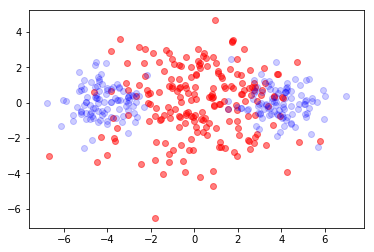

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:115: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:116: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


a [0.        0.        0.        0.        0.        0.        0.2390035
 0.        0.2390035 0.       ]
b [-0.006983    0.06363688 -0.02356917 -0.08319993  0.02422664  0.51061462
  0.          0.2390035  -0.07038426  0.0756484   0.          0.2390035
 -0.09258707  0.06682123]
Step n= 0


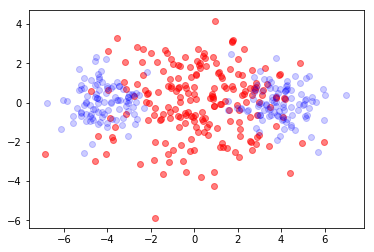

a [-1.16616929e-03  1.90720690e-03  2.87608286e-02 -1.03071907e-02
 -9.64574964e-02 -2.42580775e-03  2.25372967e-01  2.10284049e-07
  2.25431164e-01  2.24375528e-07]
b [ 0.01807208  0.05712392 -0.02834776 -0.12854087  0.02133449  0.56821891
  0.02329881  0.20202941 -0.07036523  0.07564334  0.02329394  0.20202914
 -0.09256598  0.06681683]
Step n= 1


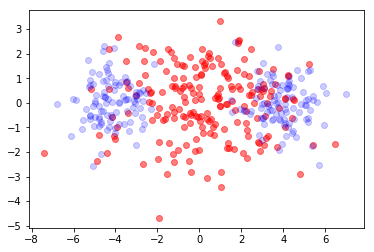

a [-1.50273886e-03  6.90045238e-03  1.12883221e-01 -1.90971870e-02
 -2.76747634e-01 -5.46253956e-03  2.08776819e-01  6.29030561e-07
  2.09120802e-01  6.81368080e-07]
b [ 0.07181487  0.04893955 -0.03860956 -0.16315569  0.01165527  0.62641062
  0.07522541  0.18548424 -0.07031721  0.07563893  0.07521155  0.18548348
 -0.09251173  0.06681464]
Step n= 2


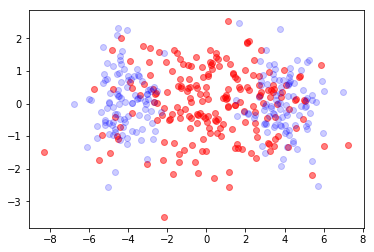

a [ 4.35975632e-04  1.44483084e-02  2.47420812e-01 -1.85248087e-02
 -4.55713730e-01 -6.69763309e-03  1.95908920e-01  5.43308243e-07
  1.96693070e-01  2.65298064e-07]
b [ 0.1337889   0.04107542 -0.05111077 -0.17009693  0.00349875  0.6386241
  0.13753534  0.18530419 -0.0702495   0.07564591  0.13750927  0.18530351
 -0.0924335   0.06682565]
Step n= 3


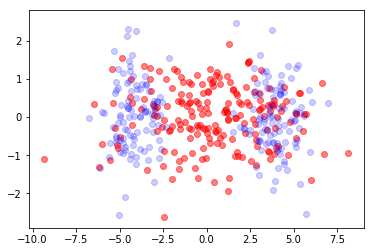

a [ 4.06173005e-03  2.28463214e-02  4.00840643e-01 -1.48813913e-02
 -5.88678963e-01 -6.15758599e-03  1.87578202e-01  1.16437537e-07
  1.88725369e-01 -6.90966510e-07]
b [ 0.18324568  0.03524913 -0.0615059  -0.15721672  0.00228487  0.61200379
  0.18904762  0.18765946 -0.07016616  0.07565904  0.18901052  0.18765894
 -0.09233818  0.06684351]
Step n= 4


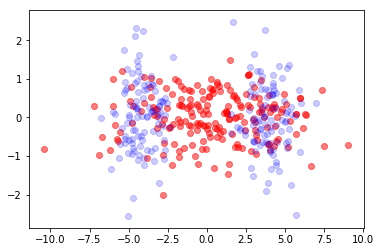

a [ 8.43113927e-03  3.14947396e-02  5.60063162e-01 -1.29040344e-02
 -6.83760327e-01 -4.54113980e-03  1.81853318e-01 -2.74252837e-07
  1.83217477e-01 -1.56150345e-06]
b [ 0.21472039  0.0317983  -0.0677507  -0.1366923   0.00478487  0.55871149
  0.22346469  0.19036063 -0.07006189  0.07566444  0.22341852  0.19036002
 -0.09222253  0.0668533 ]
Step n= 5


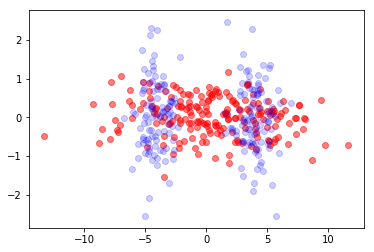

a [-4.78421832e-03  3.62486201e-02  1.00140175e+00 -3.52410374e-02
 -7.47342483e-01  3.94012716e-03  1.62040696e-01  6.37377381e-06
  1.60845174e-01  8.75847336e-06]
b [ 0.1167954   0.03459456 -0.01142272 -0.01531723  0.01168191  0.16568541
  0.14837403  0.19166728 -0.06938549  0.07516593  0.14830965  0.19166774
 -0.09152246  0.06635772]
Step n= 6


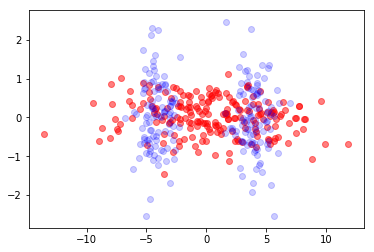

a [-7.29542621e-03  3.71849672e-02  1.03683167e+00 -3.72604785e-02
 -7.60288995e-01  4.42426600e-03  1.61585617e-01  6.10886757e-06
  1.60342721e-01  8.82430058e-06]
b [ 0.09572277  0.03241421 -0.01007613 -0.02341069  0.00367177  0.11387057
  0.13784864  0.19590281 -0.06928572  0.07514847  0.13776993  0.19590241
 -0.09141764  0.06634133]
Step n= 7


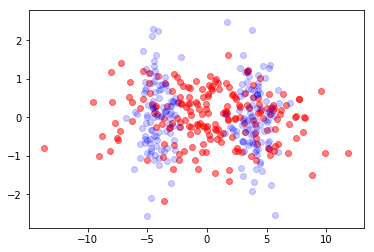

a [-5.63884856e-02  3.32248921e-02  1.04198682e+00 -3.41404468e-02
 -6.50235764e-01  6.68755709e-03  1.56787865e-01  1.81581933e-07
  1.55412814e-01  9.08470093e-06]
b [-0.03973188  0.0305341   0.00718182  0.00303069 -0.00182319 -0.11994413
  0.10555304  0.19904541 -0.06860509  0.07485596  0.10536918  0.19904363
 -0.09067536  0.06606435]
Step n= 8


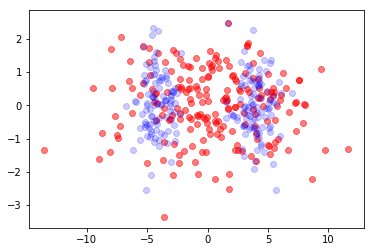

a [-1.09191678e-01  2.83384677e-02  1.01787219e+00 -3.46868923e-02
 -4.68556051e-01  9.74496638e-03  1.53303274e-01 -1.01103479e-05
  1.52480084e-01  8.90496060e-06]
b [-0.14241145  0.0283083   0.00128586  0.00442531  0.00078623 -0.00374019
  0.11220757  0.20291786 -0.06777325  0.07456617  0.11192418  0.20291473
 -0.08976826  0.06579276]
Step n= 9


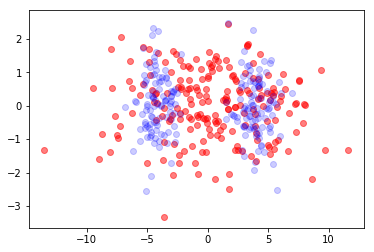

a [-1.14555473e-01  2.82822324e-02  1.01591008e+00 -3.55866504e-02
 -4.72480600e-01  9.63668721e-03  1.53187324e-01 -1.11194800e-05
  1.52358355e-01  8.86950202e-06]
b [-0.15272244  0.02802562  0.00068101  0.00432406  0.0005564   0.01692011
  0.11281243  0.20556932 -0.06768582  0.07453521  0.11251562  0.20556803
 -0.08967276  0.0657637 ]
Step n= 10


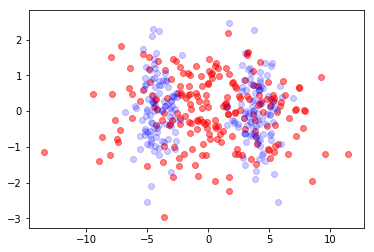

a [-1.66183970e-01  2.92906045e-02  9.98738969e-01 -3.49551914e-02
 -5.28716930e-01  8.30742487e-03  1.52076336e-01 -1.92244616e-05
  1.51152796e-01  8.78662877e-06]
b [-2.29477051e-01  2.50311205e-02 -1.72266184e-04  4.76627068e-03
  3.67042134e-05  2.26821692e-02  1.54115635e-01  2.10040076e-01
 -6.65305029e-02  7.41288283e-02  1.53689306e-01  2.10034113e-01
 -8.84115834e-02  6.53799833e-02]
Step n= 11


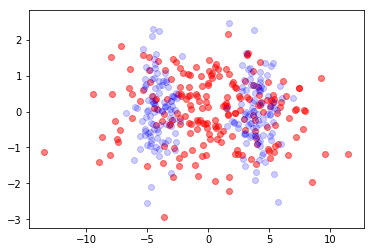

a [-1.70897632e-01  2.94842551e-02  9.98604624e-01 -3.46857981e-02
 -5.33110943e-01  8.23155477e-03  1.51985214e-01 -1.99783439e-05
  1.51051881e-01  8.79367394e-06]
b [-2.36668372e-01  2.46888992e-02 -1.85679055e-04  5.14150892e-03
  9.56753780e-05  2.29074612e-02  1.59178676e-01  2.11965402e-01
 -6.64196564e-02  7.40886880e-02  1.58739673e-01  2.11963213e-01
 -8.82901624e-02  6.53420945e-02]
Step n= 12


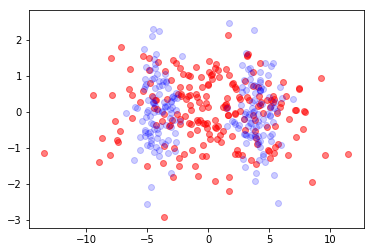

a [-1.75512612e-01  2.96775358e-02  9.98536119e-01 -3.45112467e-02
 -5.36931040e-01  8.16891999e-03  1.51902104e-01 -2.07112970e-05
  1.50959894e-01  8.80206322e-06]
b [-2.43855142e-01  2.43735186e-02 -1.44180848e-04  5.36560092e-03
  1.37842628e-04  2.19417034e-02  1.64669124e-01  2.14915232e-01
 -6.63024839e-02  7.40470139e-02  1.64217103e-01  2.14913303e-01
 -8.81619168e-02  6.53027053e-02]
Step n= 13


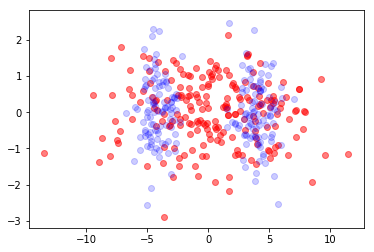

a [-1.80061039e-01  2.98673077e-02  9.98461614e-01 -3.43746747e-02
 -5.39924842e-01  8.12311500e-03  1.51826103e-01 -2.14301460e-05
  1.50876505e-01  8.81204305e-06]
b [-2.51070404e-01  2.40576526e-02 -5.50331310e-05  5.65161614e-03
  1.47814196e-04  2.01409609e-02  1.70647435e-01  2.18043531e-01
 -6.61770824e-02  7.40032595e-02  1.70181827e-01  2.18041422e-01
 -8.80247897e-02  6.52612916e-02]
Step n= 14


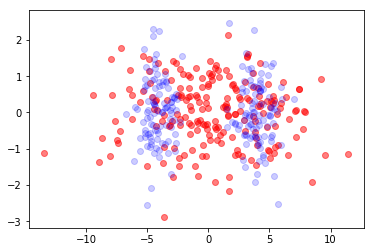

a [-1.84545408e-01  3.00498529e-02  9.98405614e-01 -3.42527220e-02
 -5.41935234e-01  8.09769065e-03  1.51756598e-01 -2.21373135e-05
  1.50801306e-01  8.82355039e-06]
b [-2.58349391e-01  2.37374258e-02  7.09285481e-05  5.94500364e-03
  1.44277362e-04  1.78597015e-02  1.77102754e-01  2.21230127e-01
 -6.60423636e-02  7.39571537e-02  1.76622937e-01  2.21227752e-01
 -8.78776070e-02  6.52175883e-02]
Step n= 15


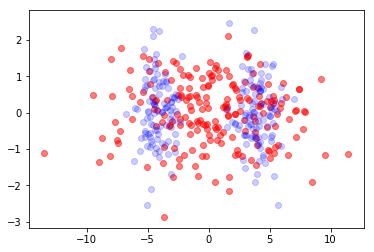

a [-1.88963345e-01  3.02223476e-02  9.98412288e-01 -3.41429588e-02
 -5.42909780e-01  8.09455194e-03  1.51692653e-01 -2.28345845e-05
  1.50733350e-01  8.83632254e-06]
b [-2.65725559e-01  2.34136550e-02  2.21405298e-04  6.23365790e-03
  1.39938394e-04  1.54402911e-02  1.84009685e-01  2.24456353e-01
 -6.58973421e-02  7.39084753e-02  1.83515008e-01  2.24453674e-01
 -8.77193066e-02  6.51713773e-02]
Step n= 16


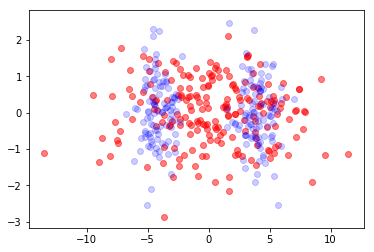

a [-1.93312225e-01  3.03834722e-02  9.98524094e-01 -3.40500487e-02
 -5.42888856e-01  8.11379083e-03  1.51633195e-01 -2.35236347e-05
  1.50671391e-01  8.85001470e-06]
b [-2.73236770e-01  2.30878204e-02  3.84013465e-04  6.51725666e-03
  1.40389427e-04  1.31871651e-02  1.91336764e-01  2.27719484e-01
 -6.57409878e-02  7.38570181e-02  1.90826544e-01  2.27716462e-01
 -8.75487803e-02  6.51224543e-02]
Step n= 17


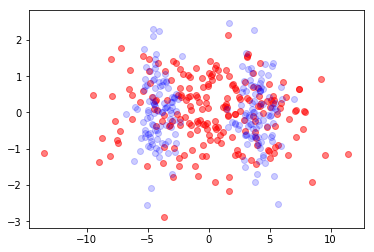

a [-1.97590002e-01  3.05335260e-02  9.98775171e-01 -3.39788878e-02
 -5.41988450e-01  8.15389380e-03  1.51577257e-01 -2.42060080e-05
  1.50614172e-01  8.86426728e-06]
b [-2.80924541e-01  2.27613998e-02  5.47372410e-04  6.79899214e-03
  1.47335371e-04  1.13485729e-02  1.99050416e-01  2.31019565e-01
 -6.55721986e-02  7.38025847e-02  1.98523929e-01  2.31016159e-01
 -8.73648438e-02  6.50706238e-02]
Step n= 18


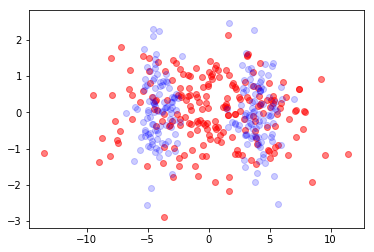

a [-2.01795375e-01  3.06742759e-02  9.99188252e-01 -3.39322462e-02
 -5.40380964e-01  8.21205301e-03  1.51524132e-01 -2.48830389e-05
  1.50560611e-01  8.87874000e-06]
b [-2.88831716e-01  2.24357306e-02  7.01966963e-04  7.08373516e-03
  1.60713293e-04  1.01049504e-02  2.07118188e-01  2.34357286e-01
 -6.53897940e-02  7.37449844e-02  2.06574665e-01  2.34353446e-01
 -8.71662301e-02  6.50156967e-02]
Step n= 19


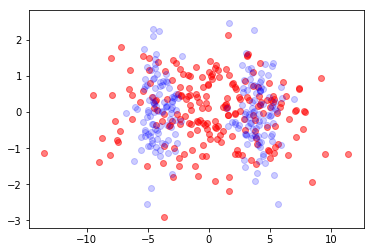

a [-2.05927816e-01  3.08086595e-02  9.99773196e-01 -3.39103362e-02
 -5.38274614e-01  8.28453408e-03  1.51473395e-01 -2.55557961e-05
  1.50509856e-01  8.89313126e-06]
b [-2.96999922e-01  2.21119421e-02  8.40759020e-04  7.37729504e-03
  1.79653888e-04  9.56325620e-03  2.15511636e-01  2.37733628e-01
 -6.51925110e-02  7.36840295e-02  2.14950253e-01  2.37729299e-01
 -8.69515845e-02  6.49574874e-02]
Step n= 20


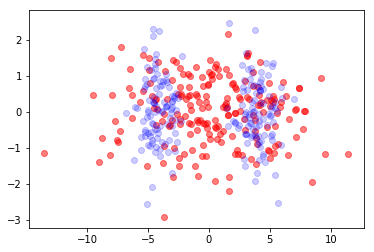

a [-2.09987514e-01  3.09404053e-02  1.00052678e+00 -3.39110589e-02
 -5.35891997e-01  8.36708374e-03  1.51424840e-01 -2.62250563e-05
  1.50461261e-01  8.90719204e-06]
b [-3.05467192e-01  2.17909012e-02  9.59532251e-04  7.68586568e-03
  2.02902300e-04  9.75718335e-03  2.24208721e-01  2.41149802e-01
 -6.49789993e-02  7.36195300e-02  2.23628594e-01  2.41144921e-01
 -8.67194591e-02  6.48958086e-02]
Step n= 21


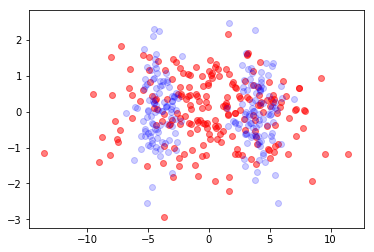

a [-2.13975285e-01  3.10736136e-02  1.00143356e+00 -3.39304851e-02
 -5.33448880e-01  8.45535334e-03  1.51378373e-01 -2.68913092e-05
  1.50414317e-01  8.92073672e-06]
b [-3.14265965e-01  2.14731778e-02  1.05696617e-03  8.01553332e-03
  2.29061368e-04  1.06532298e-02  2.33195548e-01  2.44607222e-01
 -6.47478163e-02  7.35512871e-02  2.32595724e-01  2.44601718e-01
 -8.64683070e-02  6.48304659e-02]
Step n= 22


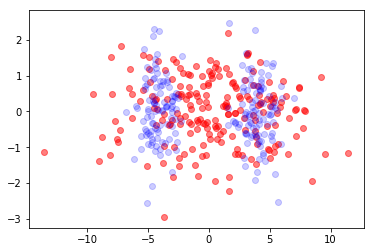

a [-2.17892428e-01  3.12123355e-02  1.00246773e+00 -3.39634403e-02
 -5.31134962e-01  8.54530189e-03  1.51333926e-01 -2.75547861e-05
  1.50368596e-01  8.93364974e-06]
b [-3.23421595e-01  2.11590327e-02  1.13445013e-03  8.37183986e-03
  2.56782575e-04  1.21622219e-02  2.42467289e-01  2.48107465e-01
 -6.44974210e-02  7.34790851e-02  2.41846744e-01  2.48101256e-01
 -8.61964749e-02  6.47612490e-02]
Step n= 23


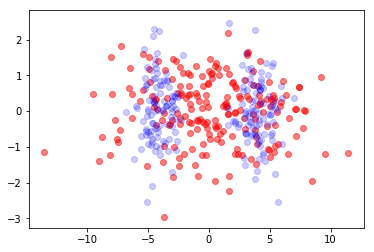

a [-2.21740567e-01  3.13601927e-02  1.00359554e+00 -3.40041338e-02
 -5.29098555e-01  8.63353654e-03  1.51291392e-01 -2.82155090e-05
  1.50323722e-01  8.94588613e-06]
b [-3.32951447e-01  2.08484336e-02  1.19566757e-03  8.75941446e-03
  2.84921910e-04  1.41551957e-02  2.52028258e-01  2.51652222e-01
 -6.42261678e-02  7.34026822e-02  2.51385892e-01  2.51645218e-01
 -8.59021964e-02  6.46879245e-02]
Step n= 24


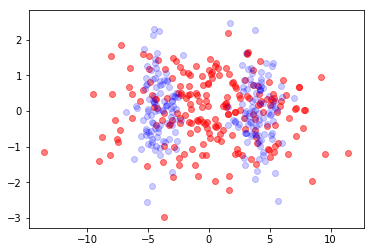

a [-2.25521484e-01  3.15200784e-02  1.00477831e+00 -3.40467774e-02
 -5.27436938e-01  8.71755283e-03  1.51250605e-01 -2.88733497e-05
  1.50279372e-01  8.95746391e-06]
b [-3.42864618e-01  2.05410948e-02  1.24600382e-03  9.18169285e-03
  3.12649016e-04  1.64818203e-02  2.61891173e-01  2.55243244e-01
 -6.39322997e-02  7.33218023e-02  2.61225812e-01  2.55235345e-01
 -8.55835834e-02  6.46102266e-02]
Step n= 25


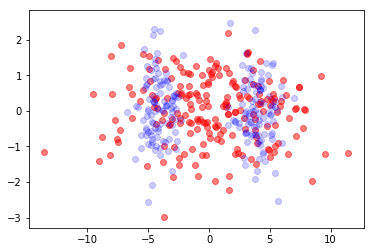

a [-2.29236966e-01  3.16939664e-02  1.00597552e+00 -3.40861329e-02
 -5.26193321e-01  8.79585176e-03  1.51211353e-01 -2.95280935e-05
  1.50235291e-01  8.96844876e-06]
b [-3.53162257e-01  2.02365388e-02  1.29185043e-03  9.64074721e-03
  3.39501346e-04  1.89890809e-02  2.72075774e-01  2.58882302e-01
 -6.36139407e-02  7.32361267e-02  2.71386168e-01  2.58873397e-01
 -8.52386186e-02  6.45278495e-02]
Step n= 26


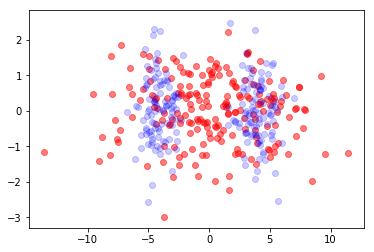

a [-2.32888676e-01  3.18828430e-02  1.00714787e+00 -3.41179326e-02
 -5.25360258e-01  8.86793108e-03  1.51173403e-01 -3.01795000e-05
  1.50191309e-01  8.97893287e-06]
b [-0.36383841  0.01993417  0.00133989  0.01013725  0.00036539  0.02153793
  0.28260699  0.26257115 -0.06326909  0.07314529  0.28189182  0.26256112
 -0.08486515  0.06444044]
Step n= 27


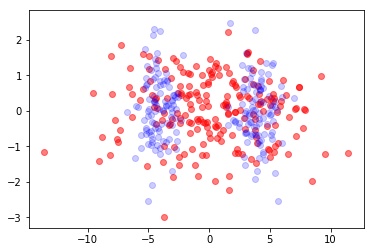

a [-2.36478060e-01  3.20867555e-02  1.00825985e+00 -3.41391388e-02
 -5.24888343e-01  8.93416878e-03  1.51136532e-01 -3.08273547e-05
  1.50147353e-01  8.98901157e-06]
b [-0.3748813   0.01963334  0.00139644  0.01067054  0.00039054  0.02401604
  0.29351292  0.26631154 -0.0628956   0.07304886  0.2927708   0.26630024
 -0.08446086  0.0643476 ]
Step n= 28


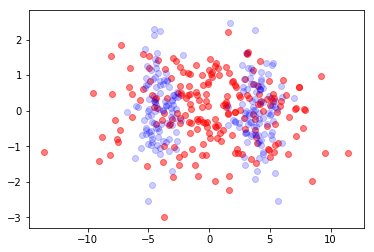

a [-2.40006305e-01  3.23049562e-02  1.00928184e+00 -3.41480326e-02
 -5.24698283e-01  8.99563073e-03  1.51100546e-01 -3.14715103e-05
  1.50103433e-01  8.99876185e-06]
b [-0.38627477  0.01933345  0.00146692  0.01123891  0.00041546  0.02634567
  0.30482289  0.27010517 -0.0624912   0.07294638  0.30405236  0.27009247
 -0.08402331  0.06424886]
Step n= 29


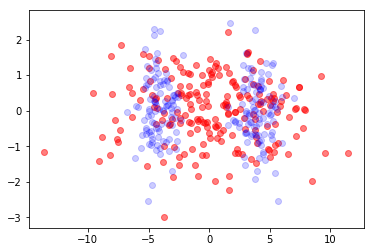

a [-2.43474332e-01  3.25361092e-02  1.01019137e+00 -3.41441496e-02
 -5.24694259e-01  9.05383997e-03  1.51065290e-01 -3.21119146e-05
  1.50059625e-01  9.00822585e-06]
b [-0.39799995  0.01903397  0.00155552  0.01183982  0.00044083  0.02848641
  0.31656569  0.27395378 -0.06205343  0.07283729  0.31576525  0.27393952
 -0.08354985  0.06414371]
Step n= 30


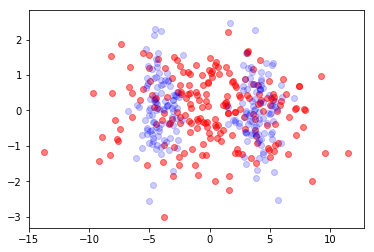

a [-2.75650401e-01  3.43109724e-02  1.02466121e+00 -3.40073753e-02
 -5.21261742e-01  1.01525453e-02  1.50748832e-01 -3.93382708e-05
  1.49584753e-01  8.76251726e-06]
b [-0.57483862  0.01642054  0.00287688  0.01856422  0.00078366  0.04486757
  0.44712659  0.29040396 -0.05440087  0.07105103  0.44583778  0.2903226
 -0.07529598  0.06241454]
Step n= 31


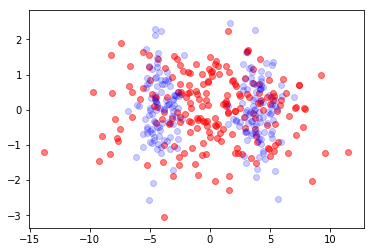

a [-2.98956860e-01  3.60796581e-02  1.02985585e+00 -3.38691104e-02
 -5.15332135e-01  1.13413626e-02  1.50375940e-01 -4.57657743e-05
  1.49026598e-01  8.27527848e-06]
b [-0.73538074  0.01479376  0.00485976  0.02770688  0.00113892  0.06667215
  0.55868639  0.2952597  -0.04602848  0.06905765  0.55696126  0.29517305
 -0.06626055  0.06048153]
Step n= 32


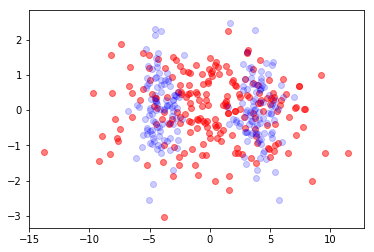

a [-3.01576190e-01  3.61391362e-02  1.02218125e+00 -3.42077104e-02
 -5.18736286e-01  1.12173851e-02  1.50301026e-01 -4.64336472e-05
  1.48945200e-01  8.18373945e-06]
b [-0.75056838  0.01463709  0.00505603  0.02831832  0.00086907  0.06821154
  0.57184497  0.29275312 -0.04518597  0.06885206  0.57007438  0.29269554
 -0.06534972  0.06028214]
Step n= 33


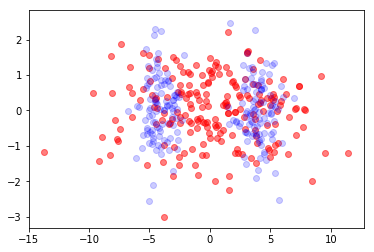

a [-3.04086944e-01  3.62248487e-02  1.01708607e+00 -3.41648796e-02
 -5.21629958e-01  1.11550429e-02  1.50236259e-01 -4.70819679e-05
  1.48868070e-01  8.10077189e-06]
b [-0.7655839   0.01438187  0.00518997  0.02768494  0.00077623  0.06893564
  0.58534923  0.29424568 -0.04431083  0.06863887  0.5835364   0.29419915
 -0.06440332  0.06007551]
Step n= 34


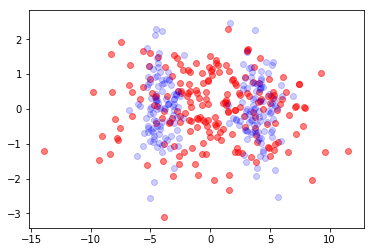

a [-3.25414509e-01  3.87081079e-02  1.04183160e+00 -3.32474907e-02
 -5.06899487e-01  1.36429138e-02  1.49907202e-01 -5.56896285e-05
  1.48150403e-01  6.83949555e-06]
b [-0.97273926  0.01358388  0.00807729  0.03998353  0.00209426  0.10019085
  0.70117913  0.31015865 -0.03132051  0.06553856  0.6990934   0.31007645
 -0.05036425  0.05706593]
Step n= 35


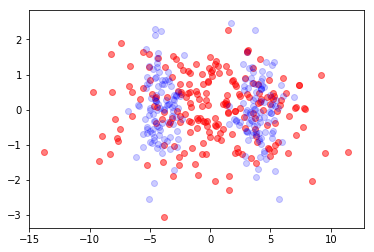

a [-3.27780888e-01  3.84576285e-02  1.02362252e+00 -3.42695691e-02
 -5.13878256e-01  1.32825711e-02  1.49799488e-01 -5.64505114e-05
  1.48049604e-01  6.59485780e-06]
b [-0.98618058  0.01343072  0.00839979  0.04237654  0.00130949  0.10202507
  0.71915271  0.3083118  -0.03026624  0.06526151  0.71700929  0.30824346
 -0.04922079  0.05679798]
Step n= 36


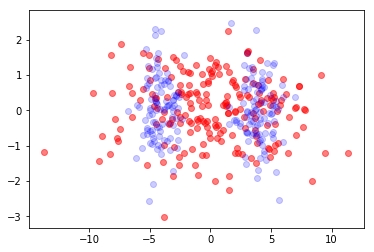

a [-3.30028640e-01  3.82646040e-02  1.01044600e+00 -3.42928341e-02
 -5.19809475e-01  1.30466641e-02  1.49708025e-01 -5.71906524e-05
  1.47950432e-01  6.37096471e-06]
b [-9.99384775e-01  1.30654430e-02  8.55927958e-03  4.07303011e-02
  9.96140418e-04  1.02454434e-01  7.38296021e-01  3.09914075e-01
 -2.91270454e-02  6.49621182e-02  7.36097201e-01  3.09851420e-01
 -4.79845644e-02  5.65089301e-02]
Step n= 37


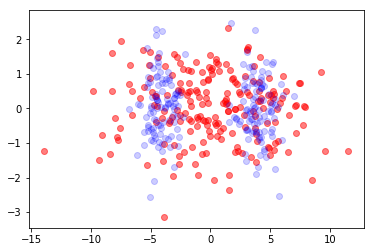

a [-3.46587152e-01  4.09960879e-02  1.03970055e+00 -3.23989012e-02
 -5.00466965e-01  1.62636543e-02  1.49432416e-01 -6.71341353e-05
  1.47134097e-01  3.98457963e-06]
b [-1.18892812  0.01299123  0.0116695   0.05277748  0.00311748  0.13872863
  0.84954752  0.32512393 -0.01355551  0.0609512   0.84735037  0.32506744
 -0.03110491  0.05262745]
Step n= 38


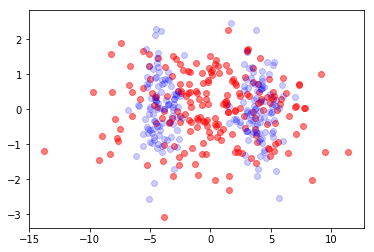

a [-3.48748209e-01  4.04742768e-02  1.01627263e+00 -3.40923427e-02
 -5.10631179e-01  1.57862909e-02  1.49304767e-01 -6.80401591e-05
  1.47011799e-01  3.54775861e-06]
b [-1.20071865  0.01281696  0.01196292  0.05462993  0.0019291   0.1403532
  0.87339942  0.32455423 -0.01225934  0.06058229  0.87113784  0.3244918
 -0.02969469  0.05227207]
Step n= 39


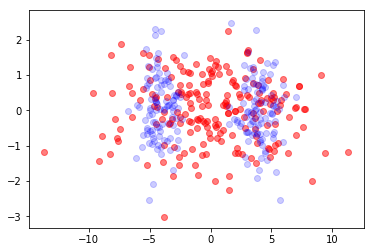

a [-3.50721932e-01  4.00616806e-02  9.99576538e-01 -3.41915721e-02
 -5.18808948e-01  1.54853676e-02  1.49203946e-01 -6.89102364e-05
  1.46895531e-01  3.15711687e-06]
b [-1.2119156   0.0124008   0.01203481  0.05259773  0.00142402  0.14007286
  0.89823948  0.32659252 -0.01085578  0.06018287  0.89591677  0.3265256
 -0.02816715  0.05188823]
Step n= 40


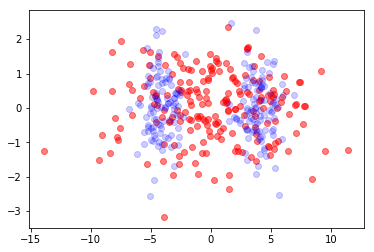

a [-3.64328673e-01  4.28496316e-02  1.03151632e+00 -3.13439419e-02
 -4.95824529e-01  1.92808427e-02  1.49083237e-01 -8.06387191e-05
  1.46031810e-01 -6.26826473e-07]
b [-1.37674132  0.01301867  0.01493395  0.064191    0.00422208  0.17708055
  0.99835052  0.34005044  0.00649585  0.0552492   0.99625334  0.34001992
 -0.00930457  0.04713122]
Step n= 41


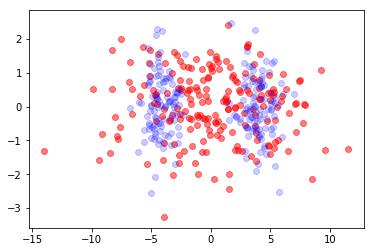

a [-3.75985624e-01  4.53923001e-02  1.04791178e+00 -3.18509932e-02
 -4.81362900e-01  2.26263303e-02  1.49119098e-01 -9.33212452e-05
  1.45223280e-01 -5.24423552e-06]
b [-1.52576047  0.01382159  0.01823295  0.0759848   0.00471416  0.22049791
  1.11471437  0.3505642   0.02198821  0.05067143  1.11257941  0.35051682
  0.00752816  0.04271738]
Step n= 42


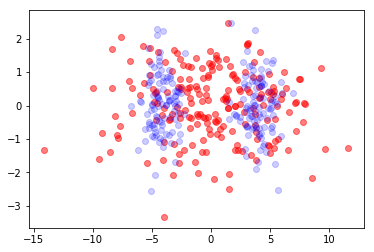

a [-3.88479060e-01  4.75494126e-02  1.06195189e+00 -3.19969373e-02
 -4.69714235e-01  2.64526876e-02  1.49331594e-01 -1.10132135e-04
  1.44274458e-01 -1.23234243e-05]
b [-1.68707512  0.01488218  0.02176645  0.08756847  0.00551119  0.26596554
  1.237529    0.36030098  0.03848617  0.04563574  1.23534128  0.36024939
  0.02546463  0.03786949]
Step n= 43


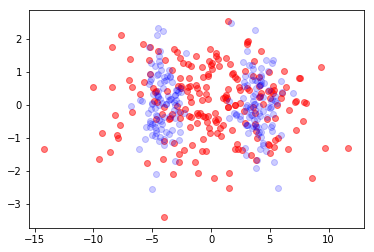

a [-4.01592247e-01  4.90894239e-02  1.07273277e+00 -3.20230481e-02
 -4.58576226e-01  3.06063240e-02  1.49811094e-01 -1.31141915e-04
  1.43275810e-01 -2.20232985e-05]
b [-1.84699562  0.01605214  0.02520285  0.0988285   0.00637482  0.31082447
  1.36258573  0.36911771  0.05438423  0.04051375  1.36035361  0.36906658
  0.04278487  0.03295249]
Step n= 44


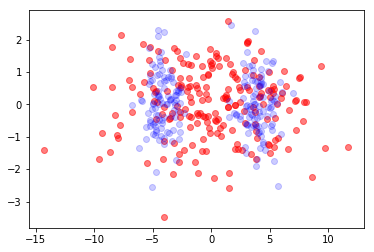

a [-4.15536075e-01  5.00311113e-02  1.08148118e+00 -3.20464815e-02
 -4.47498015e-01  3.50949003e-02  1.50651883e-01 -1.57222189e-04
  1.42268251e-01 -3.47558810e-05]
b [-2.00276099  0.01721842  0.02846158  0.10955668  0.00725702  0.3551523
  1.48752604  0.37733181  0.06910513  0.03544952  1.48527057  0.37728342
  0.0588775   0.02811028]
Step n= 45


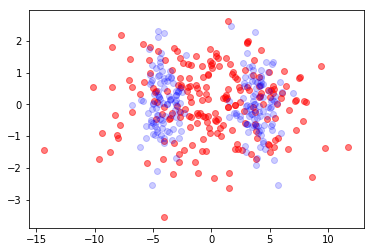

a [-4.30423609e-01  5.04052001e-02  1.08870735e+00 -3.21265705e-02
 -4.36493281e-01  3.98871197e-02  1.51955155e-01 -1.89293274e-04
  1.41301322e-01 -5.08472010e-05]
b [-2.1518991   0.01826943  0.03155937  0.11969077  0.00812221  0.39860028
  1.61123976  0.38509912  0.08218876  0.03061448  1.6089789   0.38505367
  0.07324863  0.02351197]
Step n= 46


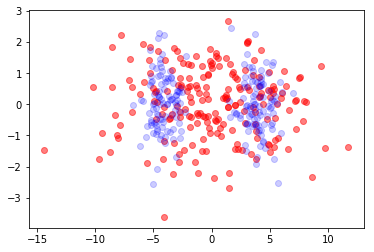

a [-4.46398765e-01  5.02467813e-02  1.09475972e+00 -3.22725391e-02
 -4.25612633e-01  4.49743749e-02  1.53830748e-01 -2.28654989e-04
  1.40420381e-01 -7.06986424e-05]
b [-2.29336101  0.0191185   0.03455412  0.12920475  0.00896066  0.44084988
  1.73318291  0.39252149  0.09344213  0.02615235  1.7309286   0.39247839
  0.08568606  0.01929901]
Step n= 47


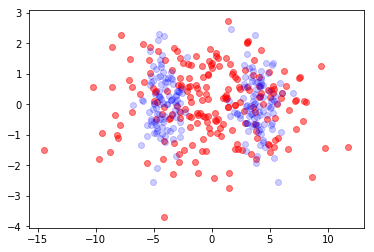

a [-4.63609849e-01  4.96059723e-02  1.09985479e+00 -3.24799123e-02
 -4.14898584e-01  5.03687692e-02  1.56406280e-01 -2.77112968e-04
  1.39669745e-01 -9.48004831e-05]
b [-2.42678444  0.01970695  0.03751388  0.13810258  0.00976718  0.48165808
  1.85309977  0.39965527  0.10286097  0.02218449  1.85085843  0.39961381
  0.09617603  0.01559028]
Step n= 48


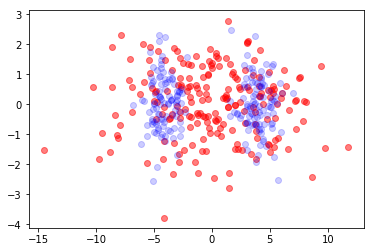

a [-4.82197058e-01  4.85554427e-02  1.10414260e+00 -3.27398405e-02
 -4.04395942e-01  5.61078127e-02  1.59841121e-01 -3.37205357e-04
  1.39094053e-01 -1.23767823e-04]
b [-2.55222581  0.0200033   0.04050778  0.14640348  0.01053775  0.52085886
  1.97087672  0.40653099  0.11057541  0.01880772  1.96865094  0.40649067
  0.10484649  0.01248005]
Step n= 49


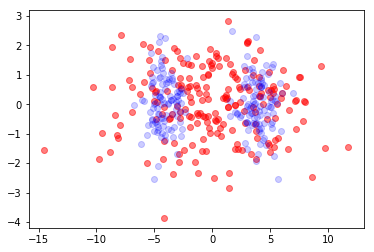

a [-5.02280455e-01  4.71899671e-02  1.10773125e+00 -3.30418661e-02
 -3.94152505e-01  6.22607665e-02  1.64347242e-01 -4.12555589e-04
  1.38740904e-01 -1.58391495e-04]
b [-2.6699788   0.01999926  0.0436031   0.15413655  0.01126908  0.55834607
  2.08647205  0.41316398  0.11679955  0.01609281  2.08426247  0.41312459
  0.11191437  0.01003646]
Step n= 50


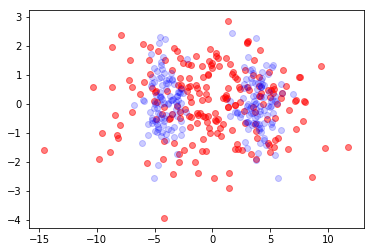

a [-5.23951866e-01  4.56209043e-02  1.11069790e+00 -3.33753768e-02
 -3.84216443e-01  6.89409490e-02  1.70222422e-01 -5.08479210e-04
  1.38664695e-01 -1.99725229e-04]
b [-2.78047006  0.0197044   0.04686254  0.16133668  0.01195867  0.59406126
  2.19988065  0.41956104  0.12179002  0.01408311  2.19768743  0.41952265
  0.11764247  0.00830036]
Step n= 51


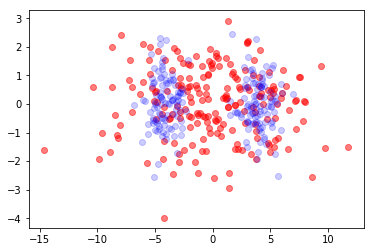

a [-5.47269845e-01  4.39683205e-02  1.11309178e+00 -3.37305018e-02
 -3.74634312e-01  7.63290700e-02  1.77907007e-01 -6.33089234e-04
  1.38932502e-01 -2.49233651e-04]
b [-2.88419529  0.01914052  0.05034111  0.16804169  0.01260497  0.62798471
  2.31111562  0.42572447  0.12581361  0.01279439  2.30893938  0.42568731
  0.12230572  0.00728513]
Step n= 52


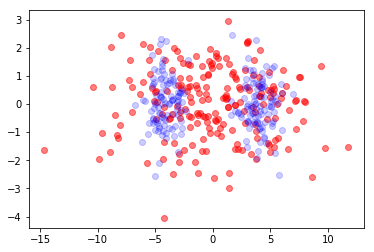

a [-5.72257071e-01  4.23523846e-02  1.11493067e+00 -3.40984580e-02
 -3.65451278e-01  8.47190611e-02  1.88088366e-01 -7.99451141e-04
  1.39633628e-01 -3.09049019e-04]
b [-2.98167771  0.01833657  0.0540831   0.17429034  0.01320736  0.66012674
  2.42019794  0.43165442  0.12912372  0.01221603  2.41804027  0.43161886
  0.12616674  0.00697794]
Step n= 53


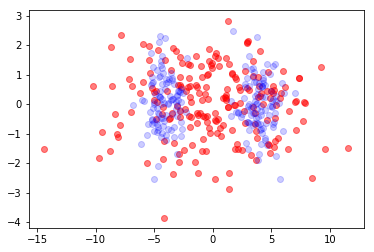

a [-5.75803825e-01  4.10916909e-02  1.07933850e+00 -3.88735376e-02
 -3.93056144e-01  8.46689080e-02  1.89074291e-01 -8.24143668e-04
  1.39410767e-01 -3.18136232e-04]
b [-2.99191949  0.01759049  0.05400105  0.17306574  0.01112236  0.65774572
  2.48972227  0.43430757  0.12959909  0.01215463  2.48748382  0.43426687
  0.12671939  0.00696157]
Step n= 54


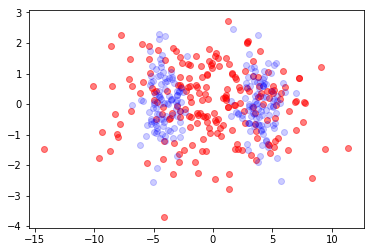

a [-5.78985897e-01  3.97884679e-02  1.05192230e+00 -3.92249869e-02
 -4.13054538e-01  8.50132057e-02  1.90297390e-01 -8.49368582e-04
  1.39309673e-01 -3.27160106e-04]
b [-3.00031676  0.01695094  0.05330881  0.17158494  0.01012559  0.65144994
  2.55231924  0.43745414  0.13015918  0.01208331  2.55001485  0.43740939
  0.12735815  0.0069408 ]
Step n= 55


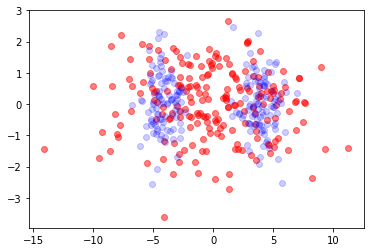

a [-5.81932163e-01  3.85368854e-02  1.02975766e+00 -3.79740778e-02
 -4.26975823e-01  8.56463194e-02  1.91698799e-01 -8.75424333e-04
  1.39313146e-01 -3.36073255e-04]
b [-3.00690288  0.01640071  0.05237347  0.17075083  0.00992495  0.64338509
  2.60927986  0.44084802  0.13082654  0.01194372  2.60692197  0.44080013
  0.12810484  0.00685641]
Step n= 56


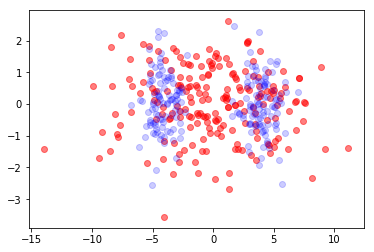

a [-5.84721603e-01  3.74032795e-02  1.01111926e+00 -3.63611976e-02
 -4.35950663e-01  8.65062452e-02  1.93249510e-01 -9.02566293e-04
  1.39409578e-01 -3.44869499e-04]
b [-3.01182236  0.01591832  0.05138561  0.17031675  0.01010234  0.63506207
  2.66165254  0.4443709   0.13161362  0.01170338  2.65925159  0.44432065
  0.12897144  0.00667513]
Step n= 57


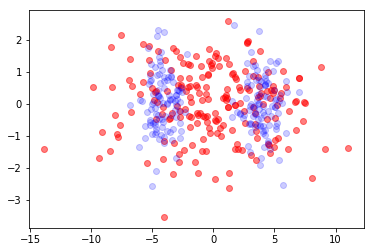

a [-5.87402817e-01  3.64282312e-02  9.95007222e-01 -3.48622891e-02
 -4.40958342e-01  8.75542755e-02  1.94936517e-01 -9.31007655e-04
  1.39588722e-01 -3.53567614e-04]
b [-3.01520742  0.01548333  0.05044104  0.17007381  0.01041042  0.62754003
  2.71023832  0.44794916  0.13252831  0.01134595  2.70780312  0.44789722
  0.12996545  0.00637987]
Step n= 58


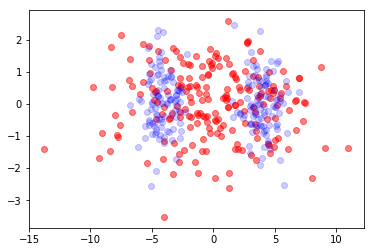

a [-5.90009376e-01  3.56339689e-02  9.80860002e-01 -3.36307202e-02
 -4.42893832e-01  8.87658422e-02  1.96756776e-01 -9.60952133e-04
  1.39840672e-01 -3.62202182e-04]
b [-3.01719082  0.01508558  0.04958574  0.16989507  0.01073622  0.62150955
  2.75566554  0.45154367  0.13357649  0.0108658   2.75320353  0.45149061
  0.13109245  0.00596436]
Step n= 59


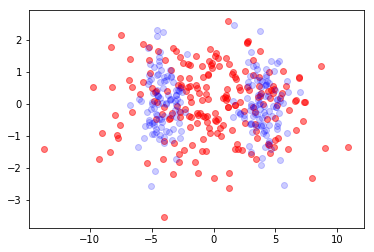

a [-5.92568914e-01  3.50295306e-02  9.68374505e-01 -3.26929404e-02
 -4.42573926e-01  9.01254974e-02  1.98713674e-01 -9.92615998e-04
  1.40155866e-01 -3.70818044e-04]
b [-3.01791183  0.01472203  0.04884202  0.16971427  0.01103559  0.61735834
  2.79844695  0.45514042  0.13476336  0.01026424  2.79596434  0.45508673
  0.13235738  0.00542934]
Step n= 60


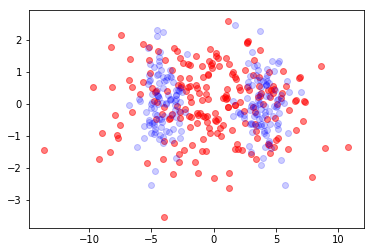

a [-5.95107789e-01  3.46135373e-02  9.57391348e-01 -3.20267909e-02
 -4.40721068e-01  9.16240728e-02  2.00814859e-01 -1.02624186e-03
  1.40525485e-01 -3.79468011e-04]
b [-3.01751497  0.01439279  0.04822252  0.16950556  0.01129535  0.61522947
  2.83901573  0.45874094  0.13609365  0.00954695  2.83651764  0.458687
  0.13376476  0.00478001]
Step n= 61


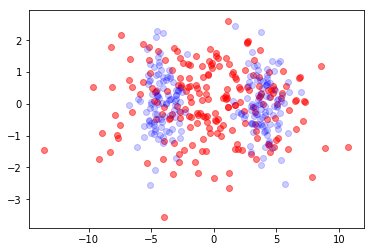

a [-5.97652966e-01  3.43755677e-02  9.47820656e-01 -3.15920956e-02
 -4.37944271e-01  9.32569822e-02  2.03070843e-01 -1.06210730e-03
  1.40941949e-01 -3.88212625e-04]
b [-3.01614563  0.01409861  0.04773681  0.16926774  0.01151594  0.61507634
  2.87774552  0.4623539   0.13757139  0.00872214  2.87523605  0.46230006
  0.13531847  0.00402422]
Step n= 62


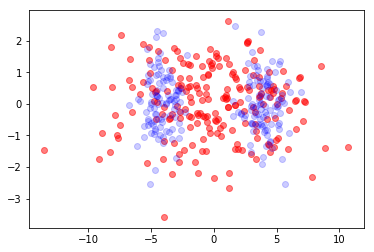

a [-6.00232280e-01  3.42970428e-02  9.39594990e-01 -3.13436192e-02
 -4.34726807e-01  9.50231426e-02  2.05494098e-01 -1.10053076e-03
  1.41399338e-01 -3.97120839e-04]
b [-3.01394499  0.01383981  0.04739361  0.16901242  0.01170378  0.61671579
  2.91496004  0.46598873  0.13919954  0.0077994   2.91244242  0.46593525
  0.13702131  0.00317125]
Step n= 63


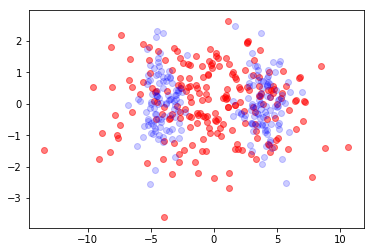

a [-6.02873805e-01  3.43522296e-02  9.32641901e-01 -3.12375593e-02
 -4.31424586e-01  9.69242633e-02  2.08098541e-01 -1.14187611e-03
  1.41893654e-01 -4.06270830e-04]
b [-3.01104552e+00  1.36158939e-02  4.72004891e-02  1.68755625e-01
  1.18674491e-02  6.19878342e-01  2.95093717e+00  4.69651463e-01
  1.40979597e-01  6.78883259e-03  2.94841389e+00  4.69598566e-01
  1.38874692e-01  2.23103128e-03]
Step n= 64


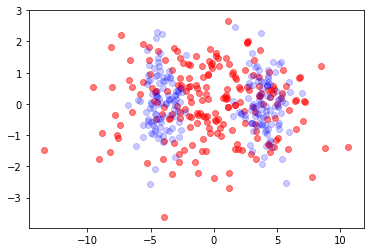

a [-6.05604828e-01  3.45096589e-02  9.26871179e-01 -3.12351481e-02
 -4.28275263e-01  9.89643900e-02  2.10899328e-01 -1.18655745e-03
  1.42422898e-01 -4.15750434e-04]
b [-3.00756777e+00  1.34254415e-02  4.71625022e-02  1.68512332e-01
  1.20155743e-02  6.24253077e-01  2.98591090e+00  4.73342677e-01
  1.42911317e-01  5.70058931e-03  2.98338382e+00  4.73290551e-01
  1.40878284e-01  1.21355302e-03]
Step n= 65


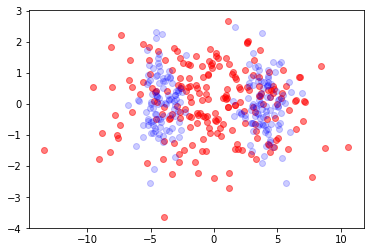

a [-6.08450776e-01  3.47339878e-02  9.22172655e-01 -3.13044236e-02
 -4.25415555e-01  1.01149655e-01  2.13912931e-01 -1.23504506e-03
  1.42986973e-01 -4.25656985e-04]
b [-3.00361850e+00  1.32662810e-02  4.72805958e-02  1.68293527e-01
  1.21554875e-02  6.29524575e-01  3.02007328e+00  4.77057338e-01
  1.44992542e-01  4.54455233e-03  3.01754376e+00  4.77006143e-01
  1.43029863e-01  1.28596048e-04]
Step n= 66


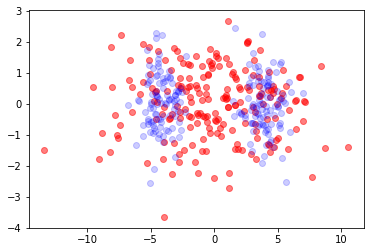

a [-6.11434312e-01  3.49881504e-02  9.18420680e-01 -3.14206443e-02
 -4.22903084e-01  1.03488199e-01  2.17157437e-01 -1.28787366e-03
  1.43587482e-01 -4.36096612e-04]
b [-2.99929019e+00  1.31356478e-02  4.75503935e-02  1.68105209e-01
  1.22926233e-02  6.35400223e-01  3.05357737e+00  4.80785773e-01
  1.47219143e-01  3.33019487e-03  3.05104639e+00  4.80735651e-01
  1.45325255e-01 -1.01444484e-03]
Step n= 67


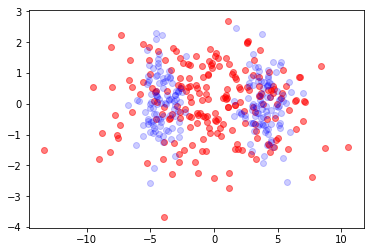

a [-6.14574709e-01  3.52355535e-02  9.15481821e-01 -3.15657678e-02
 -4.20739102e-01  1.05990255e-01  2.20653023e-01 -1.34565392e-03
  1.44227455e-01 -4.47183191e-04]
b [-2.99466158e+00  1.30303878e-02  4.79616751e-02  1.67948694e-01
  1.24304146e-02  6.41627516e-01  3.08654136e+00  4.84515290e-01
  1.49585093e-01  2.06653984e-03  3.08400960e+00  4.84466368e-01
  1.47758396e-01 -2.20661289e-03]
Step n= 68


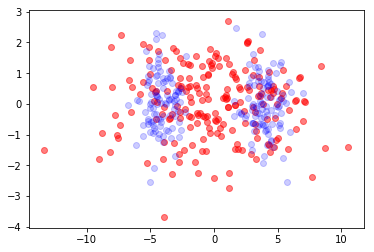

a [-6.17887545e-01  3.54420770e-02  9.13223090e-01 -3.17274039e-02
 -4.18889243e-01  1.08668343e-01  2.24422562e-01 -1.40908805e-03
  1.44911087e-01 -4.59037244e-04]
b [-2.98979888e+00  1.29471461e-02  4.84986171e-02  1.67821642e-01
  1.25705451e-02  6.48002341e-01  3.11905353e+00  4.88231895e-01
  1.52082632e-01  7.62175596e-04  3.11652145e+00  4.88184290e-01
  1.50321503e-01 -3.43938306e-03]
Step n= 69


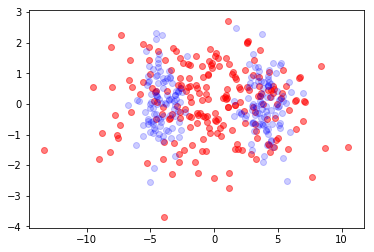

a [-6.21384667e-01  3.55776940e-02  9.11518941e-01 -3.18975794e-02
 -4.17300625e-01  1.11537598e-01  2.28492336e-01 -1.47899084e-03
  1.45643510e-01 -4.71785068e-04]
b [-2.98475742e+00  1.28825262e-02  4.91406927e-02  1.67719332e-01
  1.27133763e-02  6.54370078e-01  3.15117756e+00  4.91921793e-01
  1.54702508e-01 -5.74707056e-04  3.14864546e+00  4.91875610e-01
  1.53005310e-01 -4.70463080e-03]
Step n= 70


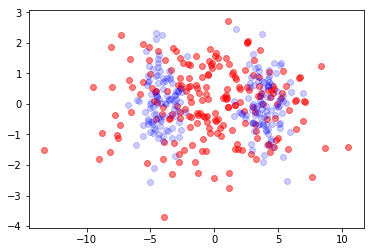

a [-6.25074390e-01  3.56176127e-02  9.10256193e-01 -3.20715449e-02
 -4.15914640e-01  1.14616194e-01  2.32892836e-01 -1.55631720e-03
  1.46430633e-01 -4.85558333e-04]
b [-2.97958333e+00  1.28332144e-02  4.98640309e-02  1.67635873e-01
  1.28584054e-02  6.60621703e-01  3.18295770e+00  4.95572476e-01
  1.57434264e-01 -1.93628193e-03  3.18042581e+00  4.95527811e-01
  1.55799352e-01 -5.99460188e-03]
Step n= 71


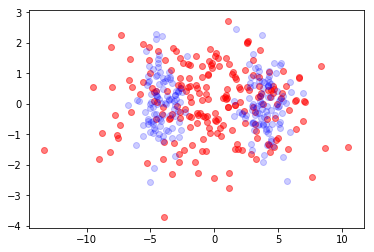

a [-6.28961833e-01  3.55429165e-02  9.09336688e-01 -3.22467462e-02
 -4.14675590e-01  1.17925891e-01  2.37659685e-01 -1.64219845e-03
  1.47279054e-01 -5.00494328e-04]
b [-2.97431523  0.01279607  0.05064299  0.16756516  0.01300466  0.66668696
  3.21442356  0.49917338  0.16026653 -0.00331507  3.21189201  0.49913032
  0.15869226 -0.0073019 ]
Step n= 72


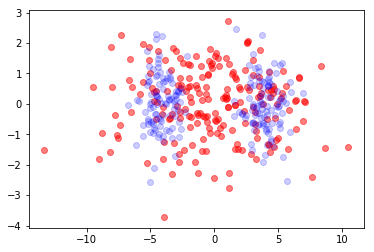

a [-6.33049340e-01  3.53407410e-02  9.08677960e-01 -3.24220066e-02
 -4.13535785e-01  1.21492710e-01  2.42834692e-01 -1.73798973e-03
  1.48196050e-01 -5.16736959e-04]
b [-2.96898565  0.01276815  0.05145176  0.16750156  0.01315102  0.67252635
  3.24559407  0.50271617  0.16318733 -0.00470396  3.24306293  0.5026748
  0.16167206 -0.00861949]
Step n= 73


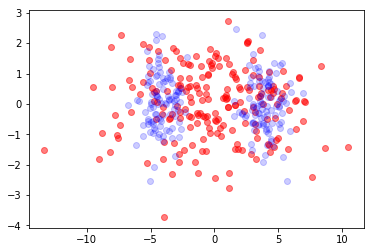

a [-6.37336910e-01  3.50040625e-02  9.08212363e-01 -3.25969215e-02
 -4.12457915e-01  1.25347787e-01  2.48467109e-01 -1.84533262e-03
  1.49189634e-01 -5.34438575e-04]
b [-2.96362228  0.0127468   0.05226573  0.16744032  0.01329638  0.67812308
  3.27648067  0.50619471  0.16618434 -0.00609623  3.27395002  0.5061551
  0.16472642 -0.00994073]
Step n= 74


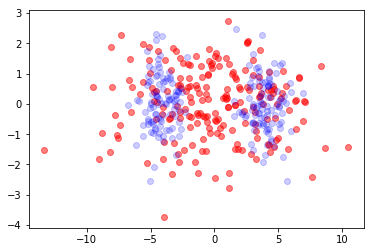

a [-6.41822608e-01  3.45311906e-02  9.07885177e-01 -3.27714377e-02
 -4.11415524e-01  1.29528435e-01  2.54615131e-01 -1.96623817e-03
  1.50268672e-01 -5.53762680e-04]
b [-2.95824891  0.01272957  0.05306266  0.16737769  0.01343978  0.68347586
  3.30708979  0.50960486  0.16924511 -0.00748557  3.30455969  0.50956705
  0.16784292 -0.01125941]
Step n= 75


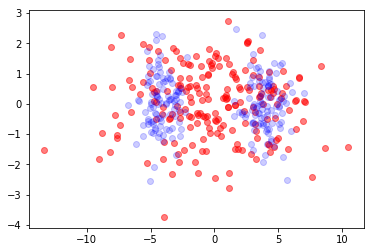

a [-6.46502907e-01  3.39250591e-02  9.07652132e-01 -3.29455835e-02
 -4.10392297e-01  1.34079499e-01  2.61347749e-01 -2.10319857e-03
  1.51443062e-01 -5.74887584e-04]
b [-2.95288616  0.01271428  0.05382347  0.167311    0.01358046  0.68859292
  3.33742448  0.51294412  0.17235727 -0.00886619  3.334895    0.51290817
  0.17100922 -0.01256981]
Step n= 76


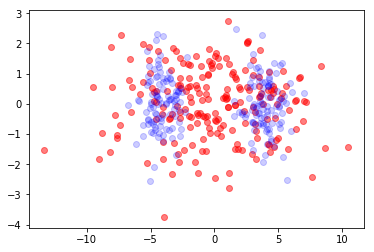

a [-6.51372958e-01  3.31923990e-02  9.07476685e-01 -3.31193135e-02
 -4.09380779e-01  1.39055083e-01  2.68747021e-01 -2.25933899e-03
  1.52723951e-01 -5.98011066e-04]
b [-2.94755199  0.01269896  0.05453269  0.1672385   0.01371783  0.69348723
  3.36748549  0.5162113   0.1755087  -0.0102328   3.36495669  0.51617726
  0.17421317 -0.01386674]
Step n= 77


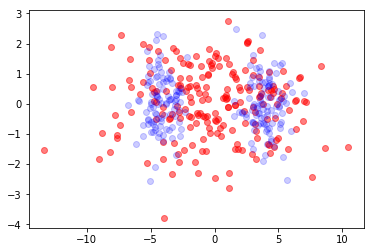

a [-6.56426750e-01  3.23428685e-02  9.07327284e-01 -3.32924348e-02
 -4.08380921e-01  1.44520757e-01  2.76910902e-01 -2.43862674e-03
  1.54124004e-01 -6.23356191e-04]
b [-2.94226202  0.01268183  0.05517864  0.16715923  0.01385146  0.69817308
  3.39727178  0.51940615  0.17868757 -0.01158068  3.39474373  0.51937403
  0.177443   -0.01514555]
Step n= 78


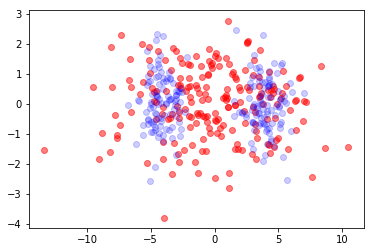

a [-6.61657168e-01  3.13881946e-02  9.07174728e-01 -3.34645866e-02
 -4.07398810e-01  1.50556412e-01  2.85956747e-01 -2.64616369e-03
  1.55657696e-01 -6.51178442e-04]
b [-2.93702968  0.01266132  0.05575328  0.16707279  0.01398103  0.70266354
  3.42678058  0.52252898  0.18188246 -0.01290572  3.42425339  0.52249881
  0.18068728 -0.0164022 ]
Step n= 79


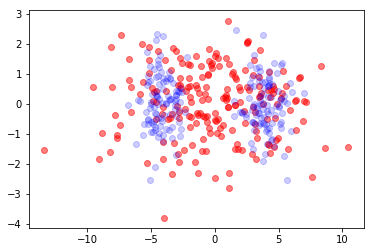

a [-6.67055915e-01  3.03413683e-02  9.06989646e-01 -3.36352509e-02
 -4.06445756e-01  1.57259937e-01  2.96025636e-01 -2.88860049e-03
  1.57341633e-01 -6.81774461e-04]
b [-2.93186616  0.01263601  0.05625198  0.16697916  0.01410629  0.70696888
  3.45600707  0.5255804   0.18508231 -0.01420437  3.45348087  0.52555219
  0.18393499 -0.01763319]
Step n= 80


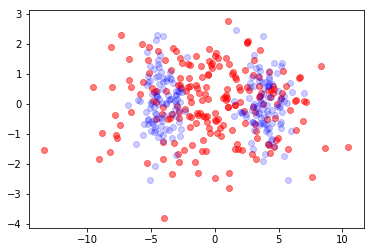

a [-6.72613270e-01  2.92159203e-02  9.06740046e-01 -3.38037753e-02
 -4.05537918e-01  1.64751950e-01  3.07287632e-01 -3.17473197e-03
  1.59194869e-01 -7.15492782e-04]
b [-2.92678034  0.01260461  0.05667299  0.16687844  0.01422699  0.71109532
  3.4849437   0.52856103  0.18827642 -0.01547364  3.48241864  0.52853478
  0.18717543 -0.0188356 ]
Step n= 81


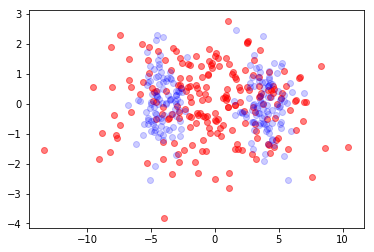

a [-6.78317637e-01  2.80252922e-02  9.06388826e-01 -3.39693958e-02
 -4.04696578e-01  1.73181867e-01  3.19948054e-01 -3.51636414e-03
  1.61239168e-01 -7.52747132e-04]
b [-2.92177837  0.01256597  0.05701689  0.16677069  0.01434282  0.71504415
  3.51357909  0.53147122  0.19145429 -0.01671106  3.51105537  0.53144693
  0.19039814 -0.02000702]
Step n= 82


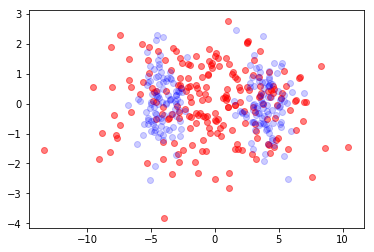

a [-6.84154791e-01  2.67823089e-02  9.05891099e-01 -3.41312497e-02
 -4.03949185e-01  1.82735575e-01  3.34254646e-01 -3.92959260e-03
  1.63499123e-01 -7.94033152e-04]
b [-2.91686324  0.01251904  0.05728598  0.16665567  0.01445341  0.71881078
  3.54189646  0.53431076  0.19460546 -0.0179146   3.53937431  0.53428843
  0.19359268 -0.02114546]
Step n= 83


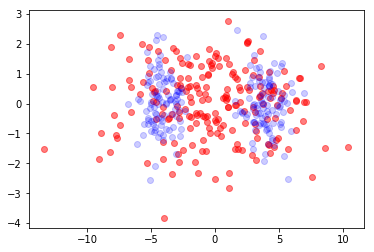

a [-6.90106703e-01  2.54987505e-02  9.05191200e-01 -3.42883677e-02
 -4.03331328e-01  1.93644936e-01  3.50505180e-01 -4.43670608e-03
  1.66001955e-01 -8.39949838e-04]
b [-2.91203399  0.01246282  0.05748357  0.16653254  0.0145582   0.72238347
  3.56987141  0.53707854  0.19771918 -0.01908258  3.5673511   0.53705815
  0.19674829 -0.02224925]
Step n= 84


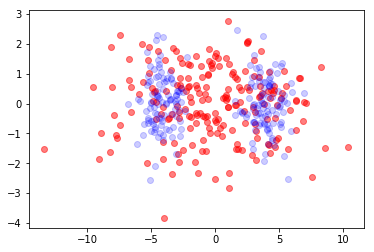

a [-6.96149728e-01  2.41850217e-02  9.04219286e-01 -3.44396374e-02
 -4.02889812e-01  2.06199060e-01  3.69054335e-01 -5.06903813e-03
  1.68776694e-01 -8.91227674e-04]
b [-2.90728465  0.01239637  0.05761321  0.16639958  0.01465643  0.72574155
  3.59746886  0.53977197  0.20078386 -0.02021349  3.59495074  0.53975349
  0.19985344 -0.02331696]
Step n= 85


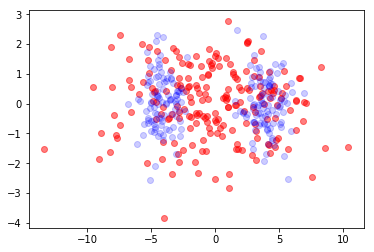

a [-0.70225186  0.02284991  0.90288761 -0.03458372 -0.40268701  0.2207567
  0.39031739 -0.00587124  0.17185223 -0.00094877]
b [-2.9026028   0.01231874  0.0576779   0.16625373  0.01474703  0.72885265
  3.62463886  0.54238622  0.20378639 -0.02130589  3.62212333  0.54236964
  0.202895   -0.02434714]
Step n= 86


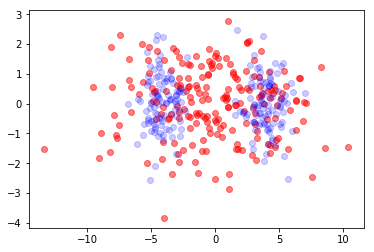

a [-0.7083687   0.02150046  0.90108695 -0.03471889 -0.40280653  0.23775787
  0.41476624 -0.0069076   0.1752534  -0.00101369]
b [-2.89796778  0.01222888  0.05767912  0.16609007  0.01482856  0.73166888
  3.65131101  0.54491304  0.20671091 -0.02235813  3.6487986   0.54489833
  0.20585715 -0.02533819]
Step n= 87


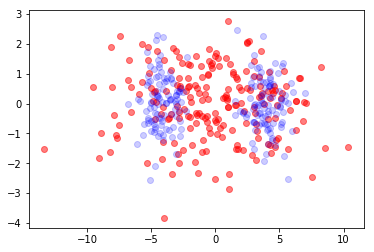

a [-0.7144376   0.02014186  0.8986844  -0.03484274 -0.40335972  0.25773048
  0.44291062 -0.00827117  0.1789941  -0.00108741]
b [-2.89334861  0.01212561  0.05761572  0.16590121  0.01489912  0.73412158
  3.67738742  0.54733895  0.20953722 -0.0233681   3.67487878  0.54732609
  0.20871966 -0.02628801]
Step n= 88


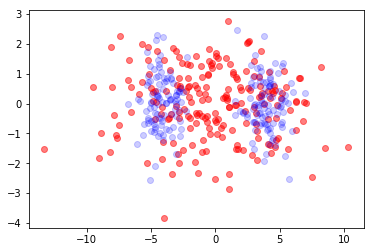

a [-0.72036981  0.01877749  0.89552475 -0.03495173 -0.40449169  0.28128493
  0.47525517 -0.01009628  0.18306586 -0.00117175]
b [-2.88870217  0.01200753  0.05748264  0.16567673  0.01495638  0.73611484
  3.70273468  0.54964282  0.21223846 -0.02433294  3.70023066  0.54963177
  0.2114557  -0.02719375]
Step n= 89


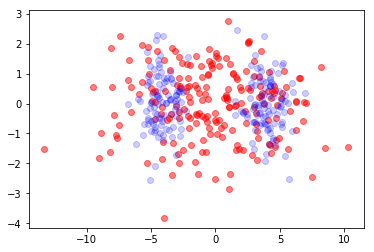

a [-0.72604101  0.01740882  0.89143878 -0.0350404  -0.4063838   0.30908643
  0.51222487 -0.01257397  0.18742119 -0.00126905]
b [-2.88397259  0.01187308  0.05726948  0.16540312  0.01499774  0.73751853
  3.72717618  0.55179286  0.21477838 -0.02524861  3.72467785  0.5517836
  0.214029   -0.02805142]
Step n= 90


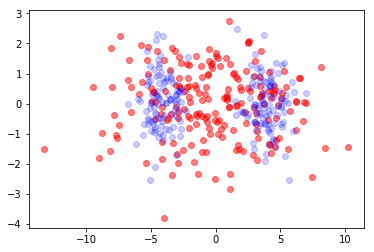

a [-0.73128205  0.01603497  0.88626157 -0.03510038 -0.4092481   0.34179614
  0.55406255 -0.01596787  0.19195211 -0.00138232]
b [-2.87909356  0.01172075  0.05695918  0.16506469  0.01502076  0.73816245
  3.75048749  0.55374393  0.21710859 -0.02610968  3.74799623  0.55373645
  0.21639115 -0.0288556 ]
Step n= 91


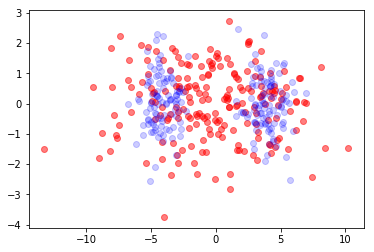

a [-0.73587471  0.01465143  0.87986031 -0.03511961 -0.41330977  0.37998171
  0.60072525 -0.02062362  0.19646742 -0.0015153 ]
b [-2.87399526  0.0115496   0.05652716  0.16464602  0.01502365  0.73783423
  3.77239815  0.55543662  0.21916739 -0.02690916  3.76991567  0.55543092
  0.21848041 -0.02959934]
Step n= 92


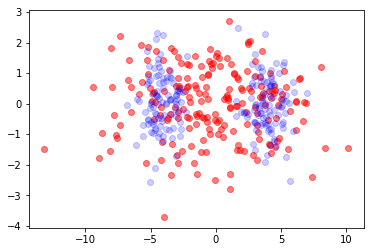

a [-0.73955926  0.01324721  0.87216389 -0.03508228 -0.41877817  0.42401675
  0.65182764 -0.02696023  0.20067506 -0.00167226]
b [-2.86861611  0.01136007  0.0559413   0.16413574  0.01500575  0.73628347
  3.79260191  0.55680006  0.22088221 -0.02763858  3.79013022  0.55679617
  0.2202242  -0.03027425]
Step n= 93


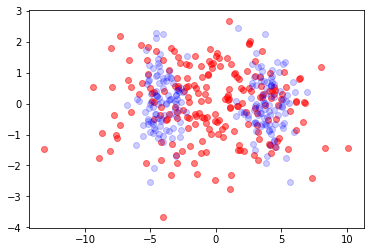

a [-0.74206093  0.01180054  0.86318042 -0.03497069 -0.42581483  0.47400388
  0.70667165 -0.03542931  0.20417742 -0.00185737]
b [-2.86291678  0.01115474  0.05516296  0.16353019  0.01496728  0.7332332
  3.81077436  0.55775916  0.22217808 -0.02828839  3.80831576  0.55775715
  0.22154747 -0.03087085]
Step n= 94


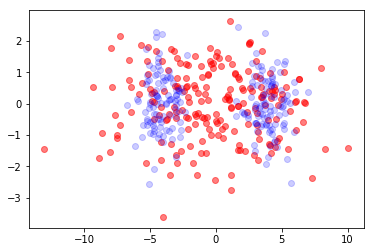

a [-0.74313716  0.01027446  0.85299244 -0.03476911 -0.43450975  0.52974957
  0.76435205 -0.04643352  0.20648552 -0.00207333]
b [-2.8568914   0.0109385   0.05414856  0.16283493  0.01490835  0.72839754
  3.82659432  0.55824469  0.22299256 -0.02884852  3.82415119  0.55824464
  0.22238772 -0.0313792 ]
Step n= 95


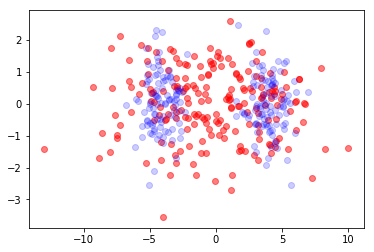

a [-0.74263742  0.00861581  0.84173316 -0.03446823 -0.44487103  0.59079085
  0.82388064 -0.06021338  0.20705642 -0.00231953]
b [-2.85057205  0.01071797  0.05285183  0.16206338  0.01482771  0.72150347
  3.83976579  0.55820293  0.22329448 -0.02930912  3.83734041  0.55820496
  0.22271372 -0.03178956]
Step n= 96


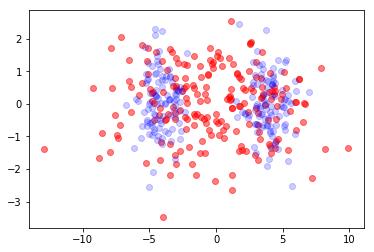

a [-0.74055762  0.00676158  0.82955875 -0.03406817 -0.45682318  0.65645178
  0.88427685 -0.07673543  0.20535482 -0.00259023]
b [-2.84402611  0.01050028  0.05122667  0.16123362  0.0147224   0.71231463
  3.85003992  0.55760271  0.22310059 -0.02966165  3.84763429  0.55760693
  0.22254213 -0.03209353]
Step n= 97


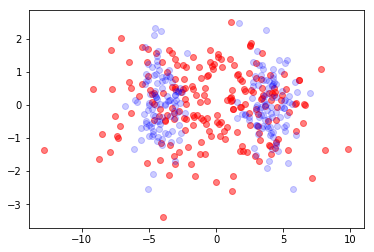

a [-0.73706696  0.00465427  0.81663026 -0.03357849 -0.47020733  0.72590815
  0.9446159  -0.0956307   0.20093438 -0.00287379]
b [-2.8373484   0.01029227  0.04923159  0.16036511  0.01458842  0.7006561
  3.85723628  0.55643966  0.22248313 -0.02990049  3.85485195  0.55644616
  0.22194507 -0.03228564]
Step n= 98


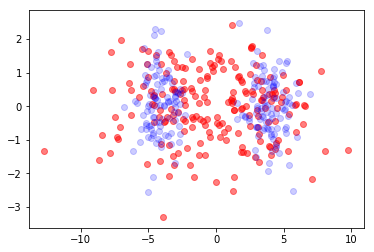

a [-0.73249164  0.00226246  0.8031066  -0.03301568 -0.48478342  0.79825201
  1.00405731 -0.11622217  0.19352429 -0.00315372]
b [-2.8306504   0.01010023  0.04683585  0.1594762   0.01442226  0.68643761
  3.8612599   0.55473755  0.22156327 -0.03002512  3.85889803  0.55474635
  0.22104363 -0.03236547]
Step n= 99


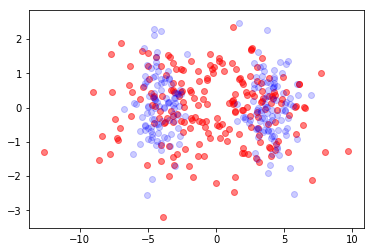

a [-7.27256995e-01 -4.01634798e-04  7.89141544e-01 -3.23994514e-02
 -5.00240200e-01  8.72554015e-01  1.06187393e+00 -1.37642102e-01
  1.83100235e-01 -3.41194269e-03]
b [-2.82404774  0.00993023  0.04402628  0.15858218  0.01422213  0.66967138
  3.8621084   0.55254537  0.22049107 -0.03004198  3.8597698   0.55255645
  0.21998779 -0.03233959]
Step n= 100


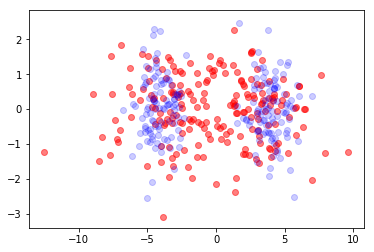

a [-0.72180753 -0.00327571  0.77487994 -0.03174884 -0.51621479  0.94791901
  1.11748012 -0.15899583  0.16992162 -0.00363317]
b [-2.81764787  0.00978847  0.04081238  0.15769349  0.01398874  0.65048047
  3.85986593  0.54992981  0.21941791 -0.02996553  3.85755126  0.54994306
  0.21892895 -0.03222253]
Step n= 101


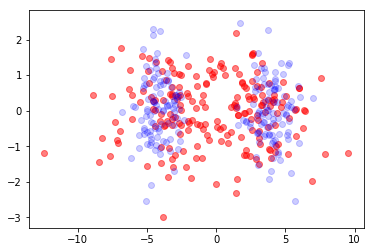

a [-0.71653278 -0.00625442  0.76045518 -0.03107828 -0.53231401  1.02352808
  1.17044586 -0.17950987  0.15452602 -0.00380879]
b [-2.81154023  0.00968108  0.0372281   0.15681451  0.01372586  0.62909652
  3.85468712  0.54696585  0.21847086 -0.0298179   3.85239709  0.5469811
  0.2179942  -0.03203649]
Step n= 102


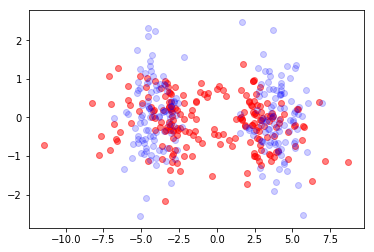

a [-0.77330479 -0.10295997  0.61653361 -0.05771304 -0.66770411  1.47905928
  1.38957247 -0.33358584 -0.02214999 -0.00344415]
b [-2.73957898e+00 -2.73979492e-03 -5.16176282e-02  1.48211675e-01
 -5.97905678e-03  3.76940856e-01  3.81876235e+00  4.83785527e-01
  2.00772772e-01 -4.44703640e-03  3.81491452e+00  4.83796428e-01
  2.00323269e-01 -6.43399850e-03]
Step n= 103


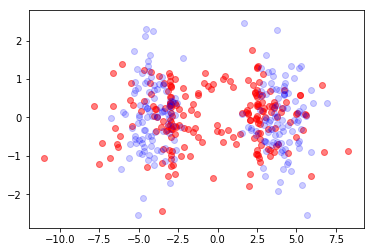

a [-0.67798325  0.01054507  0.54606256 -0.01115102 -0.62150149  1.61240586
  1.44398182 -0.2979313  -0.01728942 -0.00339432]
b [-2.79279113  0.00733899 -0.03678748  0.12870715  0.00958577  0.31469783
  3.78095845  0.48666299  0.20712106 -0.02334608  3.77833792  0.4867499
  0.2066991  -0.02530697]
Step n= 104


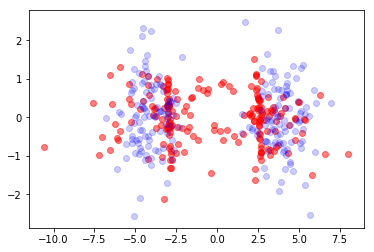

a [-0.690066   -0.00901434  0.49190209 -0.03657338 -0.66426885  1.81064781
  1.51520189 -0.32987974 -0.00675742 -0.00342693]
b [-2.80517306e+00  6.61750695e-03 -3.97666757e-02  1.24784152e-01
  5.03747383e-05  2.14127234e-01  3.74483258e+00  4.78117548e-01
  2.10850610e-01 -3.66574399e-02  3.74169239e+00  4.78178748e-01
  2.10446154e-01 -3.85584176e-02]
Step n= 105


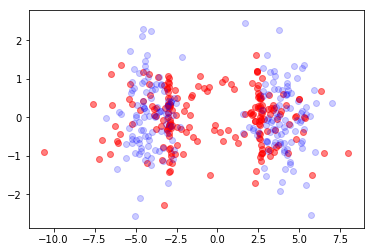

a [-0.68678966 -0.00200621  0.48739221 -0.02555618 -0.64445241  1.84125541
  1.52729782 -0.33091562 -0.00617319 -0.00342684]
b [-2.80768197  0.00749022 -0.03873192  0.12293505  0.00487604  0.2040029
  3.71122455  0.48584373  0.21172697 -0.03913719  3.70817685  0.48590311
  0.21132482 -0.04103185]
Step n= 106


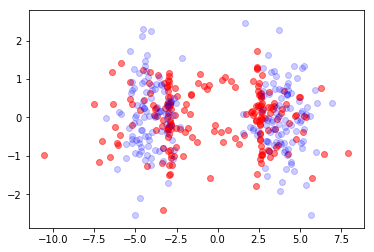

a [-0.683686    0.00483039  0.48382888 -0.02150394 -0.62365918  1.8731651
  1.53965307 -0.33203468 -0.00562046 -0.00342677]
b [-2.80344816  0.00723125 -0.03646045  0.12812747  0.00918182  0.19939226
  3.67821786  0.4878213   0.21225442 -0.0419364   3.67526113  0.48787949
  0.21185429 -0.04382109]
Step n= 107


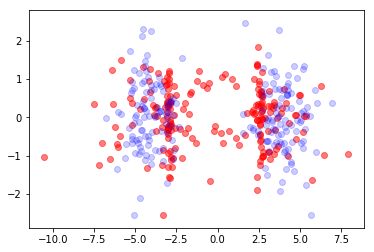

a [-0.6807853   0.01132403  0.48086063 -0.02113469 -0.60346419  1.90548708
  1.55189195 -0.33321401 -0.00510998 -0.00342673]
b [-2.7970095   0.00714923 -0.03343117  0.12994975  0.01116083  0.19944937
  3.64566265  0.48708132  0.21241756 -0.04501047  3.64279347  0.48713947
  0.2120196  -0.04688482]
Step n= 108


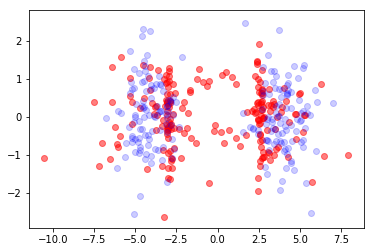

a [-0.6781686   0.01729948  0.47866491 -0.02226147 -0.58508803  1.9377794
  1.56387038 -0.33443794 -0.0046421  -0.00342671]
b [-2.78988373  0.00725343 -0.03001201  0.1299934   0.01153737  0.20365254
  3.61353099  0.48569495  0.21231292 -0.04827434  3.61074543  0.48575336
  0.21191726 -0.05013925]
Step n= 109


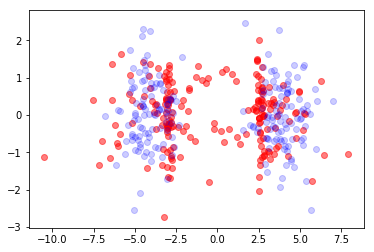

a [-0.67586601  0.02265543  0.47749989 -0.0237549  -0.56935947  1.97004192
  1.57558908 -0.33568936 -0.00420847 -0.0034267 ]
b [-2.78248341  0.007407   -0.02640834  0.1295508   0.01109372  0.2113199
  3.58186827  0.48429365  0.21201647 -0.05165019  3.57916239  0.48435231
  0.21162316 -0.05350673]
Step n= 110


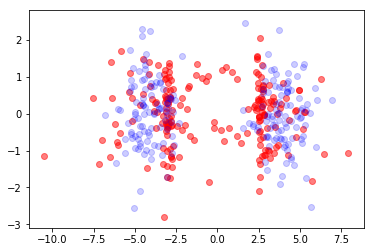

a [-0.67390114  0.02733063  0.47755945 -0.02516798 -0.55684006  2.00244585
  1.58711395 -0.33696534 -0.00380029 -0.0034267 ]
b [-2.77496131  0.00755234 -0.02274591  0.1291052   0.01034772  0.22157786
  3.55076925  0.48309498  0.21158309 -0.05507346  3.54813909  0.48315375
  0.21119212 -0.05692259]
Step n= 111


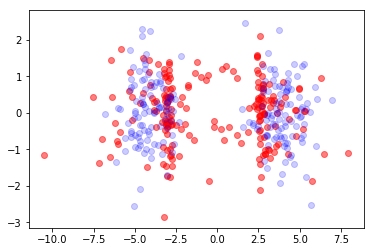

a [-0.6722959   0.03128698  0.47892859 -0.02637525 -0.54779656  2.03518246
  1.59851691 -0.33826588 -0.00341203 -0.0034267 ]
b [-2.76739159  0.00767282 -0.01911534  0.12885323  0.00956952  0.23343877
  3.52034042  0.48216922  0.21105692 -0.05848796  3.517782    0.48222789
  0.21066821 -0.06033042]
Step n= 112


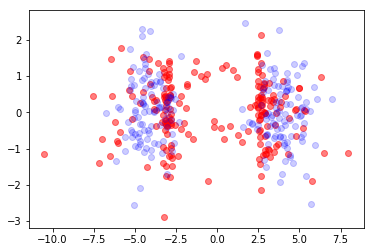

a [-0.67106474  0.03450533  0.48156018 -0.02736595 -0.54219016  2.0684013
  1.60985001 -0.33958628 -0.003042   -0.00342671]
b [-2.75982182  0.00776607 -0.01558892  0.12887301  0.00887244  0.24590107
  3.49067411  0.48152052  0.21047412 -0.06184548  3.48818345  0.4815789
  0.21008758 -0.06368179]
Step n= 113


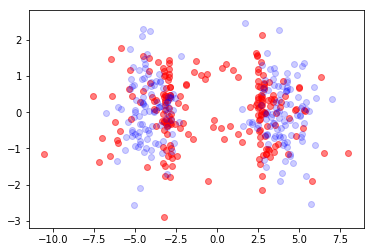

a [-0.67021091  0.0369844   0.48528706 -0.02815748 -0.53971575  2.10218779
  1.62113583 -0.3409154  -0.00269144 -0.00342672]
b [-2.75228822  0.0078327  -0.01222658  0.1291797   0.0082922   0.25804784
  3.46183726  0.48111979  0.20986276 -0.06510652  3.4594105   0.4811777
  0.20947823 -0.06693699]
Step n= 114


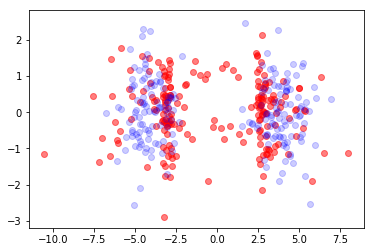

a [-0.66972517  0.0387405   0.48985763 -0.0287701  -0.53987418  2.13656167
  1.63236657 -0.3422374  -0.00236312 -0.00342673]
b [-2.74481876  0.00787253 -0.00907813  0.12975062  0.00783199  0.26912428
  3.43387001  0.48092199  0.20924222 -0.06824102  3.43150348  0.48097932
  0.20885955 -0.07006582]
Step n= 115


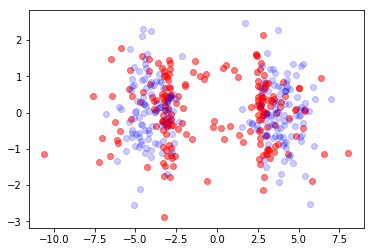

a [-6.69586146e-01  3.98069523e-02  4.94980115e-01 -2.92235007e-02
 -5.42055787e-01  2.17148644e+00  1.64350766e+00 -3.43534387e-01
 -2.06001895e-03 -3.42673797e-03]
b [-2.73743293  0.00788391 -0.00618445  0.13054138  0.00748234  0.27858344
  3.4067894   0.48087723  0.20862322 -0.0712284   3.40447968  0.48093391
  0.20824224 -0.07304758]
Step n= 116


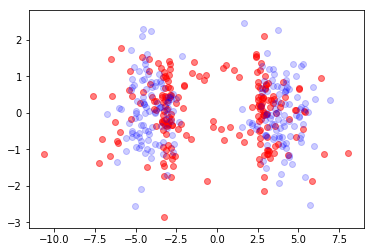

a [-6.69761637e-01  4.02326451e-02  5.00363461e-01 -2.95378984e-02
 -5.45618672e-01  2.20688350e+00  1.65450358e+00 -3.44788992e-01
 -1.78448327e-03 -3.42674338e-03]
b [-2.73014135  0.00786435 -0.00357836  0.13149805  0.00722861  0.28609886
  3.38059509  0.48093837  0.20800858 -0.07405698  3.37833904  0.4809944
  0.20762911 -0.07587053]
Step n= 117


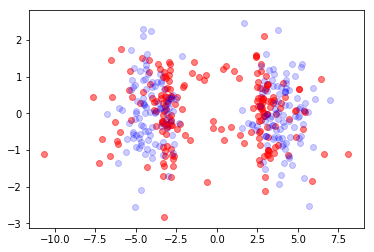

a [-6.70210662e-01  4.00797642e-02  5.05748117e-01 -2.97347626e-02
 -5.49951319e-01  2.24264714e+00  1.66528453e+00 -3.45986085e-01
 -1.53772246e-03 -3.42674613e-03]
b [-2.72294619e+00  7.81125840e-03 -1.28534251e-03  1.32565908e-01
  7.05418524e-03  2.91549793e-01  3.35527528e+00  4.81065690e-01
  2.07394677e-01 -7.67228645e-02  3.35307002e+00  4.81121119e-01
  2.07016545e-01 -7.85307512e-02]
Step n= 118


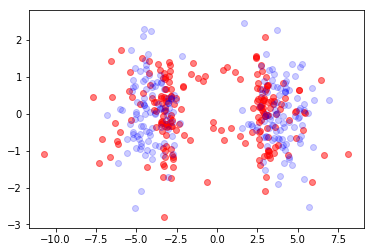

a [-6.70885916e-01  3.94207294e-02  5.10924252e-01 -2.98365802e-02
 -5.54515573e-01  2.27865788e+00  1.67577289e+00 -3.47113811e-01
 -1.31974120e-03 -3.42674629e-03]
b [-2.71584228e+00  7.72262452e-03  6.76102926e-04  1.33695169e-01
  6.94225154e-03  2.94988283e-01  3.33081166e+00  4.81229199e-01
  2.06773302e-01 -7.92286289e-02  3.32865463e+00  4.81284106e-01
  2.06396354e-01 -8.10308298e-02]
Step n= 119


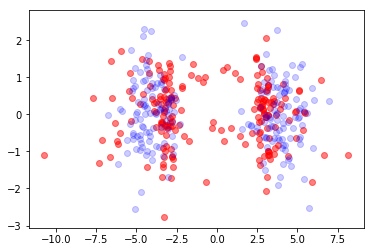

a [-6.71736462e-01  3.83347966e-02  5.15738494e-01 -2.98661231e-02
 -5.58870741e-01  2.31479315e+00  1.68588903e+00 -3.48163937e-01
 -1.12948590e-03 -3.42674412e-03]
b [-2.70881874e+00  7.59742604e-03  2.29439798e-03  1.34843914e-01
  6.87705168e-03  2.96597755e-01  3.30718322e+00  4.81408911e-01
  2.06133671e-01 -8.15818530e-02  3.30507209e+00  4.81463402e-01
  2.05757762e-01 -8.33783720e-02]
Step n= 120


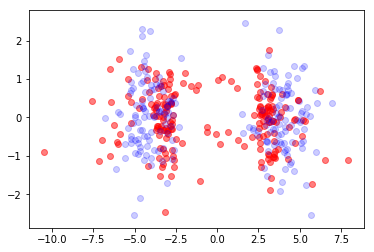

a [-7.08608298e-01 -1.73560697e-02  4.77915656e-01 -4.27073342e-02
 -6.11076811e-01  2.50422367e+00  1.70664746e+00 -3.91355932e-01
 -2.78125222e-04 -3.42686134e-03]
b [-2.66178610e+00  1.47393133e-03 -3.53093086e-02  1.30367890e-01
 -3.97554876e-03  2.23441907e-01  3.27478340e+00  4.60311679e-01
  1.99517491e-01 -8.48674463e-02  3.27210526e+00  4.60407827e-01
  1.99165543e-01 -8.66260986e-02]
Step n= 121


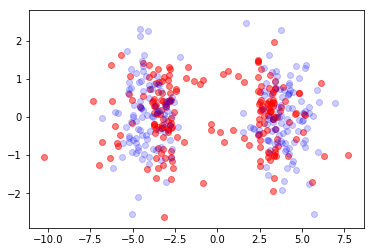

a [-6.50326032e-01  4.72251327e-02  4.39429836e-01 -2.55542367e-02
 -5.81162864e-01  2.60951335e+00  1.70652091e+00 -3.58814319e-01
 -2.35382632e-04 -3.42677083e-03]
b [-2.65247471  0.0055219  -0.01343915  0.11991194  0.00648649  0.21799074
  3.23973899  0.46620495  0.19691386 -0.10514243  3.23766541  0.46632298
  0.1965803  -0.1068934 ]
Step n= 122


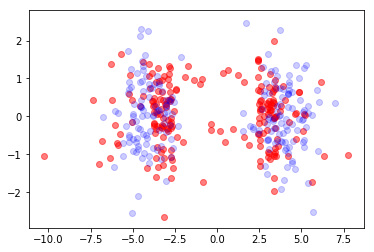

a [-6.50078074e-01  4.77089904e-02  4.46211116e-01 -2.70740986e-02
 -5.75952538e-01  2.63331954e+00  1.70902189e+00 -3.58822038e-01
 -2.13643186e-04 -3.42675908e-03]
b [-2.64710228  0.00545503 -0.00994842  0.12408149  0.00727578  0.21941687
  3.21159903  0.47149806  0.19657587 -0.10784578  3.20958713  0.47160756
  0.19624479 -0.10959428]
Step n= 123


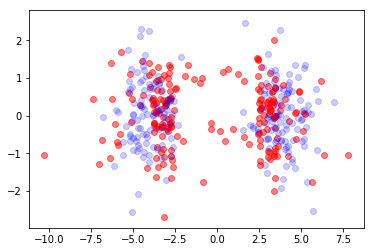

a [-6.49863069e-01  4.75654930e-02  4.52805505e-01 -2.79564560e-02
 -5.69312097e-01  2.65794669e+00  1.71137665e+00 -3.58679154e-01
 -1.93887857e-04 -3.42674748e-03]
b [-2.63923638  0.00509776 -0.00658336  0.12819092  0.00706985  0.22245713
  3.18473065  0.47375287  0.19618626 -0.11040709  3.18277788  0.47385471
  0.19585725 -0.11215199]
Step n= 124


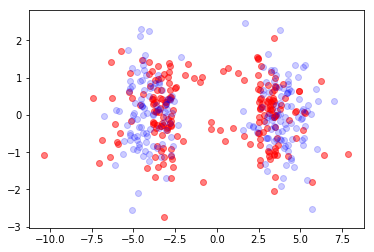

a [-6.49757251e-01  4.68208223e-02  4.59162520e-01 -2.85634093e-02
 -5.62669836e-01  2.68318865e+00  1.71354947e+00 -3.58485764e-01
 -1.75801356e-04 -3.42673600e-03]
b [-2.63057072  0.0048911  -0.00359078  0.1303901   0.00679156  0.22676392
  3.15903002  0.4749064   0.19570657 -0.11286657  3.15713264  0.47500197
  0.19537939 -0.11460768]
Step n= 125


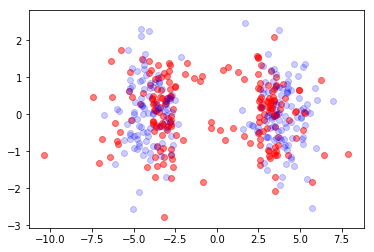

a [-6.49809894e-01  4.55470421e-02  4.65413603e-01 -2.90993011e-02
 -5.56723475e-01  2.70886750e+00  1.71551648e+00 -3.58297154e-01
 -1.59231529e-04 -3.42672465e-03]
b [-2.62164950e+00  4.78322680e-03 -1.09873036e-03  1.31829141e-01
  6.57520238e-03  2.32054313e-01  3.13452033e+00  4.75802655e-01
  1.95162325e-01 -1.15216771e-01  3.13267432e+00  4.75892982e-01
  1.94836759e-01 -1.16954259e-01]
Step n= 126


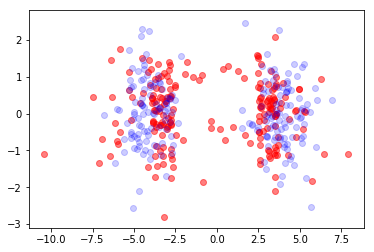

a [-6.50034690e-01  4.38308204e-02  4.71622078e-01 -2.96212820e-02
 -5.51798320e-01  2.73492514e+00  1.71725678e+00 -3.58139506e-01
 -1.44024997e-04 -3.42671343e-03]
b [-2.61265049e+00  4.70232105e-03  8.51997075e-04  1.33010958e-01
  6.39742113e-03  2.38003614e-01  3.11123881e+00  4.76705435e-01
  1.94577499e-01 -1.17450457e-01  3.10944025e+00  4.76791334e-01
  1.94253358e-01 -1.19184556e-01]
Step n= 127


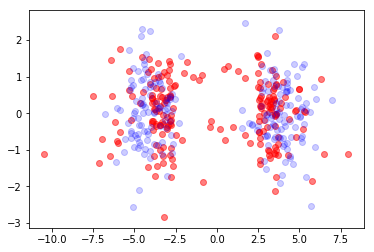

a [-6.50429257e-01  4.17627010e-02  4.77795220e-01 -3.01204383e-02
 -5.48020766e-01  2.76133240e+00  1.71874664e+00 -3.58025306e-01
 -1.30066768e-04 -3.42670233e-03]
b [-2.60364598e+00  4.61278248e-03  2.26217149e-03  1.34104169e-01
  6.23974591e-03  2.44263979e-01  3.08922289e+00  4.77692631e-01
  1.93969393e-01 -1.19563293e-01  3.08746808e+00  4.77774782e-01
  1.93646506e-01 -1.21294228e-01]
Step n= 128


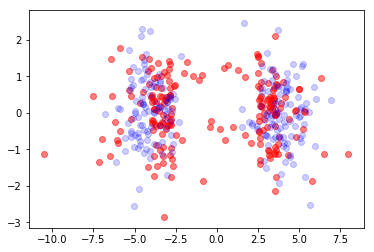

a [-6.50983630e-01  3.94321545e-02  4.83899690e-01 -3.05744050e-02
 -5.45388716e-01  2.78805818e+00  1.71995946e+00 -3.57961258e-01
 -1.17277730e-04 -3.42669134e-03]
b [-2.59467305  0.00450148  0.00315773  0.13516328  0.0061001   0.2504975
  3.06850265  0.47877732  0.1933505  -0.12155443  3.06678811  0.47885631
  0.19302872 -0.1232824 ]
Step n= 129


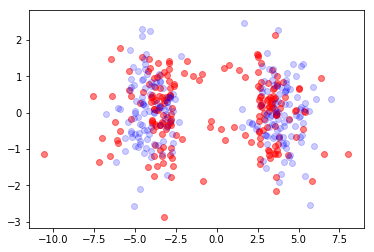

a [-6.51683206e-01  3.69241499e-02  4.89872664e-01 -3.09668513e-02
 -5.43808593e-01  2.81506072e+00  1.72086652e+00 -3.57952031e-01
 -1.05602487e-04 -3.42668046e-03]
b [-2.58575504  0.00436545  0.00358127  0.13620194  0.00598177  0.25640494
  3.04909595  0.47994828  0.19272977 -0.12342651  3.04741845  0.48002463
  0.19240895 -0.12515166]
Step n= 130


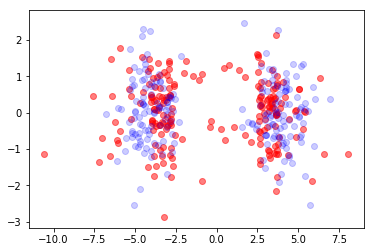

a [-6.52509780e-01  3.43167081e-02  4.95633016e-01 -3.12906336e-02
 -5.43123720e-01  2.84228620e+00  1.72143802e+00 -3.58002074e-01
 -9.49971557e-05 -3.42666967e-03]
b [-2.57690838  0.00420568  0.00358583  0.13721771  0.00588666  0.26174669
  3.03100577  0.48118533  0.19211326 -0.12518528  3.02936231  0.48125949
  0.19179327 -0.12690775]
Step n= 131


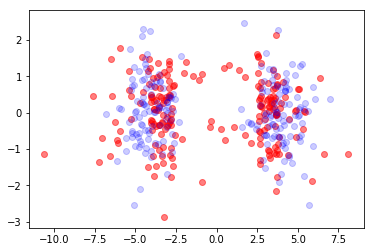

a [-6.53442283e-01  3.16792983e-02  5.01092649e-01 -3.15460216e-02
 -5.43140545e-01  2.86967050e+00  1.72164431e+00 -3.58116609e-01
 -8.54195983e-05 -3.42665898e-03]
b [-2.56814455  0.00402437  0.00322983  0.1382015   0.00581381  0.26635462
  3.01421932  0.48246594  0.19150466 -0.12683905  3.01260713  0.48253833
  0.19118538 -0.12855895]
Step n= 132


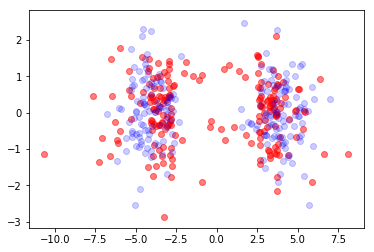

a [-6.54457727e-01  2.90719685e-02  5.06166850e-01 -3.17384036e-02
 -5.43652630e-01  2.89714264e+00  1.72145735e+00 -3.58302173e-01
 -7.68230293e-05 -3.42664837e-03]
b [-2.55947070e+00  3.82396955e-03  2.57305287e-03  1.39141841e-01
  5.75998546e-03  2.70134811e-01  2.99870868e+00  4.83768670e-01
  1.90905845e-01 -1.28398063e-01  2.99712522e+00  4.83839652e-01
  1.90587179e-01 -1.30115482e-01]
Step n= 133


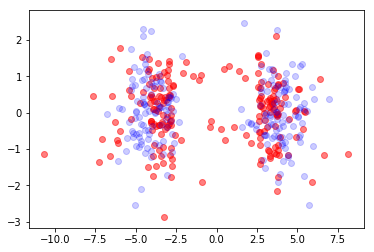

a [-6.55532436e-01  2.65450669e-02  5.10782484e-01 -3.18764506e-02
 -5.44460806e-01  2.92462866e+00  1.72085212e+00 -3.58566825e-01
 -6.91530320e-05 -3.42663785e-03]
b [-2.55088998e+00  3.60693634e-03  1.67359808e-03  1.40027234e-01
  5.72077239e-03  2.73062592e-01  2.98443245e+00  4.85075002e-01
  1.90317568e-01 -1.29873784e-01  2.98287537e+00  4.85144922e-01
  1.89999427e-01 -1.31588808e-01]
Step n= 134


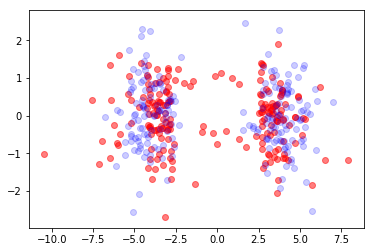

a [-7.02656073e-01 -2.77153775e-02  4.73747327e-01 -3.99160506e-02
 -5.77578436e-01  3.11124695e+00  1.67037821e+00 -4.13419263e-01
 -1.47016382e-05 -3.42653484e-03]
b [-2.47715166e+00 -2.17641273e-03 -4.86356411e-02  1.34538303e-01
 -9.79857063e-04  2.28780779e-01  2.96232135e+00  4.79699175e-01
  1.89441990e-01 -1.31876978e-01  2.96012817e+00  4.80453088e-01
  1.89376658e-01 -1.33643555e-01]
Step n= 135


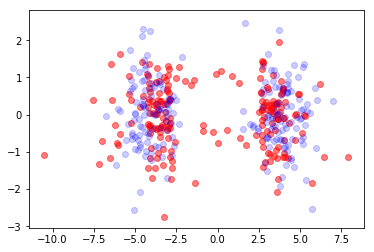

a [-7.02128612e-01 -2.06166493e-02  4.78265136e-01 -3.27436594e-02
 -5.69625142e-01  3.13260870e+00  1.66558185e+00 -4.11756678e-01
 -1.36292978e-05 -3.42652467e-03]
b [-2.47146080e+00 -2.02130506e-03 -5.17702693e-02  1.33948052e-01
  2.30663985e-03  2.26625935e-01  2.94423868e+00  4.84992670e-01
  1.89291773e-01 -1.32575959e-01  2.94216057e+00  4.85681093e-01
  1.89249085e-01 -1.34347507e-01]
Step n= 136


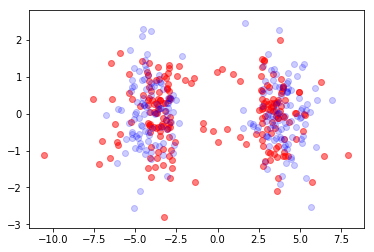

a [-7.01770595e-01 -1.32020759e-02  4.82386525e-01 -3.01951474e-02
 -5.61344042e-01  3.15454537e+00  1.66091583e+00 -4.10429083e-01
 -1.26645509e-05 -3.42651458e-03]
b [-2.46351963e+00 -2.21349324e-03 -5.28517803e-02  1.36286293e-01
  4.43797112e-03  2.27004201e-01  2.92828897e+00  4.87928263e-01
  1.89182137e-01 -1.33559547e-01  2.92630961e+00  4.88543896e-01
  1.89159501e-01 -1.35334346e-01]
Step n= 137


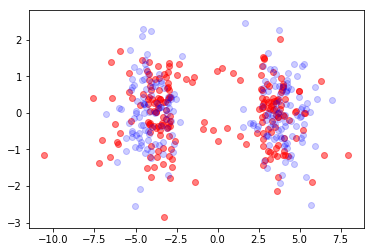

a [-7.01510394e-01 -5.75990620e-03  4.85978180e-01 -2.96188263e-02
 -5.53435386e-01  3.17682442e+00  1.65626285e+00 -4.09400825e-01
 -1.17978515e-05 -3.42650456e-03]
b [-2.45482508e+00 -2.33640017e-03 -5.23380386e-02  1.37558163e-01
  5.25242157e-03  2.29397776e-01  2.91394184e+00  4.89671709e-01
  1.89031388e-01 -1.34794250e-01  2.91204580e+00  4.90222527e-01
  1.89026558e-01 -1.36571447e-01]
Step n= 138


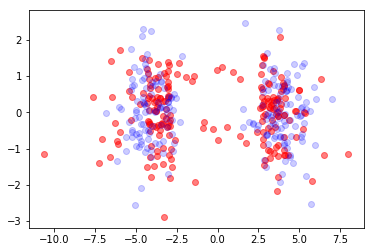

a [-7.01360248e-01  1.40765634e-03  4.89150080e-01 -2.97693325e-02
 -5.46479801e-01  3.19926040e+00  1.65159627e+00 -4.08689359e-01
 -1.10156050e-05 -3.42649463e-03]
b [-2.44594209e+00 -2.41184230e-03 -5.05792763e-02  1.38216711e-01
  5.40759598e-03  2.33388540e-01  2.90095964e+00  4.91097861e-01
  1.88833878e-01 -1.36235300e-01  2.89913398e+00  4.91592993e-01
  1.88844881e-01 -1.38014450e-01]
Step n= 139


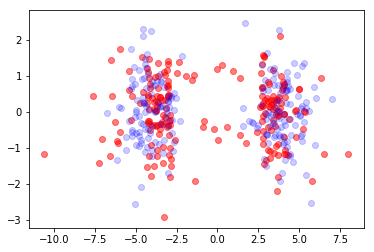

a [-7.01351434e-01  8.05067024e-03  4.92018961e-01 -3.01643998e-02
 -5.40848834e-01  3.22178434e+00  1.64690644e+00 -4.08320962e-01
 -1.03000037e-05 -3.42648478e-03]
b [-2.43704590e+00 -2.48467092e-03 -4.78476686e-02  1.38640099e-01
  5.29924117e-03  2.38507165e-01  2.88926362e+00  4.92491595e-01
  1.88607601e-01 -1.37832381e-01  2.88749737e+00  4.92939167e-01
  1.88632745e-01 -1.39613197e-01]
Step n= 140


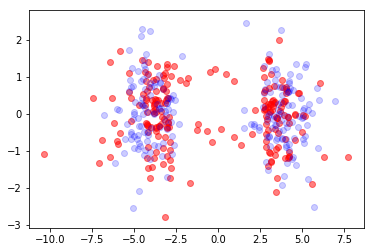

a [-7.31608570e-01 -8.82783438e-03  4.54653730e-01 -3.75574295e-02
 -5.60415416e-01  3.39969470e+00  1.58240879e+00 -4.51087012e-01
 -3.51099568e-06 -3.42638398e-03]
b [-2.34381694e+00 -6.12097607e-03 -5.45515100e-02  1.32082939e-01
  3.90648282e-04  2.30672929e-01  2.87401710e+00  5.11693755e-01
  1.94763217e-01 -1.46632829e-01  2.87202629e+00  5.11955612e-01
  1.94868227e-01 -1.48420250e-01]
Step n= 141


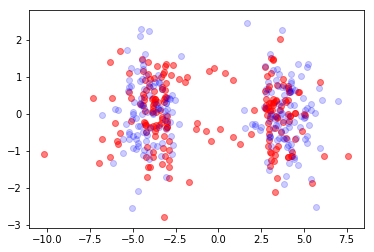

a [-7.31790767e-01  1.03271115e-02  4.25502249e-01 -3.45597372e-02
 -5.58204301e-01  3.52856514e+00  1.53613906e+00 -4.59110427e-01
 -3.01190695e-06 -3.42630162e-03]
b [-2.21728739e+00 -8.12572341e-03 -3.96617915e-02  1.27927294e-01
  2.35286686e-03  2.35327024e-01  2.85937937e+00  5.39668535e-01
  2.03429368e-01 -1.55779589e-01  2.85751663e+00  5.39906868e-01
  2.03591463e-01 -1.57556109e-01]
Step n= 142


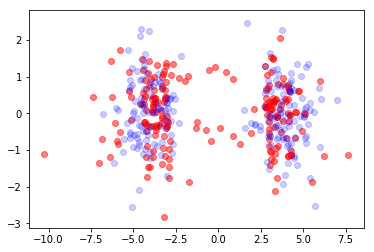

a [-7.33214724e-01  1.32456507e-02  4.36318595e-01 -3.29551562e-02
 -5.53262488e-01  3.54765217e+00  1.53273657e+00 -4.59460876e-01
 -2.82945022e-06 -3.42629276e-03]
b [-2.19923287 -0.00908093 -0.03691142  0.13183713  0.00288984  0.23734749
  2.84916504  0.51829963  0.20402696 -0.15651966  2.84734407  0.5185711
  0.20419693 -0.15829264]
Step n= 143


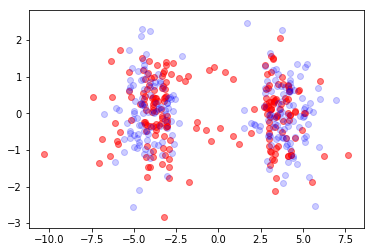

a [-7.35076924e-01  1.58689193e-02  4.43863358e-01 -3.32512340e-02
 -5.51707297e-01  3.56609391e+00  1.52984906e+00 -4.60278165e-01
 -2.66082736e-06 -3.42628383e-03]
b [-2.18915869 -0.00759331 -0.03482297  0.12770484  0.0033879   0.23788161
  2.83802996  0.51760722  0.20415783 -0.15762483  2.83624846  0.5178793
  0.20433579 -0.15939822]
Step n= 144


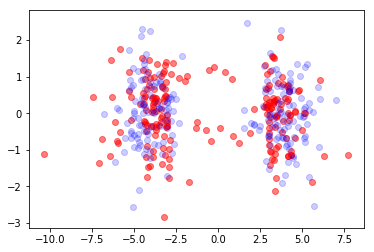

a [-7.37332591e-01  1.80621116e-02  4.49846361e-01 -3.38050175e-02
 -5.50643704e-01  3.58505867e+00  1.52709921e+00 -4.61331042e-01
 -2.50449183e-06 -3.42627456e-03]
b [-2.17950701 -0.00706643 -0.03256609  0.12741333  0.00334511  0.23831752
  2.82778679  0.5185462   0.20436847 -0.15882714  2.82604039  0.5188194
  0.20455459 -0.16060155]
Step n= 145


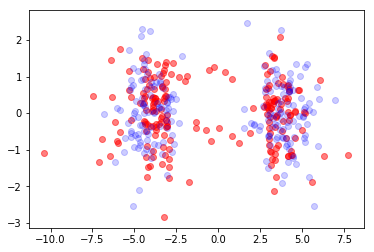

a [-7.39823560e-01  1.96890280e-02  4.54470050e-01 -3.42742072e-02
 -5.49516123e-01  3.60393239e+00  1.52449568e+00 -4.62600618e-01
 -2.36658576e-06 -3.42626535e-03]
b [-2.1702901  -0.00697342 -0.0302621   0.12774567  0.00315319  0.2386761
  2.81890907  0.52011059  0.20460441 -0.16004546  2.81719247  0.52038594
  0.20479865 -0.16182117]
Step n= 146


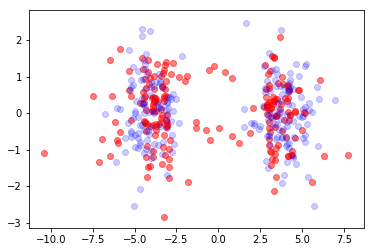

a [-7.42472064e-01  2.07562225e-02  4.57897057e-01 -3.46702337e-02
 -5.48328589e-01  3.62267681e+00  1.52196321e+00 -4.64102128e-01
 -2.24532688e-06 -3.42625622e-03]
b [-2.16125694 -0.00707315 -0.02799611  0.12813451  0.00295482  0.23904936
  2.81133794  0.52179006  0.20484561 -0.16125603  2.80964638  0.52206885
  0.205048   -0.16303323]
Step n= 147


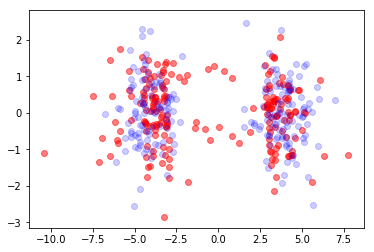

a [-7.45227723e-01  2.12936639e-02  4.60299990e-01 -3.50383258e-02
 -5.47182051e-01  3.64125893e+00  1.51944668e+00 -4.65839992e-01
 -2.13839890e-06 -3.42624713e-03]
b [-2.15231632e+00 -7.26126243e-03 -2.58614216e-02  1.28433224e-01
  2.77754275e-03  2.39473954e-01  2.80493298e+00  5.23444189e-01
  2.05082549e-01 -1.62444008e-01  2.80326228e+00  5.23727791e-01
  2.05293194e-01 -1.64222870e-01]
Step n= 148


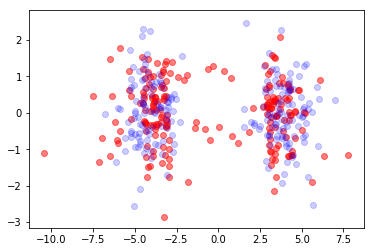

a [-7.48054403e-01  2.13471239e-02  4.61844878e-01 -3.53999322e-02
 -5.46174398e-01  3.65964741e+00  1.51690739e+00 -4.67804553e-01
 -2.04362155e-06 -3.42623810e-03]
b [-2.14343058e+00 -7.49695671e-03 -2.39381616e-02  1.28617714e-01
  2.61792295e-03  2.39943629e-01  2.79954315e+00  5.25042648e-01
  2.05312834e-01 -1.63597741e-01  2.79788970e+00  5.25332389e-01
  2.05531872e-01 -1.65378432e-01]
Step n= 149


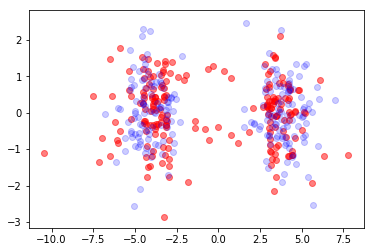

a [-7.50925041e-01  2.09742830e-02  4.62680291e-01 -3.57572953e-02
 -5.45375792e-01  3.67781760e+00  1.51432027e+00 -4.69975229e-01
 -1.95909171e-06 -3.42622911e-03]
b [-2.13457887e+00 -7.76345114e-03 -2.22858517e-02  1.28696765e-01
  2.47036041e-03  2.40423748e-01  2.79502634e+00  5.26584913e-01
  2.05537981e-01 -1.64708078e-01  2.79338705e+00  5.26882095e-01
  2.05765600e-01 -1.66490766e-01]
Step n= 150


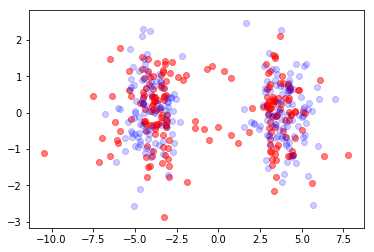

a [-7.53818748e-01  2.02408207e-02  4.62933435e-01 -3.61044592e-02
 -5.44824403e-01  3.69575196e+00  1.51167162e+00 -4.72324220e-01
 -1.88321913e-06 -3.42622015e-03]
b [-2.12574609e+00 -8.05231025e-03 -2.09425286e-02  1.28686107e-01
  2.33213369e-03  2.40864818e-01  2.79125454e+00  5.28077231e-01
  2.05761312e-01 -1.65768340e-01  2.78962677e+00  5.28383132e-01
  2.05997739e-01 -1.67553197e-01]
Step n= 151


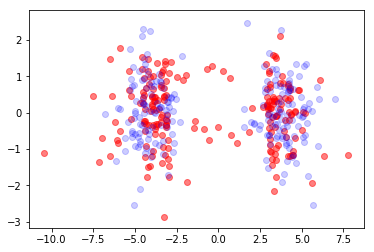

a [-7.56718736e-01  1.92166543e-02  4.62710127e-01 -3.64338500e-02
 -5.44528816e-01  3.71343869e+00  1.50895678e+00 -4.74819596e-01
 -1.81472344e-06 -3.42621123e-03]
b [-2.11691978e+00 -8.35808742e-03 -1.99265173e-02  1.28601177e-01
  2.20246810e-03  2.41213901e-01  2.78811428e+00  5.29526369e-01
  2.05986601e-01 -1.66774296e-01  2.78649576e+00  5.29842257e-01
  2.06232106e-01 -1.68561490e-01]
Step n= 152


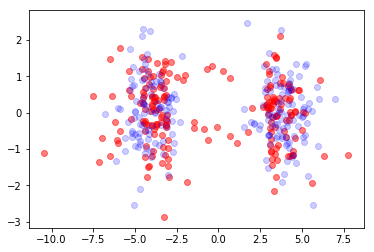

a [-7.59610757e-01  1.79725667e-02  4.62096769e-01 -3.67390538e-02
 -5.44473228e-01  3.73087021e+00  1.50617779e+00 -4.77427695e-01
 -1.75260963e-06 -3.42620233e-03]
b [-2.10808894e+00 -8.67661478e-03 -1.92392232e-02  1.28455257e-01
  2.08127063e-03  2.41423356e-01  2.78550564e+00  5.30938244e-01
  2.06217245e-01 -1.67724008e-01  2.78389444e+00  5.31265396e-01
  2.06472134e-01 -1.69513709e-01]
Step n= 153


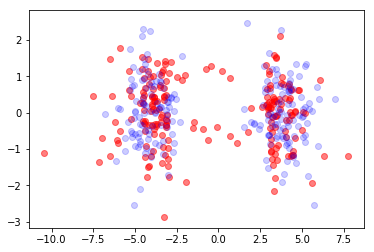

a [-7.62482026e-01  1.65773535e-02  4.61163221e-01 -3.70156688e-02
 -5.44623921e-01  3.74804193e+00  1.50334125e+00 -4.80114974e-01
 -1.69613046e-06 -3.42619346e-03]
b [-2.09924373e+00 -9.00445651e-03 -1.88682354e-02  1.28259201e-01
  1.96848012e-03  2.41456705e-01  2.78334108e+00  5.32317916e-01
  2.06455786e-01 -1.68617606e-01  2.78173555e+00  5.32657628e-01
  2.06720408e-01 -1.70409979e-01]
Step n= 154


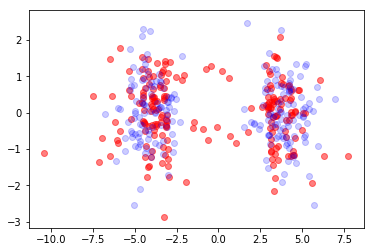

a [-7.65320568e-01  1.50955374e-02  4.59965894e-01 -3.72613622e-02
 -5.44935996e-01  3.76495132e+00  1.50045667e+00 -4.82849411e-01
 -1.64474283e-06 -3.42618460e-03]
b [-2.09037518e+00 -9.33870733e-03 -1.87904059e-02  1.28021635e-01
  1.86385417e-03  2.41291750e-01  2.78154430e+00  5.33669871e-01
  2.06703718e-01 -1.69456986e-01  2.77994305e+00  5.34023472e-01
  2.06978462e-01 -1.71252196e-01]
Step n= 155


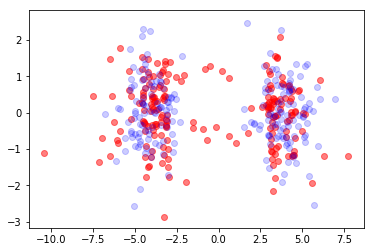

a [-7.68114918e-01  1.35856424e-02  4.58550639e-01 -3.74756305e-02
 -5.45359660e-01  3.78159733e+00  1.49753508e+00 -4.85601542e-01
 -1.59806352e-06 -3.42617577e-03]
b [-2.08147508e+00 -9.67689070e-03 -1.89747338e-02  1.27749291e-01
  1.76695184e-03  2.40921319e-01  2.78004929e+00  5.34998298e-01
  2.06961492e-01 -1.70245481e-01  2.77845115e+00  5.35367165e-01
  2.07246787e-01 -1.72043694e-01]
Step n= 156


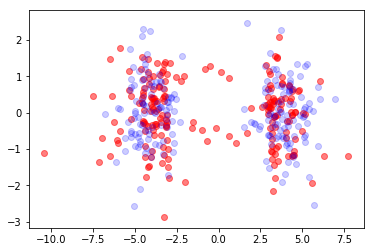

a [-7.70854086e-01  1.20989891e-02  4.56955232e-01 -3.76594580e-02
 -5.45845548e-01  3.79797997e+00  1.49458806e+00 -4.88345167e-01
 -1.55582821e-06 -3.42616695e-03]
b [-2.07253591e+00 -1.00168896e-02 -1.93849676e-02  1.27447358e-01
  1.67718064e-03  2.40352187e-01  2.77879957e+00  5.36307275e-01
  2.07228645e-01 -1.70987514e-01  2.77720355e+00  5.36692847e-01
  2.07524967e-01 -1.72788898e-01]
Step n= 157


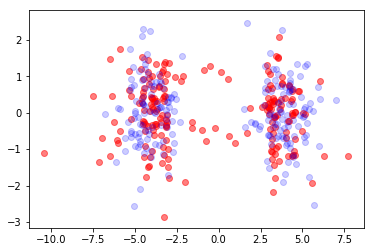

a [-7.73527694e-01  1.06789558e-02  4.55211348e-01 -3.78149521e-02
 -5.46348830e-01  3.81410009e+00  1.49162714e+00 -4.91057788e-01
 -1.51785628e-06 -3.42615815e-03]
b [-2.06355083e+00 -1.03568927e-02 -1.99818815e-02  1.27119818e-01
  1.59385440e-03  2.39602734e-01  2.77774739e+00  5.37600853e-01
  2.07504024e-01 -1.71688263e-01  2.77615264e+00  5.38004646e-01
  2.07811891e-01 -1.73492988e-01]
Step n= 158


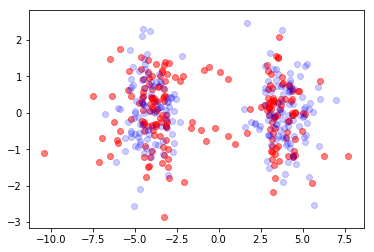

a [-7.76126202e-01  9.36064180e-03  4.53346050e-01 -3.79449934e-02
 -5.46832007e-01  3.82995924e+00  1.48866332e+00 -4.93720796e-01
 -1.48402230e-06 -3.42614936e-03]
b [-2.05451368e+00 -1.06953513e-02 -2.07252173e-02  1.26769732e-01
  1.51624432e-03  2.38699913e-01  2.77685300e+00  5.38883072e-01
  2.07786021e-01 -1.72353341e-01  2.77525882e+00  5.39306692e-01
  2.08105999e-01 -1.74161582e-01]
Step n= 159


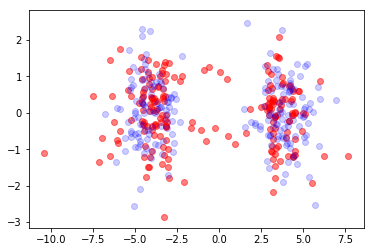

a [-7.78641161e-01  8.17086795e-03  4.51382839e-01 -3.80529210e-02
 -5.47266477e-01  3.84555952e+00  1.48570683e+00 -4.96319460e-01
 -1.45423453e-06 -3.42614059e-03]
b [-2.04541895e+00 -1.10309449e-02 -2.15752965e-02  1.26399487e-01
  1.44361913e-03  2.37675978e-01  2.77608396e+00  5.40157914e-01
  2.08072823e-01 -1.72988514e-01  2.77448974e+00  5.40603075e-01
  2.08405528e-01 -1.74800450e-01]
Step n= 160


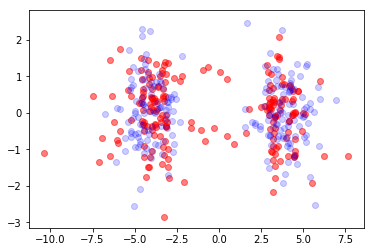

a [-7.81065440e-01  7.12845538e-03  4.49342366e-01 -3.81422657e-02
 -5.47633031e-01  3.86090355e+00  1.48276705e+00 -4.98842751e-01
 -1.42841972e-06 -3.42613182e-03]
b [-2.03626186e+00 -1.13625546e-02 -2.24943240e-02  1.26010988e-01
  1.37527509e-03  2.36565345e-01  2.77541430e+00  5.41429230e-01
  2.08362628e-01 -1.73599450e-01  2.77381952e+00  5.41897770e-01
  2.08708725e-01 -1.75415268e-01]
Step n= 161


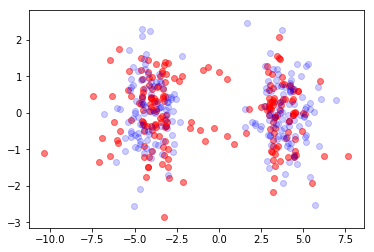

a [-7.83393397e-01  6.24472626e-03  4.47242872e-01 -3.82165356e-02
 -5.47921487e-01  3.87599437e+00  1.47985242e+00 -5.01283045e-01
 -1.40651349e-06 -3.42612306e-03]
b [-2.02703827e+00 -1.16892413e-02 -2.34474050e-02  1.25605808e-01
  1.31055744e-03  2.35401824e-01  2.77482375e+00  5.42700658e-01
  2.08653819e-01 -1.74191523e-01  2.77322796e+00  5.43194557e-01
  2.09014030e-01 -1.76011416e-01]
Step n= 162


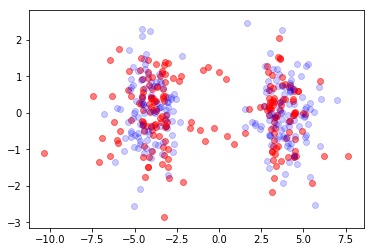

a [-7.85620984e-01  5.52417713e-03  4.45100459e-01 -3.82790545e-02
 -5.48129677e-01  3.89083534e+00  1.47697051e+00 -5.03635742e-01
 -1.38845516e-06 -3.42611431e-03]
b [-2.01774477e+00 -1.20102285e-02 -2.44033027e-02  1.25185296e-01
  1.24887515e-03  2.34216400e-01  2.77429699e+00  5.43975541e-01
  2.08945098e-01 -1.74769651e-01  2.77269977e+00  5.44496945e-01
  2.09320201e-01 -1.76593820e-01]
Step n= 163


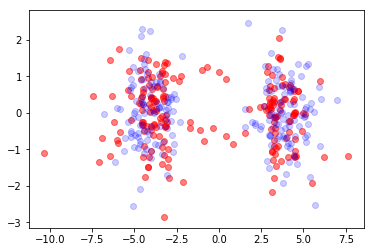

a [-7.87745761e-01  4.96528028e-03  4.42929239e-01 -3.83328485e-02
 -5.48262024e-01  3.90543015e+00  1.47412799e+00 -5.05898826e-01
 -1.37418604e-06 -3.42610556e-03]
b [-2.00837853e+00 -1.23248885e-02 -2.53349605e-02  1.24750652e-01
  1.18971032e-03  2.33035613e-01  2.77382280e+00  5.45256863e-01
  2.09235561e-01 -1.75338183e-01  2.77222376e+00  5.45808101e-01
  2.09626398e-01 -1.77166838e-01]
Step n= 164


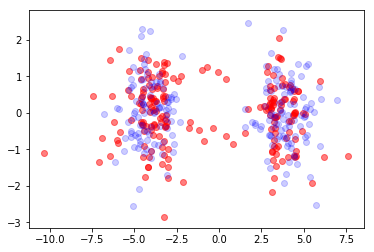

a [-7.89766848e-01  4.56137248e-03  4.40741423e-01 -3.83805773e-02
 -5.48327888e-01  3.91978263e+00  1.47133071e+00 -5.08072420e-01
 -1.36365027e-06 -3.42609682e-03]
b [-1.99893737e+00 -1.26327296e-02 -2.62198141e-02  1.24302972e-01
  1.13262335e-03  2.31880551e-01  2.77339332e+00  5.46547201e-01
  2.09524742e-01 -1.75900832e-01  2.77179209e+00  5.47130810e-01
  2.09932221e-01 -1.77734192e-01]
Step n= 165


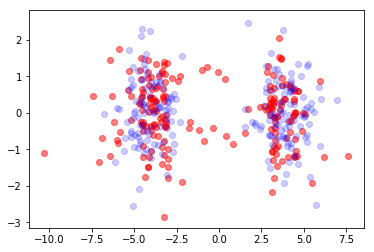

a [-7.91684807e-01  4.30159397e-03  4.38547386e-01 -3.84245008e-02
 -5.48339866e-01  3.93389674e+00  1.46858373e+00 -5.10158332e-01
 -1.35679742e-06 -3.42608809e-03]
b [-1.98941961e+00 -1.29333855e-02 -2.70399148e-02  1.23843273e-01
  1.07725443e-03  2.30766434e-01  2.77300337e+00  5.47848698e-01
  2.09812605e-01 -1.76460636e-01  2.77139958e+00  5.48467449e-01
  2.10237707e-01 -1.78298932e-01]
Step n= 166


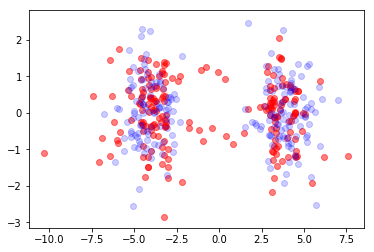

a [-7.93501475e-01  4.17184336e-03  4.36355740e-01 -3.84664747e-02
 -5.48312174e-01  3.94777648e+00  1.46589137e+00 -5.12159637e-01
 -1.35358617e-06 -3.42607936e-03]
b [-1.97982404e+00 -1.32266046e-02 -2.77818879e-02  1.23372501e-01
  1.02332180e-03  2.29702683e-01  2.77264977e+00  5.49163059e-01
  2.10099515e-01 -1.77019965e-01  2.77104304e+00  5.49819986e-01
  2.10543300e-01 -1.78863437e-01]
Step n= 167


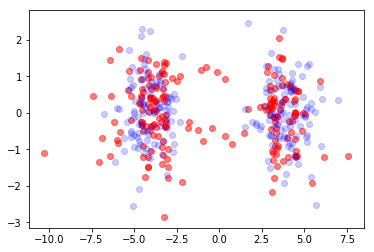

a [-7.95219764e-01  4.15571642e-03  4.34173422e-01 -3.85079692e-02
 -5.48259231e-01  3.96142578e+00  1.46325721e+00 -5.14080293e-01
 -1.35398856e-06 -3.42607064e-03]
b [-1.97014983e+00 -1.35122407e-02 -2.84367475e-02  1.22891526e-01
  9.70617239e-04  2.28693397e-01  2.77233078e+00  5.50491566e-01
  2.10386186e-01 -1.77580546e-01  2.77072071e+00  5.51189996e-01
  2.10849800e-01 -1.79429448e-01]
Step n= 168


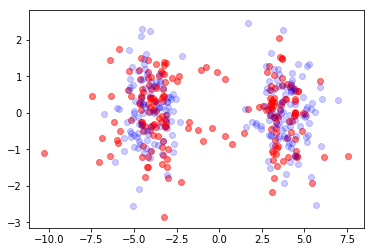

a [-7.96843447e-01  4.23540022e-03  4.32005814e-01 -3.85501010e-02
 -5.48194502e-01  3.97484849e+00  1.46068417e+00 -5.15924804e-01
 -1.35799447e-06 -3.42606192e-03]
b [-1.96039644e+00 -1.37902424e-02 -2.89995914e-02  1.22401139e-01
  9.18999201e-04  2.27738131e-01  2.77204559e+00  5.51835109e-01
  2.10673609e-01 -1.78143515e-01  2.77043176e+00  5.52578694e-01
  2.11158291e-01 -1.79998116e-01]
Step n= 169


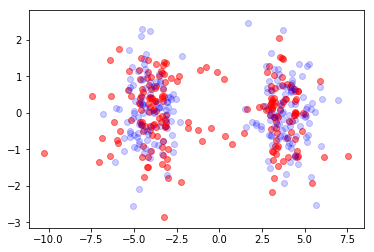

a [-7.98376936e-01  4.39249728e-03  4.29856893e-01 -3.85936759e-02
 -5.48129642e-01  3.98804828e+00  1.45817449e+00 -5.17697941e-01
 -1.36561600e-06 -3.42605320e-03]
b [-1.95056357e+00 -1.40606431e-02 -2.94691995e-02  1.21902035e-01
  8.68384045e-04  2.26832843e-01  2.77179398e+00  5.53194229e-01
  2.10962981e-01 -1.78709483e-01  2.77017593e+00  5.53986987e-01
  2.11470073e-01 -1.80570065e-01]
Step n= 170


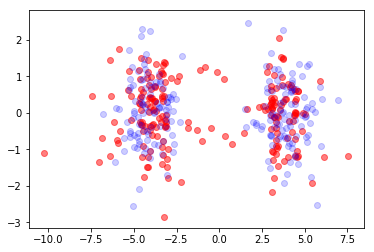

a [-7.99825079e-01  4.60875884e-03  4.27729409e-01 -3.86392349e-02
 -5.48073956e-01  4.00102865e+00  1.45572985e+00 -5.19404515e-01
 -1.37689159e-06 -3.42604448e-03]
b [-1.94065106e+00 -1.43235504e-02 -2.98475597e-02  1.21394806e-01
  8.18736071e-04  2.25970929e-01  2.77157593e+00  5.54569170e-01
  2.11255630e-01 -1.79278611e-01  2.76995318e+00  5.55415521e-01
  2.11786588e-01 -1.81145476e-01]
Step n= 171


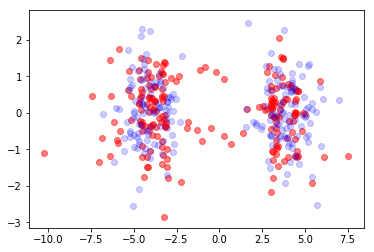

a [-8.01192966e-01  4.86671166e-03  4.25625078e-01 -3.86871007e-02
 -5.48034151e-01  4.01379289e+00  1.45335136e+00 -5.21049205e-01
 -1.39188987e-06 -3.42603577e-03]
b [-1.93065884e+00 -1.45791347e-02 -3.01393475e-02  1.20879938e-01
  7.70056963e-04  2.25144232e-01  2.77139147e+00  5.55959934e-01
  2.11552945e-01 -1.79850692e-01  2.76976350e+00  5.56864752e-01
  2.12109349e-01 -1.81724162e-01]
Step n= 172


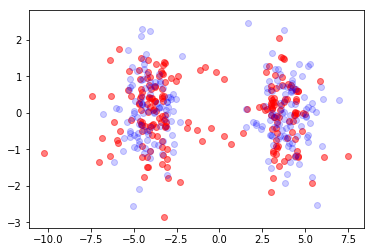

a [-8.02485777e-01  5.15016798e-03  4.23544789e-01 -3.87374207e-02
 -5.48014346e-01  4.02634408e+00  1.45103962e+00 -5.22636434e-01
 -1.41071312e-06 -3.42602706e-03]
b [-1.92058690e+00 -1.48276189e-02 -3.03513804e-02  1.20357805e-01
  7.22375302e-04  2.24343973e-01  2.77124050e+00  5.57366339e-01
  2.11856319e-01 -1.80425232e-01  2.76960672e+00  5.58334996e-01
  2.12439885e-01 -1.82305652e-01]
Step n= 173


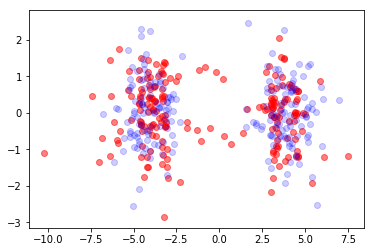

a [-8.03708644e-01  5.44461446e-03  4.21488803e-01 -3.87902066e-02
 -5.48016278e-01  4.03868510e+00  1.44879483e+00 -5.24170292e-01
 -1.43350046e-06 -3.42601835e-03]
b [-1.91043518e+00 -1.50692666e-02 -3.04920728e-02  1.19828676e-01
  6.75736743e-04  2.23561523e-01  2.77112269e+00  5.58788071e-01
  2.12167093e-01 -1.81001526e-01  2.76948250e+00  5.59826495e-01
  2.12779687e-01 -1.82889267e-01]
Step n= 174


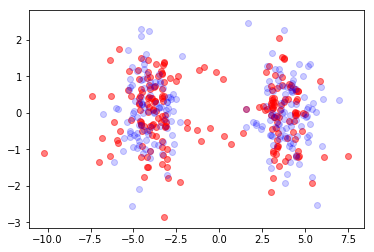

a [-8.04866559e-01  5.73748101e-03  4.19456948e-01 -3.88453673e-02
 -5.48039665e-01  4.05081866e+00  1.44661680e+00 -5.25654492e-01
 -1.46043081e-06 -3.42600964e-03]
b [-1.90020364e+00 -1.53043720e-02 -3.05709091e-02  1.19292719e-01
  6.30195283e-04  2.22789017e-01  2.77103752e+00  5.60224726e-01
  2.12486523e-01 -1.81578731e-01  2.76939024e+00  5.61339462e-01
  2.13130176e-01 -1.83474193e-01]
Step n= 175


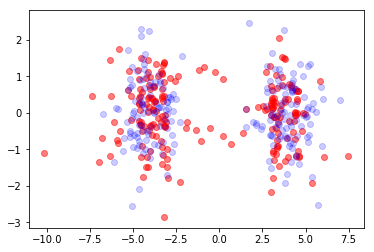

a [-8.05964301e-01  6.01829605e-03  4.17448785e-01 -3.89027359e-02
 -5.48082647e-01  4.06274732e+00  1.44450508e+00 -5.27092366e-01
 -1.49172588e-06 -3.42600093e-03]
b [-1.88989218e+00 -1.55332491e-02 -3.05979534e-02  1.18750015e-01
  5.85805958e-04  2.22019768e-01  2.77098422e+00  5.61675854e-01
  2.12815749e-01 -1.82155923e-01  2.76932915e+00  5.62874131e-01
  2.13492674e-01 -1.84059540e-01]
Step n= 176


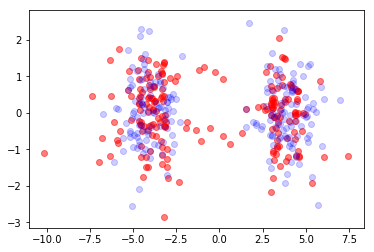

a [-8.07006399e-01  6.27873809e-03  4.15463751e-01 -3.89620911e-02
 -5.48142266e-01  4.07447351e+00  1.44245898e+00 -5.28486875e-01
 -1.52765315e-06 -3.42599222e-03]
b [-1.87950064e+00 -1.57562231e-02 -3.05834097e-02  1.18200575e-01
  5.42619108e-04  2.21248503e-01  2.77096188e+00  5.63140981e-01
  2.13155781e-01 -1.82732157e-01  2.76929825e+00  5.64430790e-01
  2.13868392e-01 -1.84644396e-01]
Step n= 177


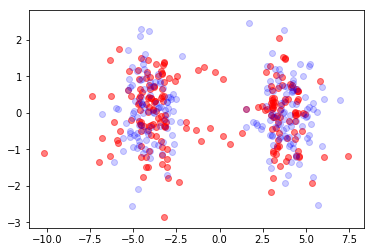

a [-8.07997113e-01  6.51259759e-03  4.13501272e-01 -3.90231743e-02
 -5.48214933e-01  4.08599956e+00  1.44047767e+00 -5.29840647e-01
 -1.56852924e-06 -3.42598351e-03]
b [-1.86902885e+00 -1.59736222e-02 -3.05372417e-02  1.17644348e-01
  5.00676229e-04  2.20471438e-01  2.77096946e+00  5.64619633e-01
  2.13507489e-01 -1.83306500e-01  2.76929645e+00  5.66009812e-01
  2.14258420e-01 -1.85227873e-01]
Step n= 178


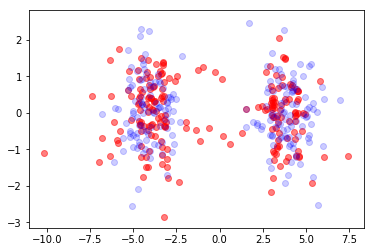

a [-8.08940434e-01  6.71566410e-03  4.11560847e-01 -3.90857016e-02
 -5.48296839e-01  4.09732774e+00  1.43856022e+00 -5.31156015e-01
 -1.61472364e-06 -3.42597480e-03]
b [-1.85847657e+00 -1.61857709e-02 -3.04688589e-02  1.17081247e-01
  4.60007333e-04  2.19686221e-01  2.77100589e+00  5.66111345e-01
  2.13871607e-01 -1.83878072e-01  2.76932261e+00  5.67611668e-01
  2.14663734e-01 -1.85809133e-01]
Step n= 179


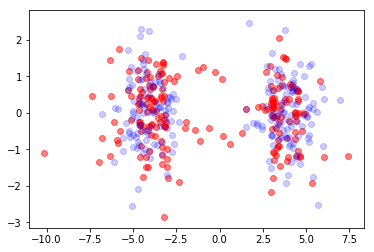

a [-8.09840099e-01  6.88555547e-03  4.09642096e-01 -3.91493734e-02
 -5.48384304e-01  4.10846030e+00  1.43670566e+00 -5.32435070e-01
 -1.66666320e-06 -3.42596609e-03]
b [-1.84784358e+00 -1.63929851e-02 -3.03868711e-02  1.16511158e-01
  4.20629611e-04  2.18891768e-01  2.77107011e+00  5.67615660e-01
  2.14248732e-01 -1.84446066e-01  2.76937564e+00  5.69236944e-01
  2.15085201e-01 -1.86387418e-01]
Step n= 180


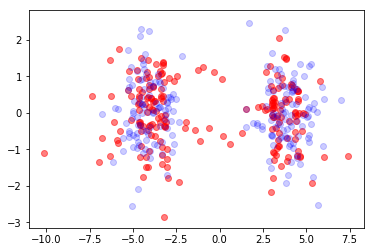

a [-8.10699614e-01  7.02150517e-03  4.07744786e-01 -3.92138817e-02
 -5.48474034e-01  4.11939942e+00  1.43491304e+00 -5.33679711e-01
 -1.72483737e-06 -3.42595738e-03]
b [-1.83712964e+00 -1.65955680e-02 -3.02989105e-02  1.15933955e-01
  3.82547218e-04  2.18088041e-01  2.77116116e+00  5.69132127e-01
  2.14639340e-01 -1.85009763e-01  2.76945447e+00  5.70886347e-01
  2.15523589e-01 -1.86962062e-01]
Step n= 181


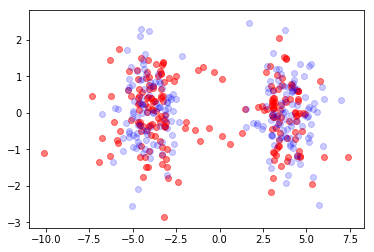

a [-8.11522283e-01  7.12412341e-03  4.05868840e-01 -3.92789160e-02
 -5.48563295e-01  4.13014732e+00  1.43318144e+00 -5.34891692e-01
 -1.78980452e-06 -3.42594866e-03]
b [-1.82633451e+00 -1.67938079e-02 -3.02115180e-02  1.15349515e-01
  3.45751890e-04  2.17275787e-01  2.77127817e+00  5.70660288e-01
  2.15043789e-01 -1.85568538e-01  2.76955817e+00  5.72560702e-01
  2.15979583e-01 -1.87532503e-01]
Step n= 182


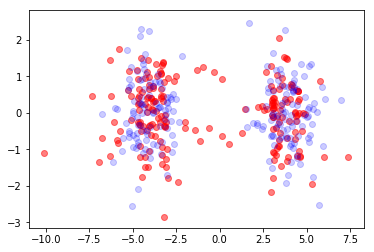

a [-8.12311236e-01  7.19514603e-03  4.04014316e-01 -3.93441689e-02
 -5.48650000e-01  4.14070618e+00  1.43151000e+00 -5.36072665e-01
 -1.86219953e-06 -3.42593995e-03]
b [-1.81545803e+00 -1.69879774e-02 -3.01300881e-02  1.14757723e-01
  3.10224195e-04  2.16456274e-01  2.77142041e+00  5.72199662e-01
  2.15462334e-01 -1.86121868e-01  2.76968595e+00  5.74260958e-01
  2.16453796e-01 -1.88098280e-01]
Step n= 183


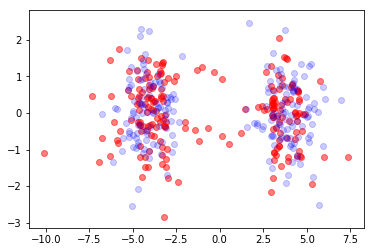

a [-8.13069460e-01  7.23718316e-03  4.02181390e-01 -3.94093406e-02
 -5.48732727e-01  4.15107821e+00  1.42989795e+00 -5.37224220e-01
 -1.94274271e-06 -3.42593123e-03]
b [-1.80450003e+00 -1.71783329e-02 -3.00588645e-02  1.14158482e-01
  2.75935164e-04  2.15631045e-01  2.77158734e+00  5.73749731e-01
  2.15895140e-01 -1.86669323e-01  2.76983715e+00  5.75988178e-01
  2.16946785e-01 -1.88659034e-01]
Step n= 184


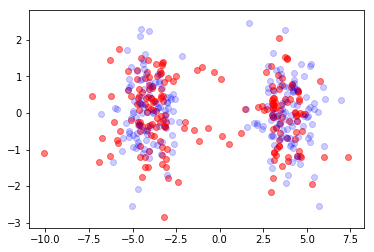

a [-8.13799821e-01  7.25347790e-03  4.00370323e-01 -3.94741442e-02
 -5.48810675e-01  4.16126562e+00  1.42834459e+00 -5.38347906e-01
 -2.03225054e-06 -3.42592252e-03]
b [-1.79346043e+00 -1.73651155e-02 -3.00009793e-02  1.13551717e-01
  2.42848128e-04  2.14801702e-01  2.77177855e+00  5.75309918e-01
  2.16342283e-01 -1.87210565e-01  2.77001129e+00  5.77743543e-01
  2.17459064e-01 -1.89214504e-01]
Step n= 185


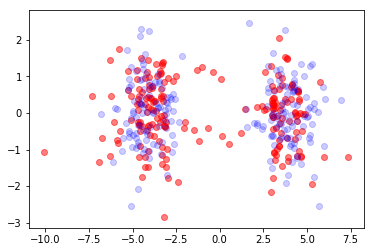

a [-8.14505088e-01  7.24768262e-03  3.98581428e-01 -3.95383100e-02
 -5.48883587e-01  4.17127062e+00  1.42684932e+00 -5.39445262e-01
 -2.13164820e-06 -3.42591379e-03]
b [-1.78233922e+00 -1.75485527e-02 -2.99585264e-02  1.12937372e-01
  2.10920603e-04  2.13969740e-01  2.77199380e+00  5.76879568e-01
  2.16803763e-01 -1.87745334e-01  2.77020800e+00  5.79528346e-01
  2.17991110e-01 -1.89764513e-01]
Step n= 186


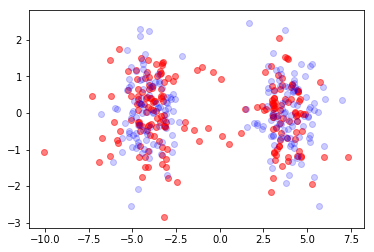

a [-8.15187948e-01  7.22365873e-03  3.96815042e-01 -3.96015899e-02
 -5.48951637e-01  4.18109541e+00  1.42541160e+00 -5.40517823e-01
 -2.24198436e-06 -3.42590507e-03]
b [-1.77113643e+00 -1.77288596e-02 -2.99326609e-02  1.12315419e-01
  1.80106087e-04  2.13136424e-01  2.77223298e+00  5.78457928e-01
  2.17279507e-01 -1.88273440e-01  2.77042707e+00  5.81343995e-01
  2.18543380e-01 -1.90308964e-01]
Step n= 187


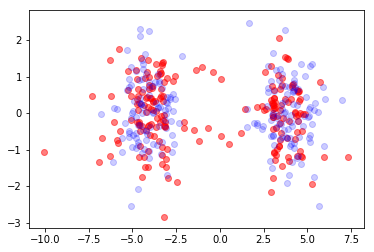

a [-8.15851018e-01  7.18530336e-03  3.95071495e-01 -3.96637618e-02
 -5.49015311e-01  4.19074221e+00  1.42403100e+00 -5.41567134e-01
 -2.36444843e-06 -3.42589634e-03]
b [-1.75985220e+00 -1.79062413e-02 -2.99237165e-02  1.11685847e-01
  1.50355705e-04  2.12302713e-01  2.77249608e+00  5.80044131e-01
  2.17769372e-01 -1.88794754e-01  2.77066836e+00  5.83192018e-01
  2.19116311e-01 -1.90847823e-01]
Step n= 188


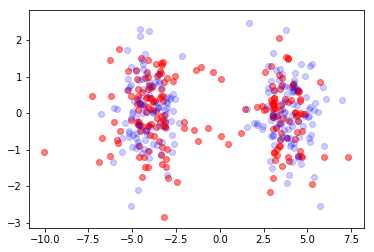

a [-8.16496850e-01  7.13640519e-03  3.93351094e-01 -3.97246330e-02
 -5.49075289e-01  4.20021320e+00  1.42270711e+00 -5.42594748e-01
 -2.50039077e-06 -3.42588761e-03]
b [-1.74848670e+00 -1.80808943e-02 -2.99313327e-02  1.11048667e-01
  1.21619630e-04  2.11469227e-01  2.77278321e+00  5.81637174e-01
  2.18273144e-01 -1.89309189e-01  2.77093183e+00  5.85074062e-01
  2.19710331e-01 -1.91381113e-01]
Step n= 189


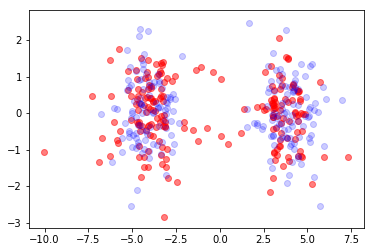

a [-8.17127937e-01  7.08052942e-03  3.91654104e-01 -3.97840424e-02
 -5.49132341e-01  4.20951057e+00  1.42143963e+00 -5.43602227e-01
 -2.65134611e-06 -3.42587888e-03]
b [-1.73704022e+00 -1.82530087e-02 -2.99545864e-02  1.10403901e-01
  9.38482613e-05  2.10636255e-01  2.77309452e+00  5.83235907e-01
  2.18790541e-01 -1.89816694e-01  2.77121749e+00  5.86991909e-01
  2.20325863e-01 -1.91908897e-01]
Step n= 190


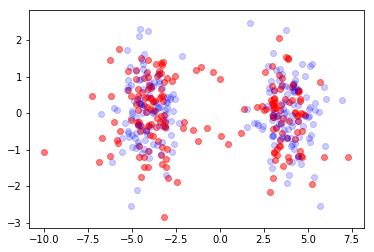

a [-8.17746710e-01  7.02093128e-03  3.89980740e-01 -3.98418624e-02
 -5.49187231e-01  4.21863649e+00  1.42022826e+00 -5.44591135e-01
 -2.81906093e-06 -3.42587015e-03]
b [-1.72551309e+00 -1.84227697e-02 -2.99921207e-02  1.09751586e-01
  6.69931571e-05  2.09803781e-01  2.77343023e+00  5.84839011e-01
  2.19321208e-01 -1.90317240e-01  2.77152538e+00  5.88947485e-01
  2.20963329e-01 -1.92431273e-01]
Step n= 191


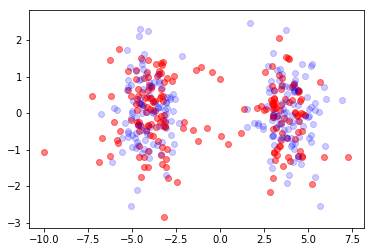

a [-8.18355538e-01  6.96049612e-03  3.88331169e-01 -3.98979992e-02
 -5.49240653e-01  4.22759308e+00  1.41907276e+00 -5.45563033e-01
 -3.00552515e-06 -3.42586141e-03]
b [-1.71390573e+00 -1.85903586e-02 -3.00422687e-02  1.09091767e-01
  4.10077245e-05  2.08971535e-01  2.77379056e+00  5.86444985e-01
  2.19864715e-01 -1.90810811e-01  2.77185555e+00  5.90942871e-01
  2.21623153e-01 -1.92948358e-01]
Step n= 192


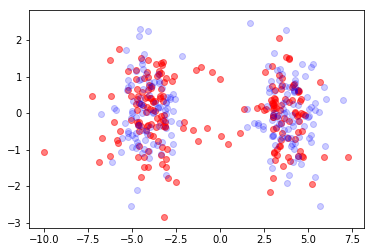

a [-8.18956723e-01  6.90170348e-03  3.86705507e-01 -3.99523921e-02
 -5.49293181e-01  4.23638249e+00  1.41797295e+00 -5.46519471e-01
 -3.21300907e-06 -3.42585266e-03]
b [-1.70221862e+00 -1.87559537e-02 -3.01031656e-02  1.08424493e-01
  1.58476993e-05  2.08139054e-01  2.77417575e+00  5.88052133e-01
  2.20420555e-01 -1.91297390e-01  2.77220804e+00  5.92980325e-01
  2.22305770e-01 -1.93460283e-01]
Step n= 193


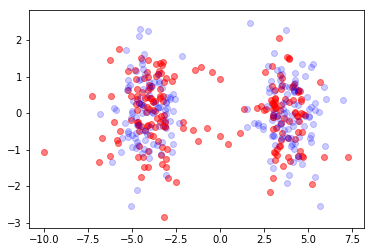

a [-8.19552494e-01  6.84661218e-03  3.85103833e-01 -4.00050117e-02
 -5.49345248e-01  4.24500679e+00  1.41692863e+00 -5.47461980e-01
 -3.44410630e-06 -3.42584392e-03]
b [-1.69045231e+00 -1.89197314e-02 -3.01728499e-02  1.07749816e-01
 -8.52856319e-06  2.07305743e-01  2.77458603e+00  5.89658546e-01
  2.20988137e-01 -1.91776956e-01  2.77258287e+00  5.95062296e-01
  2.23011621e-01 -1.93967184e-01]
Step n= 194


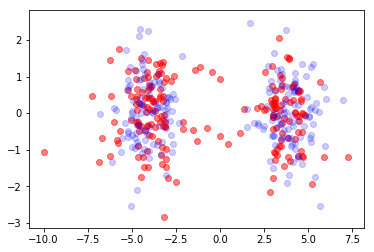

a [-8.20145005e-01  6.79686320e-03  3.83526193e-01 -4.00558570e-02
 -5.49397135e-01  4.25346807e+00  1.41593968e+00 -5.48392060e-01
 -3.70178367e-06 -3.42583517e-03]
b [-1.67860744e+00 -1.90818656e-02 -3.02493499e-02  1.07067789e-01
 -3.21599501e-05  2.06470935e-01  2.77502164e+00  5.91262088e-01
  2.21566788e-01 -1.92249472e-01  2.77298004e+00  5.97191448e-01
  2.23741168e-01 -1.94469194e-01]
Step n= 195


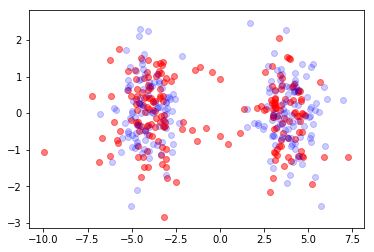

a [-8.20736328e-01  6.75369685e-03  3.81972617e-01 -4.01049519e-02
 -5.49448978e-01  4.26176838e+00  1.41500599e+00 -5.49311179e-01
 -3.98943941e-06 -3.42582641e-03]
b [-1.66668468e+00 -1.92425286e-02 -3.03307556e-02  1.06378461e-01
 -5.50825771e-05  2.05633939e-01  2.77548277e+00  5.92860381e-01
  2.22155744e-01 -1.92714880e-01  2.77339952e+00  5.99370678e-01
  2.24494894e-01 -1.94966438e-01]
Step n= 196


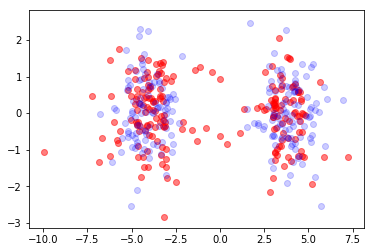

a [-8.21328449e-01  6.71798126e-03  3.80443129e-01 -4.01523407e-02
 -5.49500794e-01  4.26990976e+00  1.41412746e+00 -5.50220765e-01
 -4.31097099e-06 -3.42581765e-03]
b [-1.65468481e+00 -1.94018904e-02 -3.04152762e-02  1.05681884e-01
 -7.73298690e-05  2.04794083e-01  2.77596961e+00  5.94450785e-01
  2.22754151e-01 -1.93173096e-01  2.77384122e+00  6.01603144e-01
  2.25273307e-01 -1.95459028e-01]
Step n= 197


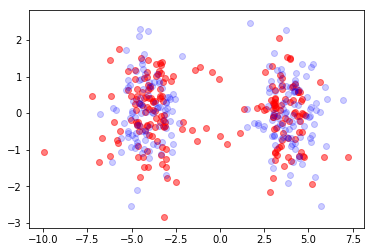

a [-8.21923268e-01  6.69024883e-03  3.78937761e-01 -4.01980838e-02
 -5.49552495e-01  4.27789423e+00  1.41330406e+00 -5.51122201e-01
 -4.67085425e-06 -3.42580889e-03]
b [-1.64260868e+00 -1.95601181e-02 -3.05012830e-02  1.04978103e-01
 -9.89327115e-05  2.03950744e-01  2.77648232e+00  5.96030389e-01
  2.23361056e-01 -1.93624006e-01  2.77430504e+00  6.03892287e-01
  2.26076954e-01 -1.95947058e-01]
Step n= 198


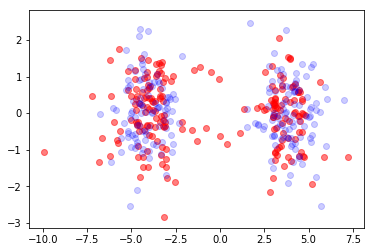

a [-8.22522592e-01  6.67073818e-03  3.77456567e-01 -4.02422532e-02
 -5.49603927e-01  4.28572382e+00  1.41253579e+00 -5.52016822e-01
 -5.07423591e-06 -3.42580012e-03]
b [-1.63045720e+00 -1.97173757e-02 -3.05873395e-02  1.04267165e-01
 -1.19919655e-04  2.03103362e-01  2.77702106e+00  5.97595986e-01
  2.23975409e-01 -1.94067459e-01  2.77479084e+00  6.06241853e-01
  2.26906422e-01 -1.96430603e-01]
Step n= 199
done


In [92]:
#local minimax algorithm, rejction using G, update eta with D
Niter = 200
eps = 1e-6
eta0 = 0.05
eta = eta0
etaC = 2.0

#setting up initial b, and minvar,D
vx = np.cov(x.T)
vy = np.cov(y.T)
mx = np.mean(x,axis=0)
my = np.mean(y,axis=0)
# vxy = np.var(np.concatenate([x.T,y.T]))
D = np.sqrt(np.max([vx[0,0],vx[1,1],vy[0,0],vy[1,1]]))
# mxy = np.mean(np.concatenate([x,y]))
#initial a
a0 = np.zeros(da)
a0[6] = 1/D
a0[8] = 1/D
#initial b
b0 = np.zeros(db)
B0 = 0.5*(la.inv(vy)-la.inv(vx))
b0[3] = B0[0,0]
b0[4] = B0[0,1]+B0[1,0]
b0[5] = B0[1,1]
B1 = la.solve(vx,mx) - la.solve(vy,my)
b0[1] = B1[0]
b0[2] = B1[1]
b0[0] = 0.5*(my.dot(la.solve(vy,my)) - mx.dot(la.solve(vx,mx)))
b0[7] = 1/D
b0[11]=1/D
b0[8:10] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
b0[12:] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
z = np.concatenate([a0,b0],axis=0)
I = np.eye(da+db)
minvar0 = 1e-12
dsq = spatial.distance.cdist(x,y,'sqeuclidean')
minvar = np.amax(np.amin(dsq,axis=1),axis=0) + minvar0
delta0 = np.sqrt(minvar)
dsq2 = spatial.distance.cdist(x,x,'sqeuclidean')
dsq2 += 1000*np.eye(Nx)
minvar2 = np.mean(np.amin(dsq2,axis=1),axis=0) + minvar0
deltainf =  np.sqrt(minvar2)
deltainf = delta0/20 #debug

delta = delta0
#Initial gradient
Gn,Hn = GH(a0,b0,delta,D)
Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])

x0 = x[:,0]
x1 = x[:,1]
x0a7 = x0+z[7]
x0a72 = x0a7**2
x1a9 = x1+z[9]
x1a92 = x1a9**2
argexpT = z[6]**2*x0a72+z[8]**2*x1a92
expT = np.exp(-0.5*argexpT)
T = np.zeros((Nx,2))
T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2*x0a7*expT
T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[8]**2*x1a9*expT

Dn = abs(Mn + mn)
###debug####
listG = []
listD = []
listS = []
lists = []
listeta = []
############

for n in range(Niter):
    Gnold = Gn
    Dnold = Dn
    
    delta = (delta0-deltainf)*np.exp(-5*(n+1)/Niter) + deltainf
    ####Debug########
    listG.append(la.norm(Gn,2))
    listD.append(Dn)
    listS.append(Mn)
    lists.append(mn)
    listeta.append(eta)
    #PLOTS FOR DEBUG
    x0a7 = x0+z[7]
    x1a9 = x1+z[9]
    argexpT = z[6]**2*x0a7**2+z[8]**2*x1a9**2
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
    T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[8]**2 * x1a9*expT
    plt.scatter(T[:,0],T[:,1], color='red', alpha = 0.5);
    plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);
    plt.draw()
    plt.pause(1e-5)
    print('a',z[:da])
    print('b',z[da:])
    print('Step n=',n)
    ##########################################     
    
    if la.norm(Gn,2)<eps:
        break
    #reject moves if bad direction
    baddir = True
    eta = 2.0*eta
    while(baddir and eta>eta0):
        eta = eta/2.0
        dz = la.solve((1.0/eta)*I+Hn,Gn)
        baddir = dz.dot(Gn)<0.0
    z = z - dz
    
    Gn,Hn = GH(z[:da],z[da:],delta,D)
    Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
    Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
    mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])
    Dn = abs(Mn + mn)
    #etamin = eta0/(la.norm(Gn,2)+1)#debug
    if Dn<=Dnold:
        eta = min((etaC+0.1)*eta,1.0/(5+la.norm(Gn,2)))#debug
    else:
        eta = max(eta/etaC, 2.5/(1+la.norm(Gn,2)))
print('done')

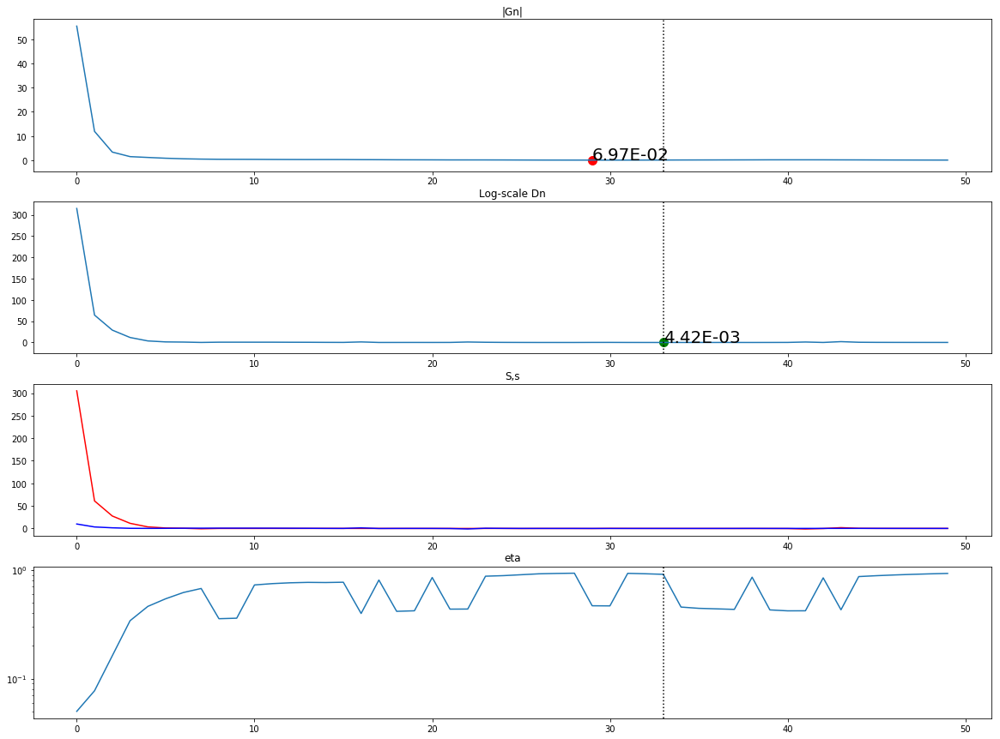

In [10]:
from decimal import Decimal
#####DEBUG#####
#find minimal Gn, Dn
minG = np.min(listG)
iminG = np.argmin(listG)
minD = np.min(np.absolute(listD))
iminD = np.argmin(np.absolute(listD))

fig = plt.figure(figsize=(20,15))

ax1 = fig.add_subplot(4, 1, 1)
ax1.plot(listG)
ax1.scatter(iminG,minG, c = 'r', s = 100)
decG = '%.2E' % Decimal(minG)
ax1.annotate(decG, (iminG,minG+0.1), fontsize=20)
ax1.set_title('|Gn|')
ax1.axvline(iminD, c = 'black', ls = 'dotted')

ax2 = fig.add_subplot(4, 1, 2)
ax2.plot(listD)
ax2.scatter(iminD,minD, c = 'g', s = 100)
decD = '%.2E' % Decimal(minD)
ax2.annotate(decD, (iminD,minD+0.1), fontsize=20)
ax2.axvline(iminD, c = 'black', ls = 'dotted')
ax2.set_title('Log-scale Dn')

ax3 = fig.add_subplot(4, 1, 3)
ax3.plot(listS, c = 'r')
ax3.plot(lists, c = 'b')
ax3.set_title('S,s');

ax4 = fig.add_subplot(4, 1, 4)
ax4.semilogy(listeta)
ax4.axvline(iminD, c = 'black', ls = 'dotted')
ax4.set_title('eta');
###############

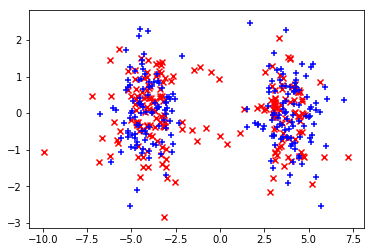

In [94]:
plt.scatter(T[:,0],T[:,1], color='red', marker = 'x');
plt.scatter(y[:,0],y[:,1], color='blue', marker = '+');

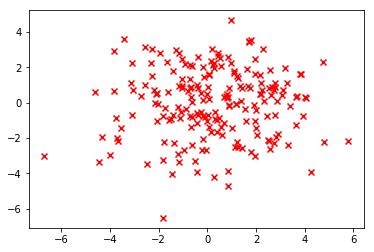

In [119]:
k = 0
plt.scatter((1-k/5)*x[:,0]+(k/5)*T[:,0],(1-k/5)*x[:,1]+(k/5)*T[:,1], color='red', marker = 'x');

## Packaged Algorithm

In [24]:
def local_ot(x,y,Niter=100):#Updates eta using Dn instead of Gn
    d = 2
    Ny = len(y)
    da = 10
    db = 14

    #Precomputed data, (twisted) gradient and Hessian
    # xh = np.concatenate([x.reshape(Nx,d),np.ones((Nx,d))],axis=1)

    gammaA = 2*1e-1 #alpha regularization parameter 
    gammaB = 2*1e-1 #beta regularization parameter

    def GH(a,b,eps,D):
        x0 = x[:,0]
        x1 = x[:,1]
        x0a7 = x0+a[7]
        x0a72 = x0a7**2
        x1a9 = x1+a[9]
        x1a92 = x1a9**2
        x0a7x1a9 = x0a7*x1a9
        argexpT = a[6]**2*x0a72+a[8]**2*x1a92
        expT = np.exp(-0.5*argexpT)
        T = np.zeros((Nx,2))
        T[:,0] = a[0] + (1+a[2])*x0+a[3]*x1+a[5]*a[6]**2*x0a7*expT
        T[:,1] = a[1] + a[3]*x0+(1+a[4])*x1+a[5]*a[8]**2*x1a9*expT
        T0 = T[:,0]
        T1 = T[:,1]
        y0 = y[:,0]
        y1 = y[:,1]
        g0y = b[0]+ b[1]*y0+b[2]*y1+0.5*b[3]*y0**2+b[4]*y0*y1+0.5*b[5]*y1**2
        y0b8 = y0+b[8]
        y1b9 = y1+b[9]
        y0b12 = y0+b[12]
        y1b13 = y1+b[13]
        argexpy1 =  b[7]**2*(y0b8**2+y1b9**2)
        expy1 = np.exp(-0.5*argexpy1)
        argexpy2 =  b[11]**2*(y0b12**2+y1b13**2)
        expy2 = np.exp(-0.5*argexpy2)
        g1y = b[6]*expy1
        g2y = b[10]*expy2
        gy = g0y + g1y + g2y
        g0T =b[0]+ b[1]*T0+b[2]*T1+0.5*b[3]*T0**2+b[4]*T0*T1+0.5*b[5]*T1**2
        T0b8 = T0+b[8]
        T1b9 = T1+b[9]
        T0b12 = T0+b[12]
        T1b13 = T1+b[13]
        argexpT1 =  b[7]**2*(T0b8**2+T1b9**2)
        expT1 = np.exp(-0.5*argexpT1)
        argexpT2 =  b[11]**2*(T0b12**2+T1b13**2)
        expT2 = np.exp(-0.5*argexpT2)
        g1T = b[6]*expT1
        g2T = b[10]*expT2
        gT = g0T + g1T + g2T   

        #first derivatives
        gzT = np.zeros((Nx,2))
        gzT[:,0] = b[1]+b[3]*T0+b[4]*T1
        gzT[:,0] += -b[6]*b[7]**2*T0b8*expT1
        gzT[:,0] += -b[10]*b[11]**2*T0b12*expT2
        gzT[:,1] = b[2]+b[4]*T0+b[5]*T1
        gzT[:,1] += -b[6]*b[7]**2*T1b9*expT1
        gzT[:,1] += -b[10]*b[11]**2*T1b13*expT2

        daT = np.zeros((Nx,da,d))
        daT[:,0,:] = np.array([1,0])
        daT[:,1,:] = np.array([0,1])
        daT[:,2,0] = x0
        daT[:,3,0] = x1
        daT[:,3,1] = x0
        daT[:,4,1] = x1
        daT[:,5,0] = expT*a[6]**2*x0a7
        daT[:,5,1] = expT*a[8]**2*x1a9
        daT[:,6,0] = a[5]*a[6]*expT*x0a7*(2-a[6]**2*x0a72)
        daT[:,6,1] = -a[5]*a[8]**2*a[6]*x0a72*x1a9*expT
        daT[:,7,0] = a[5]*a[6]**2*expT*(1-a[6]**2*x0a72)
        daT[:,7,1] = -a[5]*a[8]**2*a[6]**2*x0a7x1a9*expT
        daT[:,8,0] = -a[5]*a[6]**2*a[8]*x1a92*x0a7*expT
        daT[:,8,1] = a[5]*a[8]*x1a9*(2-a[8]**2*x1a92)*expT
        daT[:,9,0] = -a[5]*a[6]**2*a[8]**2*x0a7x1a9*expT
        daT[:,9,1] = a[5]*a[8]**2*(1-a[8]**2*x1a92)*expT

        #gradient w.r.t. a
        penalty_a = np.zeros(da)
        penalty_a[6] = a[6]*eps**2*np.exp(eps**2*a[6]**2) - 0*1.0/(D**2 * a[6]**3)
        penalty_a[8] = a[8]*eps**2*np.exp(eps**2*a[8]**2) - 0*1.0/(D**2 * a[8]**3)
        penalty_a[7] = a[7] * 1.0/(10*D**2)
        penalty_a[9] = a[9] * 1.0/(10*D**2)
        daL = (1.0/Nx) * np.einsum('ijk,ik->j',daT,gzT) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penalty_a

        expgy = np.exp(gy)
        dbgy = np.zeros((Ny,db))
        dbgT = np.zeros((Nx,db))
        dbgy[:,0] = np.ones(Ny)
        dbgT[:,0] = np.ones(Nx)
        dbgy[:,1] = y0
        dbgT[:,1] = T0
        dbgy[:,2] = y1
        dbgT[:,2] = T1
        dbgy[:,3] = 0.5*y0**2
        dbgT[:,3] = 0.5*T0**2
        dbgy[:,4] = y0*y1
        dbgT[:,4] = T0*T1
        dbgy[:,5] = 0.5*y1**2
        dbgT[:,5] = 0.5*T1**2
        dbgy[:,6] = expy1
        dbgT[:,6] = expT1
        dbgy[:,7] = -b[6]*b[7]*argexpy1*expy1
        dbgT[:,7] = -b[6]*b[7]*argexpT1*expT1
        dbgy[:,8] = -b[6]*b[7]**2*y0b8*expy1
        dbgT[:,8] = -b[6]*b[7]**2*T0b8*expT1
        dbgy[:,9] = -b[6]*b[7]**2*y1b9*expy1
        dbgT[:,9] = -b[6]*b[7]**2*T1b9*expT1
        dbgy[:,10] = expy2
        dbgT[:,10] = expT2
        dbgy[:,11] = -b[10]*b[11]*argexpy2*expy2
        dbgT[:,11] = -b[10]*b[11]*argexpT2*expT2
        dbgy[:,12] = -b[10]*b[11]**2*y0b12*expy2
        dbgT[:,12] = -b[10]*b[11]**2*T0b12*expT2
        dbgy[:,13] = -b[10]*b[11]**2*y1b13*expy2
        dbgT[:,13] = -b[10]*b[11]**2*T1b13*expT2
        #gradient w.r.t. b
        penalty_b = np.zeros(db)
        penalty_b[7] = b[7]*eps**2 * np.exp(eps**2 * b[7]**2) - 1.0/(D**2 * b[7]**3)
        penalty_b[11] = b[11]*eps**2 * np.exp(eps**2 * b[11]**2) - 1.0/(D**2 * b[11]**3)
        penalty_b[8] = b[8] * 1.0/(10*D**2)
        penalty_b[9] = b[9] * 1.0/(10*D**2)
        penalty_b[12] = b[12] * 1.0/(10*D**2)
        penalty_b[13] = b[13] * 1.0/(10*D**2)
        dbL = (1.0/Nx)*np.sum(dbgT,axis=0) - (1.0/Ny)*np.einsum('ik,i->k',dbgy,expgy) - gammaB*penalty_b

        #twisted gradient
        G = np.concatenate([daL,-dbL],axis=0)

        #Second derivatives
        gzzT = np.zeros((Nx,d,d))
        gzzT[:,0,0] = b[3] - b[6]*b[7]**2*(1-b[7]**2*T0b8**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12**2)*expT2
        gzzT[:,1,0] = b[4] - b[6]*b[7]**2*(1-b[7]**2*T0b8*T1b9)*expT1-b[10]*b[11]**2*(1-b[11]**2*T0b12*T1b13)*expT2
        gzzT[:,0,1] = gzzT[:,1,0]
        gzzT[:,1,1] = b[5] - b[6]*b[7]**2*(1-b[7]**2*T1b9**2)*expT1-b[10]*b[11]**2*(1-b[11]**2*T1b13**2)*expT2

        daaT = np.zeros((Nx,da,da,d))
        daaT[:,5,6,0] = a[6]*x0a7*expT*(2-a[6]**2*x0a72)
        daaT[:,6,5,0] = daaT[:,5,6,0]
        daaT[:,5,6,1] = -a[8]**2*a[6]*x0a72*x1a9*expT
        daaT[:,6,5,1] = daaT[:,5,6,1]
        daaT[:,5,7,0] = a[6]**2*expT*(1-a[6]**2*x0a72)
        daaT[:,7,5,0] = daaT[:,5,7,0]
        daaT[:,5,7,1] = -a[8]**2*a[6]**2*x0a7x1a9*expT
        daaT[:,7,5,1] = daaT[:,5,7,1]
        daaT[:,5,8,0] = -a[6]**2*a[8]*x1a92*x0a7*expT
        daaT[:,8,5,0] = daaT[:,5,8,0]
        daaT[:,5,8,1] = a[8]*x1a9*(2-a[8]**2*x1a92)*expT
        daaT[:,8,5,1] = daaT[:,5,8,1]
        daaT[:,5,9,0] = -a[6]**2*a[8]**2*x0a7x1a9*expT
        daaT[:,9,5,0] = daaT[:,5,9,0]
        daaT[:,5,9,1] = a[8]**2*(1-a[8]**2*x1a92)*expT
        daaT[:,9,5,1] = daaT[:,5,9,1]
        daaT[:,6,6,0] = a[5]*x0a7*expT*(2-3*a[6]**2*x0a72-a[6]**2*(2-a[6]**2*x0a72)*x0a72)
        daaT[:,6,6,1] = -a[5]*a[8]**2*x0a72*(1-a[6]**2*x0a72)*x1a9*expT
        daaT[:,6,7,0] = a[5]*a[6]*expT*(2-5*a[6]**2*x0a72+a[6]**4*x0a7**4)
        daaT[:,6,7,1] = -a[5]*a[8]**2*x0a7x1a9*a[6]*(2-a[6]**2*x0a72)*expT
        daaT[:,7,6,0] = daaT[:,6,7,0]
        daaT[:,7,6,1] = daaT[:,6,7,1]
        daaT[:,6,8,0] = -a[5]*a[6]*x0a7*a[8]*x1a92*(2-a[6]**2*x0a72)*expT
        daaT[:,8,6,0] = daaT[:,6,8,0]
        daaT[:,6,8,1] = -a[5]*a[8]*expT*x1a9*x0a72*a[6]*(2-a[8]**2*x1a92)
        daaT[:,8,6,1] = daaT[:,6,8,1]
        daaT[:,6,9,0] = -a[5]*a[6]*expT*x0a7x1a9*a[8]**2*(2-a[6]**2*x0a72)
        daaT[:,9,6,0] = daaT[:,6,9,0]
        daaT[:,6,9,1] = -a[5]*a[8]**2*a[6]*x0a72*(1-a[8]**2*x1a92)*expT
        daaT[:,9,6,1] = daaT[:,6,9,1]
        daaT[:,7,7,0] = -a[5]*a[6]**2*(2*a[6]**2*x0a7+(1-a[6]**2*x0a72)*a[6]**2*x0a7)*expT
        daaT[:,7,7,1] = -a[5]*a[8]**2*x1a9*a[6]**2*(1-a[6]**2*x0a72)*expT
        daaT[:,7,8,0] = -a[5]*a[6]**2*a[8]*x1a92*(1-a[6]**2*x0a72)*expT
        daaT[:,8,7,0] = daaT[:,7,8,0]
        daaT[:,7,8,1] = -a[5]*a[8]*x0a7x1a9*a[6]**2*(2-a[8]**2*x1a92)*expT
        daaT[:,8,7,1] = daaT[:,7,8,1]
        daaT[:,7,9,0] = -a[5]*a[6]**2*a[8]**2*x1a9*(1-a[6]**2*x0a72)*expT
        daaT[:,9,7,0] = daaT[:,7,9,0]
        daaT[:,7,9,1] = -a[5]*a[8]**2*a[6]**2*x0a7*(1-a[8]**2*x1a92)*expT
        daaT[:,9,7,1] = daaT[:,7,9,1]
        daaT[:,8,8,0] = -a[5]*a[6]*x1a92*x0a7*(1-a[8]**2*x1a92)*expT
        daaT[:,8,8,1] = a[5]*x1a9*(2-3*a[8]**2*x1a92-a[8]**2*(2-a[8]**2*x1a92)*x1a92)*expT
        daaT[:,8,9,0] = -a[5]*a[6]**2*x0a7x1a9*a[8]*(2-a[8]**2*x1a92)*expT
        daaT[:,9,8,0] = daaT[:,8,9,0]
        daaT[:,8,9,1] = a[5]*a[8]*(2-5*a[8]**2*x1a92+a[8]**4*x1a9**4)*expT
        daaT[:,9,8,1] = daaT[:,8,9,1]
        daaT[:,9,9,0] = -a[5]*a[6]**2*x0a7*a[8]**2*(1-a[8]**2*x1a92)*expT
        daaT[:,9,9,1] = -a[5]*a[8]**2*(2*a[8]**2*x1a9+(1-a[8]**2*x1a92)*a[8]**2*x1a9)*expT
        #Hessian w.r.t. aa
        penaltyH_a = np.zeros((da,da))
        penaltyH_a[6,6] = eps**2 * np.exp((a[6]*eps)**2)*(1.0+2.0*a[6]**2*eps**2) + 0*3/(D**2 * a[6]**4)
        penaltyH_a[8,8] = eps**2 * np.exp((a[8]*eps)**2)*(1.0+2.0*a[8]**2*eps**2) + 0*3/(D**2 * a[8]**4)
        penaltyH_a[7,7] = 1*1.0/(10*D**2)
        penaltyH_a[9,9] = 1*1.0/(10*D**2)
        daaL = (1.0/Nx)*(np.einsum('ijkl,il->jk',daaT,gzT) + np.einsum('ijl,ilm,ikm->jk',daT,gzzT,daT)) + gammaA*(0.00+(1/(2*Nx))*la.norm(gzT))*penaltyH_a

        dbzgT = np.zeros((Nx,db,d))
        dbzgT[:,1,0]=np.ones(Nx)
        dbzgT[:,2,1]=np.ones(Nx)
        dbzgT[:,3,0]=T0
        dbzgT[:,4,0]=T1
        dbzgT[:,4,1]=T0
        dbzgT[:,5,1]=T1
        dbzgT[:,6,0]=-b[6]**2*T0b8*expT1
        dbzgT[:,6,1]=-b[6]**2*T1b9*expT1
        dbzgT[:,7,0]=-b[6]*b[7]*expT1*T0b8*(2-argexpT1)
        dbzgT[:,7,1]=-b[6]*b[7]*expT1*T1b9*(2-argexpT1)
        dbzgT[:,8,0]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T0b8**2)
        dbzgT[:,8,1]=b[6]*b[7]**4*expT1*T0b8*T1b9
        dbzgT[:,9,0]=dbzgT[:,8,1]
        dbzgT[:,9,1]=-b[6]*b[7]**2*expT1*(1-b[7]**2*T1b9**2)
        dbzgT[:,10,0]=-b[10]**2*T0b12*expT2
        dbzgT[:,10,1]=-b[10]**2*T1b13*expT2
        dbzgT[:,11,0]=-b[10]*b[11]*expT2*T0b12*(2-argexpT2)
        dbzgT[:,11,1]=-b[10]*b[11]*expT2*T1b13*(2-argexpT2)
        dbzgT[:,12,0]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T0b12**2)
        dbzgT[:,12,1]=b[10]*b[11]**4*expT2*T0b12*T1b13
        dbzgT[:,13,0]=dbzgT[:,12,1]
        dbzgT[:,13,1]=-b[10]*b[11]**2*expT2*(1-b[11]**2*T1b13**2)
        # #Hessian w.r.t. ab
        dabL = (1.0/Nx)*np.einsum('ikl,ijl->jk',dbzgT,daT)

        dbbgy = np.zeros((Ny,db,db))
        dbbgT = np.zeros((Nx,db,db))
        dbbgy[:,6,7] = -b[7]*(y0b8**2+y1b9**2)*expy1
        dbbgy[:,7,6] = dbbgy[:,6,7]
        dbbgy[:,6,8] = -b[7]**2*y0b8*expy1
        dbbgy[:,8,6] = dbbgy[:,6,8]
        dbbgy[:,6,9] = -b[7]**2*y1b9*expy1
        dbbgy[:,9,6] = dbbgy[:,6,9]
        dbbgy[:,7,7] = -b[6]*(y0b8**2+y1b9**2)*expy1*(1-argexpy1)
        dbbgy[:,7,8] = -b[6]*b[7]*expy1*y0b8*(2-argexpy1)
        dbbgy[:,8,7] = dbbgy[:,7,8]
        dbbgy[:,7,9] = -b[6]*b[7]*expy1*y1b9*(2-argexpy1)
        dbbgy[:,9,7] = dbbgy[:,7,9]
        dbbgy[:,8,8] = -b[6]*b[7]**2*expy1*(1-y0b8**2*b[7]**2)
        dbbgy[:,8,9] = b[6]*b[7]**4*y0b8*y1b9*expy1
        dbbgy[:,9,8] = dbbgy[:,8,9] 
        dbbgy[:,9,9] = -b[6]*b[7]**2*expy1*(1-y1b9**2*b[7]**2)
        dbbgy[:,10,11] = -b[11]*(y0b12**2+y1b13**2)*expy2
        dbbgy[:,11,10] = dbbgy[:,10,11]
        dbbgy[:,10,12] = -b[11]**2*y0b12*expy2
        dbbgy[:,12,10] = dbbgy[:,10,12]
        dbbgy[:,10,13] = -b[11]**2*y1b13*expy2
        dbbgy[:,13,10] = dbbgy[:,10,13]
        dbbgy[:,11,11] = -b[10]*(y0b12**2+y1b13**2)*expy2*(1-argexpy2)
        dbbgy[:,11,12] = -b[10]*b[11]*expy2*y0b12*(2-argexpy2)
        dbbgy[:,12,11] = dbbgy[:,11,12]
        dbbgy[:,11,13] = -b[10]*b[11]*expy2*y1b13*(2-argexpy2)
        dbbgy[:,13,11] = dbbgy[:,11,13]
        dbbgy[:,12,12] = -b[10]*b[11]**2*expy2*(1-y0b12**2*b[11]**2)
        dbbgy[:,12,13] = b[10]*b[11]**4*y0b12*y1b13*expy2
        dbbgy[:,13,12] = dbbgy[:,12,13] 
        dbbgy[:,13,13] = -b[10]*b[11]**2*expy2*(1-y1b13**2*b[11]**2)
        dbbgT[:,6,7] = -b[7]*(T0b8**2+T1b9**2)*expT1
        dbbgT[:,7,6] = dbbgT[:,6,7]
        dbbgT[:,6,8] = -b[7]**2*T0b8*expT1
        dbbgT[:,8,6] = dbbgT[:,6,8]
        dbbgT[:,6,9] = -b[7]**2*T1b9*expT1
        dbbgT[:,9,6] = dbbgT[:,6,9]
        dbbgT[:,7,7] = -b[6]*(T0b8**2+T1b9**2)*expT1*(1-argexpT1)
        dbbgT[:,7,8] = -b[6]*b[7]*expT1*T0b8*(2-argexpT1)
        dbbgT[:,8,7] = dbbgT[:,7,8]
        dbbgT[:,7,9] = -b[6]*b[7]*expT1*T1b9*(2-argexpT1)
        dbbgT[:,9,7] = dbbgT[:,7,9]
        dbbgT[:,8,8] = -b[6]*b[7]**2*expT1*(1-T0b8**2*b[7]**2)
        dbbgT[:,8,9] = b[6]*b[7]**4*T0b8*T1b9*expT1
        dbbgT[:,9,8] = dbbgT[:,8,9] 
        dbbgT[:,9,9] = -b[6]*b[7]**2*expT1*(1-T1b9**2*b[7]**2)
        dbbgT[:,10,11] = -b[11]*(T0b12**2+T1b13**2)*expT2
        dbbgT[:,11,10] = dbbgT[:,10,11]
        dbbgT[:,10,12] = -b[11]**2*T0b12*expT2
        dbbgT[:,12,10] = dbbgT[:,10,12]
        dbbgT[:,10,13] = -b[11]**2*T1b13*expT2
        dbbgT[:,13,10] = dbbgT[:,10,13]
        dbbgT[:,11,11] = -b[10]*(T0b12**2+T1b13**2)*expT2*(1-argexpT2)
        dbbgT[:,11,12] = -b[10]*b[11]*expT2*T0b12*(2-argexpT2)
        dbbgT[:,12,11] = dbbgT[:,11,12]
        dbbgT[:,11,13] = -b[10]*b[11]*expT2*T1b13*(2-argexpT2)
        dbbgT[:,13,11] = dbbgT[:,11,13]
        dbbgT[:,12,12] = -b[10]*b[11]**2*expT2*(1-T0b12**2*b[11]**2)
        dbbgT[:,12,13] = b[10]*b[11]**4*T0b12*T1b13*expT2
        dbbgT[:,13,12] = dbbgT[:,12,13] 
        dbbgT[:,13,13] = -b[10]*b[11]**2*expT2*(1-T1b13**2*b[11]**2)

        dbgdbg = np.einsum('jn,jm->jnm',dbgy,dbgy)
        #Hessian w.r.t. bb
        penaltyH_b = np.zeros((db,db))
        # penaltyH_b[5,5] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
        # penaltyH_b[8,8] = 1*1.0/(10*D**2)+1*6*eps**2 *(b[5]-b[8])**(-4)
        # penaltyH_b[5,8] = -1*6*eps**2 *(b[5]-b[8])**(-4)
        # penaltyH_b[8,5] = -1*6*eps**2 *(b[5]-b[8])**(-4)
        penaltyH_b[7,7] = eps**2 * np.exp((b[7]*eps)**2)*(1.0+2.0*b[7]**2*eps**2) + 3/(D**2 * b[7]**4)
        penaltyH_b[8,8] = 1*1.0/(10*D**2)
        penaltyH_b[9,9] = 1*1.0/(10*D**2)
        penaltyH_b[11,11] = eps**2 * np.exp((b[11]*eps)**2)*(1.0+2.0*b[11]**2*eps**2) + 3/(D**2 * b[11]**4)
        penaltyH_b[12,12] = 1*1.0/(10*D**2)
        penaltyH_b[13,13] = 1*1.0/(10*D**2)
        dbbL = (1.0/Nx)*np.sum(dbbgT,axis=0) - (1.0/Ny)*np.einsum('jnm,j->nm',(dbbgy+dbgdbg),expgy) - gammaB*penaltyH_b

        # #Twisted Hessian
        H = np.zeros((da+db,da+db))
        H[:da,:da] = daaL
        H[:da,da:] = dabL
        H[da:,:da] = -dabL.T
        H[da:,da:] = -dbbL
        return(G,H)     
    #local minimax algorithm, rejction using G, update eta with D
#     Niter = 50
    eps = 1e-6
    eta0 = 0.05
    eta = eta0
    etaC = 2.0

    #setting up initial b, and minvar,D
    vx = np.cov(x.T)
    vy = np.cov(y.T)
    mx = np.mean(x,axis=0)
    my = np.mean(y,axis=0)
    # vxy = np.var(np.concatenate([x.T,y.T]))
    D = np.sqrt(np.max([vx[0,0],vx[1,1],vy[0,0],vy[1,1]]))
    # mxy = np.mean(np.concatenate([x,y]))
    #initial a
    a0 = np.zeros(da)
    a0[6] = 1/D
    a0[8] = 1/D
    #initial b
    b0 = np.zeros(db)
    B0 = 0.5*(la.inv(vy)-la.inv(vx))
    b0[3] = B0[0,0]
    b0[4] = B0[0,1]+B0[1,0]
    b0[5] = B0[1,1]
    B1 = la.solve(vx,mx) - la.solve(vy,my)
    b0[1] = B1[0]
    b0[2] = B1[1]
    b0[0] = 0.5*(my.dot(la.solve(vy,my)) - mx.dot(la.solve(vx,mx)))
    b0[7] = 1/D
    b0[11]= 1/D
    b0[8:10] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
    b0[12:] = 0.1*np.random.uniform(low=-1.0,high=1.0,size=2)
    z = np.concatenate([a0,b0],axis=0)
    I = np.eye(da+db)
    minvar0 = 1e-12
    dsq = spatial.distance.cdist(x,y,'sqeuclidean')
    minvar = np.amax(np.amin(dsq,axis=1),axis=0) + minvar0
    delta0 = np.sqrt(minvar)
    dsq2 = spatial.distance.cdist(x,x,'sqeuclidean')
    dsq2 += 1000*np.eye(Nx)
    minvar2 = np.mean(np.amin(dsq2,axis=1),axis=0) + minvar0
    deltainf =  np.sqrt(minvar2)
    deltainf = delta0/20 #debug

    delta = delta0
    #Initial gradient
    Gn,Hn = GH(a0,b0,delta,D)
    Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
    Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
    mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])

    x0 = x[:,0]
    x1 = x[:,1]
    x0a7 = x0+z[7]
    x0a72 = x0a7**2
    x1a9 = x1+z[9]
    x1a92 = x1a9**2
    argexpT = z[6]**2*x0a72+z[8]**2*x1a92
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2*x0a7*expT
    T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[8]**2*x1a9*expT

    Dn = abs(Mn + mn)
    ###debug####
#     listG = []
#     listD = []
#     listS = []
#     lists = []
#     listeta = []
    ############

    for n in range(Niter):
        Gnold = Gn
        Dnold = Dn

        delta = (delta0-deltainf)*np.exp(-5*(n+1)/Niter) + deltainf
        ####Debug########
#         listG.append(la.norm(Gn,2))
#         listD.append(Dn)
#         listS.append(Mn)
#         lists.append(mn)
#         listeta.append(eta)
#         #PLOTS FOR DEBUG
#         x0a7 = x0+z[7]
#         x1a9 = x1+z[9]
#         argexpT = z[6]**2*x0a7**2+z[8]**2*x1a9**2
#         expT = np.exp(-0.5*argexpT)
#         T = np.zeros((Nx,2))
#         T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2 * x0a7*expT
#         T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[8]**2 * x1a9*expT
#         plt.scatter(T[:,0],T[:,1], color='red', alpha = 0.5);
#         plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);
#         plt.draw()
#         plt.pause(1e-5)
#         print('a',z[:da])
#         print('b',z[da:])
#         print('Step n=',n)
        ##########################################     

        if la.norm(Gn,2)<eps:
            break
        #reject moves if bad direction
        baddir = True
        eta = 2.0*eta
        while(baddir and eta>eta0):
            eta = eta/2.0
            dz = la.solve((1.0/eta)*I+Hn,Gn)
            baddir = dz.dot(Gn)<0.0
        z = z - dz

        Gn,Hn = GH(z[:da],z[da:],delta,D)
        Hxx = Hn[:da,:da]; Hyy = Hn[da:,da:]; Gx = Gn[:da]; Gy = Gn[da:]
        Mn = Gx.T.dot(la.lstsq(Hxx,Gx)[0])
        mn = Gy.T.dot(la.lstsq(Hyy,Gy)[0])
        Dn = abs(Mn + mn)
        #etamin = eta0/(la.norm(Gn,2)+1)#debug
        if Dn<=Dnold:
            eta = min((etaC+0.1)*eta,1.0/(1+la.norm(Gn,2)))#debug
        else:
            eta = max(eta/etaC, 0.5/(1+la.norm(Gn,2)))
    a,b = z[:da],z[da:]
    x0a7 = x0+z[7]
    x0a72 = x0a7**2
    x1a9 = x1+z[9]
    x1a92 = x1a9**2
    argexpT = z[6]**2*x0a72+z[8]**2*x1a92
    expT = np.exp(-0.5*argexpT)
    T = np.zeros((Nx,2))
    T[:,0] = z[0] + (1+z[2])*x0+z[3]*x1+z[5]*z[6]**2*x0a7*expT
    T[:,1] = z[1] + z[3]*x0+(1+z[4])*x1+z[5]*z[8]**2*x1a9*expT
    return(T,a,b)

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:358: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:359: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:423: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we adv

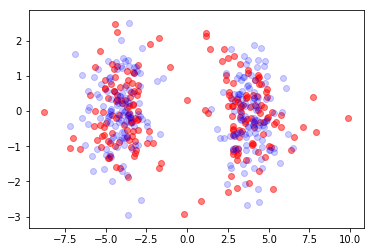

In [25]:
Txa,a,b = local_ot(x,y,Niter=200)
#plots
plt.scatter(Txa[:,0],Txa[:,1], color='red', alpha = 0.5);
plt.scatter(y[:,0],y[:,1], color='blue', alpha = 0.2);

# Global Algorithm

## Open Version

In [16]:
def idx_choice(x,y):
    Nx = len(x)
    Ny = len(y)
    #assignement for x:
    idxx = np.zeros(Nx)
    q = int(Nx/Ny)
    r = Nx % Ny
    for i in range(q):
        idxx[i*Ny:(i+1)*Ny] = np.random.choice(np.arange(Ny),Ny,replace=False)
    if r!=0: 
        idxx[-r:] = np.random.choice(np.arange(Ny),r,replace=False)
    #assignement for y:
    idxy = np.zeros(Ny)
    q = int(Ny/Nx)
    r = Ny % Nx
    for i in range(q):
        idxy[i*Nx:(i+1)*Nx] = np.random.choice(np.arange(Nx),Nx,replace=False)
    if r!=0: 
        idxy[-r:] = np.random.choice(np.arange(Nx),r,replace=False)
    return(y[idxx.astype(int)],x[idxy.astype(int)])   

0.0


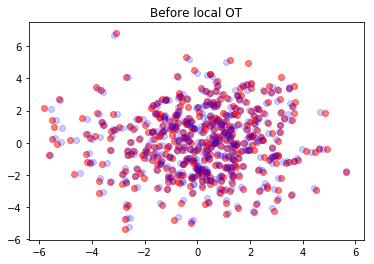

/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:358: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:359: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
/home/monty/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:423: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we adv

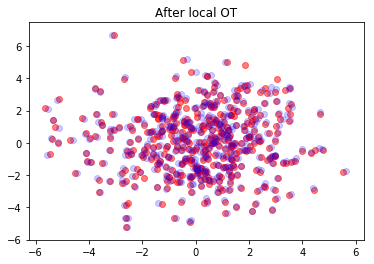

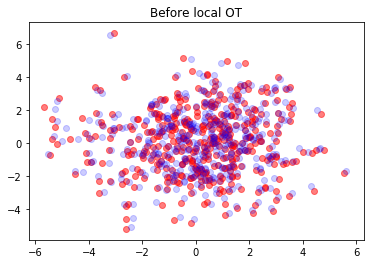

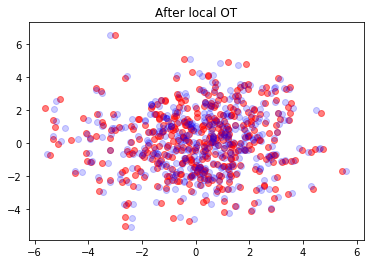

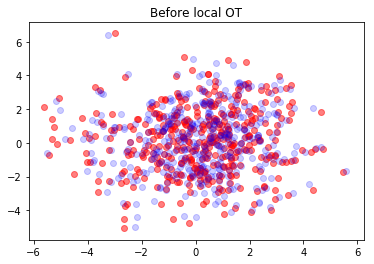

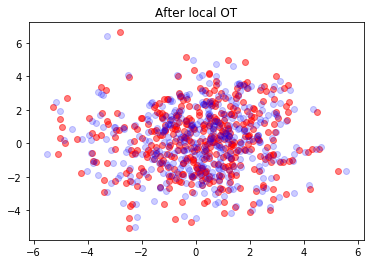

...

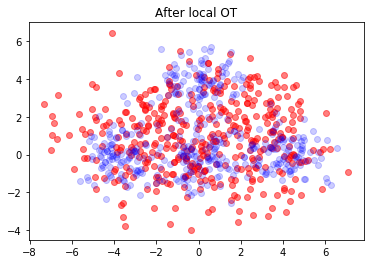

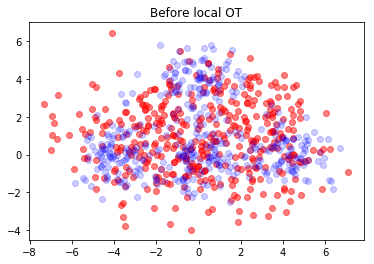

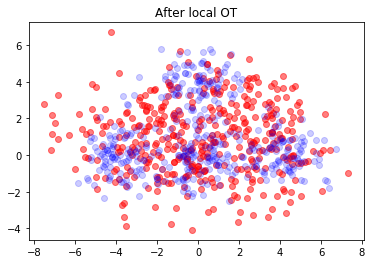

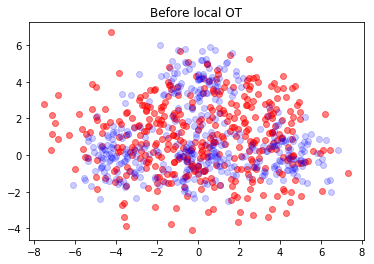

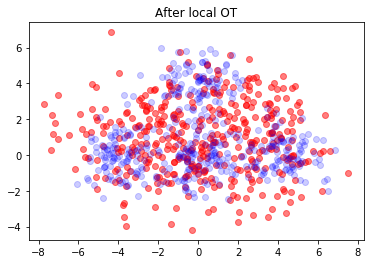

1.0


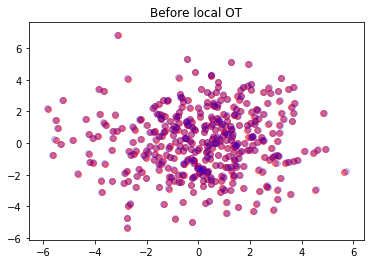

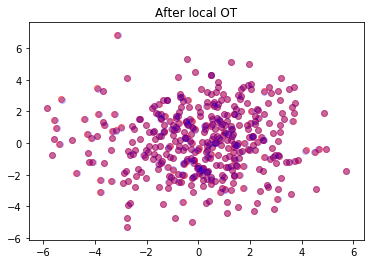

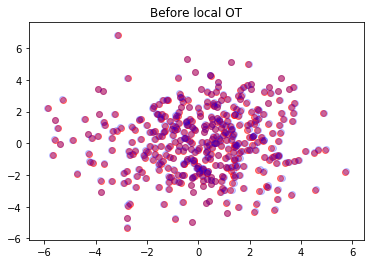

KeyboardInterrupt: 

In [51]:
K = 40
Maxiter = 100
tol = 1e-2

Nx = len(x)
Ny = len(y) 
a_maps = K*[0]
b_maps = K*[0]

# #Initialize intermediary distributions with random selections for x
# x_K = np.array([y[np.random.randint(0,Ny)] for i in range(Nx)])
# mu = []
# mu.append(x)
# for k in range(1,K):
#     z = (1-k/K)*x+(k/K)*x_K
#     mu.append(z)
# mu.append(y)

#Initialize intermediary distributions both from x and y
x_K, y_0 = idx_choice(x,y)
mu = []
mu.append(x)
for k in range(1,K):
    z0k = (1-k/K)*x+(k/K)*x_K
    rdcx = np.random.choice(np.arange(Nx),int(Nx*(1-k/K)),replace=False)
    zx = z0k[rdcx]
    zKk = (1-k/K)*y_0+(k/K)*y
    rdcy = np.random.choice(np.arange(Ny),int(Ny*k/K),replace=False)
    zy = zKk[rdcy]
    z = np.concatenate([zx,zy])
    mu.append(z)
mu.append(y)
    

for niter in range(Maxiter):
    print(niter/Maxiter * 100)#debug
    x_Kold=x_K
    #solve local OT's
    z = x
    for k in range(1,K+1):
#         #plot before transport
#         bins = 35
#         plt.hist(z,density=True, bins=bins, color='red', alpha = 0.5);
#         plt.hist(mu[k],density=True, bins=bins, color='blue', alpha = 0.5);
        plt.scatter(z[:,0],z[:,1], color='red', alpha = 0.5);
        plt.scatter(mu[k][:,0],mu[k][:,1], color='blue', alpha = 0.2);
        plt.title('Before local OT')
        plt.draw()
        plt.show()
        
        #solve local transport problem
        Tloc,a,b = local_ot(z,mu[k],Niter=200)
        
        #plot after transport
#         bins = 35
#         plt.hist(Tloc,density=True, bins=bins, color='red', alpha = 0.5);
#         plt.hist(mu[k],density=True, bins=bins, color='blue', alpha = 0.5);
        plt.scatter(Tloc[:,0],Tloc[:,1], color='red', alpha = 0.5);
        plt.scatter(mu[k][:,0],mu[k][:,1], color='blue', alpha = 0.2);
        plt.title('After local OT')
        plt.draw()
        plt.show()
        
        a_maps[k-1] = a
        b_maps[k-1] = b
        z = Tloc
    x_K = z
    if (1/Nx)*la.norm(x_K-x_Kold,2)<tol:
        break
    #update intermediate distributions
    for k in range(1,K):
        mu[k] = (1-k/K)*x+(k/K)*x_K

print('done')

In [65]:
a_maps

[array([-0.03008915,  0.07833687,  0.1265522 , -0.04854289, -0.15368078,
         0.57292706,  1.17501369, -0.01085413,  0.00233698]),
 array([-0.02556904,  0.0654047 ,  0.15202215, -0.03565918, -0.09996498,
         0.39658729,  0.91800079, -0.02067183,  0.04753754]),
 array([-0.03453664,  0.09188035,  0.1089404 , -0.04449053, -0.17705194,
         0.85927111,  1.26901817, -0.03183507,  0.05382228]),
 array([-0.01174993,  0.06064926,  0.17256342, -0.01801265,  0.01806681,
        -0.10587343,  0.52201895,  0.00116436,  0.00171321]),
 array([-3.24698206e-02,  4.18408908e-02,  1.09187398e-01, -1.22383746e-02,
         1.82682573e-03,  1.91228916e-01,  5.46643634e-01,  5.33196720e-04,
         1.39133866e-03]),
 array([-0.00415328,  0.05508523,  0.0884413 , -0.0173051 , -0.04673458,
         0.40706274,  0.71978852, -0.00702059,  0.00101159]),
 array([-0.02598852,  0.0565416 ,  0.09142866, -0.01422672, -0.02564225,
         0.29774306,  0.59639063, -0.00460458, -0.00169195]),
 array([-0.

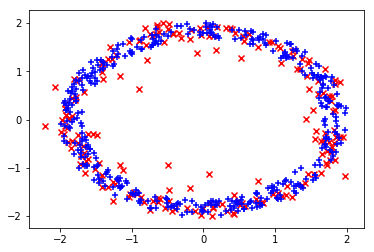

In [81]:
plt.scatter(x_K[:,0],x_K[:,1], color='red', marker = 'x');
plt.scatter(y[:,0],y[:,1], color='blue', marker = '+');

## Packaged version

In [ ]:
def sot(x,y,K=10,tol=1e-1,Maxiter=50):
    Nx = len(x)
    Ny = len(y) 
    c_maps = K*[0]
    a_maps = K*[0]
    b_maps = K*[0]
    #Initialize intermediary distributions
    x_K = np.array([y[np.random.randint(0,Ny)] for i in range(Nx)])
    mu = []
    mu.append(x)
    for k in range(1,K):
        z = (1-k/K)*x+(k/K)*x_K
        mu.append(z)
    mu.append(y)
    
#     #plots
#     plt.figure(figsize=(20, 4))
#     for i in range(K+1):
#         plt.subplot(1, K+1, i+1)
#         plt.scatter(mu[i],np.zeros_like(mu[i]))
#     plt.draw()
#     plt.show()
    
    for niter in range(Maxiter):
        print(niter/Maxiter * 100)#debug
        x_Kold=x_K
        #solve local OT's
        z = x
        for k in range(1,K+1):
            Tloc,c,a,b = local_ot2(z,mu[k])
            c_maps[k-1] = c
            a_maps[k-1] = a
            b_maps[k-1] = b
            z = Tloc
        x_K = z
        if (1/Nx)*np.linalg.norm(x_K-x_Kold,2)<tol:
            break
        #update intermediate distributions
        for k in range(1,K):
            mu[k] = (1-k/K)*x+(k/K)*x_K
        
#         #plots
#         plt.figure(figsize=(20, 4))
#         for i in range(K+1):
#             plt.subplot(1, K+1, i+1)
#             plt.scatter(mu[i],np.zeros_like(mu[i]))
#         plt.draw()
#         plt.show()
        
    return(x_K, c_maps, a_maps, b_maps)

In [ ]:
Txa,c,a,b = sot(x,y)

In [ ]:
#plots
bins = 35
plt.hist(Txa,density=True, bins=bins, color='red', alpha = 0.5);
plt.hist(y,density=True, bins=bins, color='blue', alpha = 0.5);

In [ ]:
plt.scatter(Txa,np.zeros_like(Txa),color='red',alpha = 0.3);
plt.scatter(y,np.zeros_like(y), color='blue',alpha = 0.15);
# plt.scatter(x,np.zeros_like(x), color='green',alpha = 0.3);

In [ ]:
index = np.argsort(x)
u = Txa-x
plt.plot(x[index],u[index]);

In [ ]:
sumb = [np.sum([b[i][k] for i in range(len(b))]) for k in range(len(b[0]))]

In [ ]:
#Grid
m = min(min(x),min(y))
M = max(max(x),max(y))
NumKnots = 5
delta = (M-m)/(NumKnots-1)
g = np.array([m+delta*i for i in range(NumKnots)])
#Splines
def F1(z):
    if z<0:
        return 0
    elif z>1:
        return z-1/2
    else:
        return z**2/2
def F2(z):
    if z<0:
        return 0
    elif z>1:
        return z-2/3
    else:
        return z**3/3
def DF1(z):
    if z<0:
        return 0
    elif z>1:
        return 1
    else:
        return z
def DF2(z):
    if z<0:
        return 0
    elif z>1:
        return 1
    else:
        return z**2
def D2F1(z):
    if z<0:
        return 0
    elif z>1:
        return 0
    else:
        return 1
def D2F2(z):
    if z<0:
        return 0
    elif z>1:
        return 0
    else:
        return 2*z 
f = []
Df = []
D2f = []
f.append(lambda z: 1)
f.append(lambda z: z)
Df.append(lambda z: 0)
Df.append(lambda z: 1)
D2f.append(lambda z: 0)
D2f.append(lambda z: 0)
for t in range(NumKnots-1):
    f.append(lambda z, tl=t: F1((z-g[tl])/(g[tl+1]-g[tl])))
    f.append(lambda z, tl=t: F2((z-g[tl])/(g[tl+1]-g[tl])))
    Df.append(lambda z, tl=t: (1/(g[tl+1]-g[tl]))*DF1((z-g[tl])/(g[tl+1]-g[tl])))
    Df.append(lambda z, tl=t: (1/(g[tl+1]-g[tl]))*DF2((z-g[tl])/(g[tl+1]-g[tl])))
    D2f.append(lambda z, tl=t: (1/(g[tl+1]-g[tl])**2)*D2F1((z-g[tl])/(g[tl+1]-g[tl])))
    D2f.append(lambda z, tl=t: (1/(g[tl+1]-g[tl])**2)*D2F2((z-g[tl])/(g[tl+1]-g[tl])))
T = 2*NumKnots

In [ ]:
gtest = lambda z: np.sum([sumb[k]*f[k](z) for k in range(len(f))])

In [ ]:
zs = np.arange(-6,6,14/20)
plt.plot(zs,[gtest(zs[k]) for k in range(len(zs))])